# Dados orçamentários e execução da despesa

In [1]:
import pandas as pd
import numpy as np
import zipfile
import requests
import io
import matplotlib.pyplot as pl
from glob import glob
import utils as xu
import xavy.plots as xp
import correlation as xc

## Funções

In [2]:
def download_zip_data(url, save_dir, verbose=False):
    """
    Download a zip file at `url` web address, unzip it and save it to `save_dir`.
    """
    # Initialize session:
    session = requests.session()
    session.mount('http://', requests.adapters.HTTPAdapter(max_retries=3))
    
    # Download data:
    if verbose:
        print('Downloading ' + url)
    response = session.get(url, timeout=900)
    
    # Unzip data if download is successful:
    if response.status_code == 200:
        if verbose:
            print('Unzipping data to ' + save_dir)
        z = zipfile.ZipFile(io.BytesIO(response.content))
        z.extractall(save_dir)
    else:
        if verbose:
            print('Failed with status code', response.status_codeatus_code)
    
    return response.status_code   

In [3]:
def check_guarda_compartilhada(df, col_subordinada, col_raiz, drop_unique=True):
    """
    Return a Series whose index are the unique
    entries in `df` (DataFrame) column `col_subordinada`
    and values are arrays of unique entries in `col_raiz`
    (str) that appear in `df` associated to each index.
    
    This function can be used to:
    - Double check that elements in `col_subordinada`
      are subdivisions of `col_raiz` completely contained
      in each element of `col_raiz`.
    - Find out which ramifications of `col_subordinada` there
      are listed in column `col_raiz`.
    """
    
    n_raiz_por_subordinado = df.groupby(col_subordinada)[col_raiz].unique()
    if drop_unique:
        return n_raiz_por_subordinado.loc[n_raiz_por_subordinado.str.len() > 1]
    else:
        return n_raiz_por_subordinado

In [4]:
def print_array_series(series):
    """
    Print a Series of arrays.
    """
    n = len(series)
    for i in range(n):
        print(xu.Bold(str(series.index[i]) + ': ') + ' / '.join(series.iloc[i]))

In [5]:
def plot_loghist(series):
    """
    Plot a histogram of the log_10 
    of the values in `series`. Before
    that, split them into positive and 
    negative values.
    """
    pos = series.loc[series >= 0]
    neg = series.loc[series < 0]
    np.log10(1 + pos).hist(bins=80, alpha=0.5, color='royalblue', label='Val. pos.')
    np.log10(1 - neg).hist(bins=80, alpha=0.5, color='red', label='Val. neg.')
    pl.title(series.name, fontsize=14)
    pl.legend(fontsize=12)
    pl.tick_params(labelsize=12)
    pl.xlabel('$\log_{10}(1 + VALOR)$', fontsize=14)
    pl.ylabel('# casos', fontsize=14)

In [6]:
def plot_logscatter(df, col1, col2):
    """
    Create a scatter plot of log_10 
    of columns col1 and col2 of df.
    """
    pl.scatter(np.log10(1 + df[col1]), np.log10(1 + df[col2]), alpha=0.05)
    x = [np.min(np.log10(1 + df[col1])), np.max(np.log10(1 + df[col2]))]
    pl.xlabel('{} (log)'.format(col1), fontsize=12)
    pl.ylabel('{} (log)'.format(col2), fontsize=12)
    pl.plot(x, x, color='k')

In [7]:
def matrix_plot(df, values, columns, rows, aggfunc='sum', na_value=0, log_scale=True, cmap='binary', grid=False):
    """
    Build a matrix plot of aggregated values for selected
    pair of categories.
    """
    
    # Build matrix:
    matrix = df.pivot_table(values=values, columns=columns, index=rows, aggfunc=aggfunc)
    if na_value != None:
        matrix = matrix.fillna(na_value)
    
    # Use logscale:
    if log_scale:
        matrix = np.log10(1 + matrix)
        
    pl.matshow(matrix, fignum=False, cmap=cmap)
    pl.xticks(range(len(matrix.columns)), matrix.columns, rotation=90)
    pl.xlabel(columns, fontsize=12)
    pl.yticks(range(len(matrix.index)), matrix.index)
    pl.ylabel(rows, fontsize=12)
    pl.tick_params(labelsize=12)
    if grid:
        pl.grid(color='lightgray', linewidth=1)

In [8]:
def count_by_category(siga, col):
    """
    Return a dataframe with number of 
    entries and their aggregated value
    (realizado) for data grouped by 
    `col`.
    """
    df = pd.DataFrame()
    n = siga.groupby(col).size()
    df['n_registros'] = n
    v = siga.groupby(col)['Despesa Executada (R$) IPCA'].sum()
    df['valor_realizado'] = v
    return df.sort_values('valor_realizado', ascending=False)

In [9]:
def load_sigabrasil_file(filename, drop_month_0=True):
    """
    Load SIGABrasil data stored in a XLS file.
    
    The data is supposed to be obtained from 
    the Painel Especialista in SIGA Brasil 
    website.
    """
    
    # Carregando os dados:
    siga = pd.read_excel(filename)
    
    # Limpeza:
    siga = siga.iloc[1:].reset_index(drop=True)
    siga['Mês (Número) DES'] = siga['Mês (Número) DES'].astype(int)
    if drop_month_0:
        siga = siga.loc[siga['Mês (Número) DES'] != 0]
    siga['Ano'] = siga['Ano'].astype(int)
    #siga['Subfunção (Cod) (Ajustado)'] = siga['Subfunção (Cod) (Ajustado)'].astype(int)
    #siga['Função (Cod) DESP'] = siga['Função (Cod) DESP'].astype(int)
    
    return siga

def load_sigabrasil(file_pattern, drop_month_0=True):
    """
    Load SIGABrasil data stored in multiple XLS
    files, following the glob pattern `file_pattern`
    (str).
    """
    
    file_list = sorted(glob(file_pattern))

    siga = pd.concat([load_sigabrasil_file(filename, drop_month_0) for filename in file_list], ignore_index=True)

    return siga

In [10]:
def deflate_values(siga_df, ipca_df):
    """
    Given a DataFrame `siga_df` with orçamento monthly 
    data from SIGA Brasil, add to it deflated columns 
    according to monthly IPCA DataFrame `ipca_df`.
    
    Return the modified DataFrame.
    """
    
    # Add data column:
    siga_df['data'] = pd.to_datetime(siga_df['Ano'].astype(str) + '-' + siga_df['Mês (Número) DES'].apply(lambda x: '{:02d}'.format(x)) + '-01')

    # Join IPCA:
    n_siga_0 = len(siga_df)
    siga_df = siga_df.join(ipca_df.set_index('mes'), how='left', on='data')
    assert len(siga_df) == n_siga_0, 'Join increased the number of rows.'

    # Get columns with values:
    value_cols = list(filter(lambda s: s.find('(R$)') != -1, siga_df.columns))

    # Compute real values (corrected for inflation):
    ipca_last = siga_df.loc[~siga_df['ipca'].isnull()].sort_values('data', ascending=False).iloc[0]['ipca']
    for col in value_cols:
        siga_df[col + ' IPCA'] = siga_df[col] / siga_df['ipca'] * ipca_last

    assert siga_df[[col + ' IPCA' for col in value_cols]].isna().sum().sum() == 0, 'Valores faltando nos R$ ajustados pelo IPCA: atualizar a base de IPCA ou extrapolar até a última data do orçamento'

    return siga_df

In [11]:
def std_orgaos(siga_df):
    """
    Add columns to DataFrame `siga_df` of 
    orçamento federal extracted from SIGA Brasil
    containing standardized (and grouped) ministries
    names according to hard-coded dicts.
    """
    
    # Standardizing dict (órgãos superiores):
    ministerio_dict = {
        'MINIST.DA CIENCIA,TECNOL.,INOV.E COMUNICACOES':'MINISTERIO DA CIENCIA E TECNOLOGIA',
        'MINISTERIO DA CIENCIA, TECNOLOGIA E INOVACAO': 'MINISTERIO DA CIENCIA E TECNOLOGIA',
        'MINISTERIO DA CIENCIA, TECNOLOGIA E INOVACOES': 'MINISTERIO DA CIENCIA E TECNOLOGIA',
        'MINISTERIO DA INTEGRACAO NACIONAL': 'MINISTERIO DO DESENVOLVIMENTO REGIONAL',
        'MINISTERIO DA JUSTICA E CIDADANIA': 'MINISTERIO DA JUSTICA',
        'MINISTERIO DA JUSTICA E SEGURANCA PUBLICA': 'MINISTERIO DA JUSTICA',
        'MINIST. DO PLANEJAMENTO, DESENVOLV. E GESTAO': 'MINISTERIO DA ECONOMIA',
        'MINISTERIO DO PLANEJAMENTO,ORCAMENTO E GESTAO': 'MINISTERIO DA ECONOMIA',
        'MINISTERIO DA FAZENDA':'MINISTERIO DA ECONOMIA',
        'MINISTERIO DO TRABALHO E EMPREGO':'MINISTERIO DA ECONOMIA',
        'MINISTERIO DA PESCA E AQÜICULTURA':'MINISTERIO DA AGRICULTURA, PECUARIA E ABASTECIMENTO',
        'MINIST. DA AGRICUL.,PECUARIA E ABASTECIMENTO':'MINISTERIO DA AGRICULTURA, PECUARIA E ABASTECIMENTO'
    }
    # Standardizing dict (órgão):
    orgao_dict = {
        'COMPANHIA DE DESENV. DO VALE DO SAO FRANCISCO':'CIA.DE DES.DOS VALES DO S.FRANC.E DO PARNAIBA',
        'MINIST. DA AGRICUL.,PECUARIA E ABASTECIMENTO':'MINISTERIO DA AGRICULTURA, PECUARIA E ABASTECIMENTO',
        'MINIST. DO PLANEJAMENTO, DESENVOLV. E GESTAO':'MINISTERIO DA ECONOMIA',
        'MINISTERIO DO PLANEJAMENTO,ORCAMENTO E GESTAO': 'MINISTERIO DA ECONOMIA',
        'MINIST.DA CIENCIA,TECNOL.,INOV.E COMUNICACOES':'MINISTERIO DA CIENCIA E TECNOLOGIA',
        'MINISTERIO DA CIENCIA, TECNOLOGIA E INOVACAO':'MINISTERIO DA CIENCIA E TECNOLOGIA',
        'MINISTERIO DA INTEGRACAO NACIONAL':'MINISTERIO DO DESENVOLVIMENTO REGIONAL',
        'MINISTERIO DA FAZENDA':'MINISTERIO DA ECONOMIA',
        'MINISTERIO DO TRABALHO E EMPREGO':'MINISTERIO DA ECONOMIA',
        'MINISTERIO DA JUSTICA E CIDADANIA':'MINISTERIO DA JUSTICA',
        'MINISTERIO DA JUSTICA E SEGURANCA PUBLICA':'MINISTERIO DA JUSTICA',
        'MINISTERIO DA PESCA E AQÜICULTURA':'MINISTERIO DA AGRICULTURA, PECUARIA E ABASTECIMENTO'
    }
    
    # Standardize:
    siga_df['Órgão Superior (UG) STD'] = siga_df['Órgão Superior (UG) DESP'].map(xu.translate_dict(ministerio_dict))
    siga_df['Órgão (UG) STD'] = siga_df['Órgão (UG) DESP'].map(xu.translate_dict(orgao_dict))
    
    return siga_df

In [12]:
def project_ipca(ipca, final_date):
    """
    Return a DataFrame that extrapolates 
    `ipca` (DataFrame containing months and
    IPCA in decreasing chronological order)
    up to date `final_date`.
    """
    
    # Compute the average IPCA fractional increase in the last 12 months:
    avg_ipca = (ipca['ipca'] / ipca['ipca'].shift(-1)).iloc[:12].mean()
    
    # Build a monthly sampled dates, from last one in `ipca` up to `final_date`:
    last_date = ipca['mes'].max()
    dates = pd.date_range(last_date, final_date, freq='M') + pd.DateOffset(days=1)
    
    # Use avg. IPCA to extrapolate:
    last_ipca = ipca.loc[ipca['mes'] == last_date, 'ipca'].iloc[0]
    proj_ipca = last_ipca * pd.Series([avg_ipca] * len(dates)).cumprod()

    # Build DataFrame:
    proj_df = pd.DataFrame()
    proj_df['mes'] = dates
    proj_df['ipca'] = proj_ipca
    proj_df = proj_df.sort_values('mes', ascending=False)
    
    return proj_df

def complement_ipca(ipca, final_date):
    """
    Extend `ipca` (DataFrame) up to 
    `final_date`.
    """
    # Get extrapolation for IPCA:
    proj  = project_ipca(ipca, final_date)
    # Concatenate to existing data:
    compl = pd.concat([proj, ipca], ignore_index=True)
    
    return compl

In [13]:
def etl_sigabrasil(file_pattern, ipca_file, verbose=True):
    """
    Load SIGA Brasil orçamento data from glob pattern 
    `file_pattern` (str), deflate them using IPCA data 
    from `ipca_file` (str) and standardize órgão names.
    """
    
    # Load orçamento data:
    siga_df = load_sigabrasil(file_pattern)

    # Find the most recent month in the SIGA data:
    last_entry = siga_df.sort_values(['Ano', 'Mês (Número) DES']).iloc[-1]
    final_ipca_date = '{}-{:02d}-01'.format(last_entry['Ano'], last_entry['Mês (Número) DES'])

    # Load IPCA:
    ipca_df = xu.load_data_from_local_or_bigquery('SELECT * FROM `gabinete-compartilhado.bruto_gabinete_administrativo.ipca`', ipca_file)
    ipca_df['mes'] = pd.to_datetime(ipca_df['mes'])
    if verbose:
        print('Last IPCA date: ', ipca_df['mes'].max().date())

    # Extrapolate IPCA:
    ipca_df = complement_ipca(ipca_df, final_ipca_date)

    # Deflate SIGA values:
    siga_df = deflate_values(siga_df, ipca_df)
    
    # Standardize órgãos names:
    siga_df = std_orgaos(siga_df)
    
    return siga_df

In [14]:
def remove_unwanted_siga_data(siga_df, keep_only_executado=True, remove_funcoes=True, remove_elemento_despesa=True, remove_gnd=True):
    """
    Remove rows from SIGA Brasil DataFrame `siga_df`
    based on the specified requirements.
    """
    
    # Start with the input data:
    out_df = siga_df
    
    # Only keep rows with info about despesas executadas:
    if keep_only_executado:
        out_df = out_df.loc[out_df['Despesa Executada (R$) IPCA'] != 0]
    
    # Remove expenses with previdência social:
    if remove_funcoes:
        out_df = out_df.loc[~out_df['Função DESP'].isin(['PREVIDÊNCIA SOCIAL', 'ENCARGOS ESPECIAIS'])]
    
    # Remove expenses with court-mandated payments:
    if remove_elemento_despesa:
        out_df = out_df.loc[~out_df['Elemento Despesa DESP'].isin(['SENTENCAS JUDICIAIS', 'AUXÍLIO FINANCEIRO A PESQUISADORES', 'AUXÍLIO FINANCEIRO A ESTUDANTES', 
                                                                   'PREMIAÇÕES CULTURAIS, ARTÍSTICAS, CIENTÍFICAS, DESPORTIVAS E OUTRAS', 'PENSOES ESPECIAIS', 
                                                                   'DEPOSITOS COMPULSORIOS', 'EQUALIZAÇÃO DE PREÇOS E TAXAS'])]
    
    # Remove expenses with public servants:
    if remove_gnd:
        out_df = out_df.loc[~out_df['GND DESP'].isin(['PESSOAL E ENCARGOS SOCIAIS', 'JUROS E ENCARGOS DA DIVIDA', 'RESERVA DE CONTINGENCIA', 'AMORTIZACAO DA DIVIDA'])]
        
    return out_df

In [15]:
def value_timeseries(df, groupby, vcol='Despesa Executada (R$) IPCA', drop_last=False):
    """
    Sum all values in column `vcol` (str) of `df`
    (DataFrame) for groups grouped by `groupby` 
    (str) column. If `drop_last` (bool) is True,
    ignore the last group.
    
    Return a series with `groupby` as index 
    and aggregated `vcol` as values.
    """
    
    # Aggregate values:
    series = df.groupby(groupby)[vcol].sum()

    if drop_last:
        series = series.sort_index().iloc[:-1]
    else:
        series = series.sort_index()

    return series

In [16]:
def plot_value_timeseries(df, x_axis, label=None, color=None, kind='line', sum_y='Despesa Executada (R$) IPCA', drop_last=False, scale_factor=1.0, linestyle=None):
    """
    Plot the aggregated values of column `sum_y` 
    (str) as a function of column `x_axis`, both
    of DataFrame `df`. If `drop_last` is True, 
    drop the last entry from the plot.
    """
    
    series = value_timeseries(df, x_axis, sum_y, drop_last) * scale_factor
    
    series.plot(kind=kind, label=label, color=color, linestyle=linestyle)
    pl.ylabel(sum_y, fontsize=12)
    pl.tick_params(labelsize=12)

def plot_expenditure(df, label=None, title=None, sum_y='Despesa Executada (R$) IPCA'):
    """
    Plot the values of `df` (DataFrame) column
    `sum_y` aggregated by month (left plot) and
    year (right plot).
    """
    
    pl.figure(figsize=(20,4))
    
    pl.subplot(1,2,1)
    plot_value_timeseries(df, 'data', label=label, sum_y=sum_y, drop_last=True)
    pl.grid()
    if type(label) != type(None):
        pl.legend()

    pl.subplot(1,2,2)
    plot_value_timeseries(df, 'Ano', kind='bar', label=label, color='lightblue', sum_y=sum_y, drop_last=True)
    if type(label) != type(None):
        pl.legend()
        
    if type(title) != type(None):
        pl.suptitle(title, fontsize=16, fontweight='bold')
        
    pl.show()

In [17]:
def plot_fases_despesa_dist(df):
    """
    Plot histograms of values in `df`, for
    all fases de despesa.
    """
    pl.subplot(2,3,1)
    plot_loghist(df['Dotação Inicial (R$)'])
    pl.subplot(2,3,2)
    plot_loghist(df['Autorizado (R$)'])
    pl.subplot(2,3,3)
    plot_loghist(df['Empenhado (R$)'])
    pl.subplot(2,3,4)
    plot_loghist(df['Liquidado (R$)'])
    pl.subplot(2,3,5)
    plot_loghist(df['Despesa Executada (R$)'])
    pl.subplot(2,3,6)
    plot_loghist(df['Pago (R$)'])

    pl.tight_layout()

In [18]:
def count_by_col_pos(df, pos):
    """
    Return a DataFrame with the 
    number of entries in `df` 
    and their aggregated values
    grouped by `df` column at 
    position `pos`.
    """
    return count_by_category(df, df.columns[pos])

In [19]:
def sample_by_valor(df, n_samples=5, abs_weight=True, weight_col='Despesa Executada (R$) IPCA'):
    """
    Sample instances from `df` using weights given 
    by `weight_col`. If `abs_weight` is True, use 
    the absolute value of `weight_col` as weight
    (to deal with negative values). Otherwise, 
    ignore negative values.
    """
    
    if abs_weight:
        weights = df[weight_col].clip(lower=0.0)
    else:
        weights = df[weight_col].abs()

    sample = df.sample(n_samples, weights=weights)
    
    return sample

In [20]:
def sample_df_split(df, select_series, n_samples=5, abs_weight=True, weight_col='Despesa Executada (R$) IPCA'):
    """
    Return a sample of `df` instances selected and ignored
    according to the boolean Series `select_series`. 
    """
    pos = df.loc[select_series]
    neg = df.loc[~select_series]
    
    if abs_weight:
        weights = df[weight_col].clip(lower=0.0)
    else:
        weights = df[weight_col].abs()
        
    pos_sample = sample_by_valor(pos, n_samples, abs_weight, weight_col)
    neg_sample = sample_by_valor(neg, n_samples, abs_weight, weight_col)
    
    return pos_sample, neg_sample

In [21]:
def show_sampled_df_split(df, select_series, n_samples=5, abs_weight=True, transpose=False, 
                          inspect_cols=['Ano', 'Mês (Número) DES', 'UO AC (Ajustada)', 'Órgão Superior (UG) DESP', 'Órgão (UG) DESP', 'UG DESP', 
                                        'Função DESP', 'Subfunção (Ajustada)', 'Ação Ajustada DESP', 'Programa DESP', 'Categoria Econômica DESP', 
                                        'GND DESP', 'Elemento Despesa DESP', 'Sub-elemento Despesa DESP', 'Despesa Executada (R$) IPCA'], 
                          weight_col='Despesa Executada (R$) IPCA'):
    """
    Display a sample of `df` selected by `select_series` and
    a sample of `df` ignored by `select_series`.
    """
    
    pos, neg = sample_df_split(df, select_series, n_samples, abs_weight, weight_col)
    
    print(xu.Bold('Selecionados'))
    display(pos[inspect_cols])
    print(xu.Bold('Ignorados'))
    display(neg[inspect_cols])

In [22]:
def list_existing_entries(df, group_col, extrainfo_col, sep=' / '):
    """
    Return a Series whose index are the unique entries 
    of `df` under column `group_col` and values are 
    the (string) entries under column `extrainfo_col`,
     aggregated to a single string, separated by `sep`.
    """
    
    # Get unique combinations of both columns:
    unique_entries = df[[group_col, extrainfo_col]].drop_duplicates()
    # Aggregate extra info corresponding to the same main column:
    agg_series = xu.aggregate_strings(unique_entries, group_col, extrainfo_col, sep=sep).sort_index()

    return agg_series

def inspect_col_associations(df, group_col, extra_cols, sep=' / '):
    """
    Create a DataFrame with the unique values 
    of `df` (DataFrame) column `group_col` 
    (str) as index and an aggregated string 
    containing all terms associated to the 
    index in columns listed in `extra_cols`
    (list of str).
    """
    if type(extra_cols) in [str, int]:
        extra_cols = [extra_cols]
    
    col = extra_cols[0]    
    series = list_existing_entries(df, group_col, col, sep)
    out = series.reset_index().set_index(group_col, drop=True)
    
    for col in extra_cols[1:]:
        series = list_existing_entries(df, group_col, col, sep)
        out = out.join(series, how='outer')
    
    return out

In [23]:
def print_string_series(series, max_rows=100):
    """
    Pretty print `series` of strings.
    """
    n = 1
    for i, v in zip(series.index, series.values):
        print('{}: {}'.format(xu.Bold(i), v))
        n = n + 1
        if n > max_rows:
            break

In [24]:
def select_matching_entries(df, follow_cols, follow_labels, negate=False):
    """
    Return the rows from `df` (DataFrame)
    whose columns in `follow_cols` (list 
    of str) have the values `follow_labels`
    (list of str). If `negate` is True, 
    return instead the rows whose above 
    criteria is not observed.   
    """
    
    # Build selection series:
    selection_criteria = pd.DataFrame()
    for col, label in zip(follow_cols, follow_labels):
        selection_criteria[col] = (df[col] == label)
    final_selection = selection_criteria.all(axis=1)
    
    # Negate selection, if requested:
    if negate:
        final_selection = ~final_selection

    # Select items:
    sel = df.loc[final_selection]

    return sel

In [25]:
def get_expense_timeline(df, follow_cols, follow_labels, date_cols=['Ano', 'Mês (Número) DES'], 
                         value_cols=['Dotação Inicial (R$)', 'Autorizado (R$)', 'Empenhado (R$)', 'Liquidado (R$)', 'Despesa Executada (R$)', 'Pago (R$)', 
                                     'Pago + RP Pago (R$)', 'RP Pago (R$)', 'Contingenciamento (R$)', 'Passível de Contingenciamento (R$)', 'Veto (R$)']):
    """
    Return the timeline (dates and the amounts 
    at each expenses phase) for the expense 
    specified by columns in `follow_cols` (list 
    of str) fixed at values `follow_labels` (list 
    of str), all from `df`.
    
    Ex.:
    follow_cols   = ['Modalidade Aplicação DESP', 'Ação Ajustada DESP']
    follow_labels = ['TRANSFERÊNCIAS A ESTADOS E AO DISTRITO FEDERAL', 
        'PREVENCAO, FISCALIZACAO, COMBATE E CONTROLE AO DESMATAMENTO']
    """

    # Select items:
    sel = select_matching_entries(df, follow_cols, follow_labels)

    # Aggregate:
    timeline = sel.groupby(date_cols)[value_cols].sum()

    return timeline

In [26]:
def date_series_to_ano_prodes(series):
    """
    Translate a datetime Series `series`
    into a Prodes year. The Prodes year 
    Y goes from 01/08/Y-1 to 31/07/Y.
    """
    return series.dt.year + (series.dt.month >= 8).astype(int)

In [27]:
def frac_diff(x):
    """
    Compute the fractional variation 
    of elements in `x` (Series) over
    their mean.
    """
    return x / x.mean() - 1

def frac_diff_by_parts(df, part_col, col, sort_index=True):
    """
    Partition the data in `df` (DataFrame) 
    by column `part_col` (str) and compute,
    for each partition the fractional difference
    for column `col` (str). If `sort_index`
    is True, return the result sorted by 
    the index.
    """
    
    # Find unique partitions in the data:
    parts = df[part_col].unique()
    
    # Compute the fractional differente inside each partition:
    y = pd.concat([frac_diff(df.loc[df[part_col] == p][col]) for p in parts])
    
    if sort_index:
        y = y.sort_index()
    
    return y

In [28]:
def etl_glo_sibrabrasil(siga_file_pattern, ipca_file):
    """
    Load and filter data about environmental GLO ops.
    from SIGA Brasil XLS files.
    """
    
    wrong_ops = ['OPERACAO BRICS 2019', 'OPERACAO CERBERO', 'OPERACAO MANDACARU']

    glo = etl_sigabrasil(siga_file_pattern, ipca_file)
    glo = remove_unwanted_siga_data(glo)
    glo = glo.loc[~glo['PO DESP'].isin(wrong_ops)]
    glo = glo.loc[~glo['PI DESP'].str.contains('TRANCA FORTE', case=False)]
    
    return glo

# SIGA Brasil

## Carregando os dados

In [29]:
# Load SIGA Brasil data for MMA:
siga = etl_sigabrasil('../dados/brutos/orcamento/sigabrasil/orcamento_UO_Superior_MMA_*.xls', '../dados/aux/ipca_ateh_2021-05-01.csv')

Loading data from local file...
Last IPCA date:  2021-05-01


In [30]:
# Load SIGA Brasil data for SFB:
sfb = etl_sigabrasil('../dados/brutos/orcamento/sigabrasil/orcamento_orgao-UG_Servico-florestal-brasileiro_ateh_08-19.xls', '../dados/aux/ipca_ateh_2021-05-01.csv')

Loading data from local file...
Last IPCA date:  2021-05-01


In [31]:
# Load SIGA Brasil data for environmental GLOs:
glo = etl_glo_sibrabrasil('../dados/brutos/orcamento/sigabrasil/orcamento_GLO_acao-218X_*.xls', '../dados/aux/ipca_ateh_2021-05-01.csv')
glo['grupo_acao'] = 'GLO'
glo['ano_prodes'] = date_series_to_ano_prodes(glo['data'])
glo.drop(['Detalhamento Acompanhamento Despesa', 'ID Uso DESP', 'PI DESP', 'PO DESP', 'Subtítulo DESP'], axis=1, inplace=True)

Loading data from local file...
Last IPCA date:  2021-05-01


In [32]:
# Load manual clustering of ações:
agrupa_acoes = pd.read_csv('../dados/processed/acoes_MMA_SFB_sem_pessoal_previdencia_sentencas_orgaos-desinteressantes.csv')
acoes_grupo_dict = agrupa_acoes.set_index('Ação Ajustada DESP')['categoria'].to_dict()

## Recortes dos dados

In [33]:
# Colunas relevantes:
inspect_cols = ['Ano', 'Mês (Número) DES', 'UO AC (Ajustada)', 'Órgão Superior (UG) DESP', 'Órgão (UG) DESP', 'UG DESP', 
                'Função DESP', 'Subfunção (Ajustada)', 'Ação Ajustada DESP', 'Programa DESP', 'GND DESP',
                'Elemento Despesa DESP', 'Sub-elemento Despesa DESP', 'Modalidade Aplicação DESP', 'Despesa Executada (R$) IPCA']

# Órgãos cuja atuação não tem relação com desmatamento (inspeção das ações e elementos de despesa foi feita em seção abaixo):
veto_orgaos = ['INSTITUTO DE PESQUISAS JARDIM BOTANICO DO RJ', 'AGENCIA NACIONAL DE AGUAS', 'COMPANHIA DE PESQUISA DE RECURSOS MINERAIS', 
               'SERVICO FLORESTAL BRASILEIRO', 'AGENCIA NACIONAL DE VIGILANCIA SANITARIA', 'AGENCIA ESPACIAL BRASILEIRA - AEB', 
               'SECRETARIA DE ASSUNTOS ESTRATEGICOS', 'DEPARTAMENTO NAC.DE OBRAS CONTRA AS SECAS', 'DEFENSORIA PUBLICA DA UNIAO', 'FUNDO DE IMPRENSA NACIONAL', 
               'CIA.DE DES.DOS VALES DO S.FRANC.E DO PARNAIBA', 'MINISTERIO DO DESENVOLVIMENTO REGIONAL', 'AGENCIA NACIONAL DE TRANSPORTES TERRESTRES', 
               'MINISTERIO DA CIDADANIA', 'MINISTERIO PUBLICO DA UNIAO', 'ADVOCACIA-GERAL DA UNIAO']
#veto_orgaos = ['SERVICO FLORESTAL BRASILEIRO']

In [34]:
# Remove unwanted rows from MMA and SFB data:
sel_siga = remove_unwanted_siga_data(siga)
sel_siga = sel_siga.loc[~sel_siga['Órgão (UG) DESP'].isin(veto_orgaos)]
sel_sfb  = remove_unwanted_siga_data(sfb)

# Concatenate both:
sel_siga_sfb = pd.concat([sel_siga, sel_sfb], ignore_index=True)
sel_siga_sfb['grupo_acao'] = sel_siga_sfb['Ação Ajustada DESP'].map(acoes_grupo_dict)
sel_siga_sfb['ano_prodes'] = date_series_to_ano_prodes(sel_siga_sfb['data'])

In [35]:
# Exportação de ações para agrupamento manual:
missing_grupos = sel_siga_sfb.loc[sel_siga_sfb['grupo_acao'].isnull()]
acoes_existentes = inspect_col_associations(missing_grupos, 'Ação Ajustada DESP', ['Função DESP', 'Subfunção (Ajustada)', 'Programa DESP', 'Elemento Despesa DESP', 'Sub-elemento Despesa DESP'])
#acoes_existentes = inspect_col_associations(outros_gastos, 'Ação Ajustada DESP', ['Função DESP', 'Subfunção (Ajustada)', 'Programa DESP', 'Elemento Despesa DESP', 'Sub-elemento Despesa DESP'])
#acoes_existentes.to_csv('../dados/processed/acoes_SFB.csv')

In [36]:
# Remove verba advinda da ADPF 568:
siga_sfb_no_adpf = select_matching_entries(sel_siga_sfb, ['Modalidade Aplicação DESP', 'Ação Ajustada DESP'], 
                        ['TRANSFERÊNCIAS A ESTADOS E AO DISTRITO FEDERAL', 'PREVENCAO, FISCALIZACAO, COMBATE E CONTROLE AO DESMATAMENTO'], negate=True)

In [37]:
# Seleciona apenas ações de conservação e combate ao desmatamento:
siga_final_conservacao = siga_sfb_no_adpf.loc[siga_sfb_no_adpf['grupo_acao'].isin(['desmatamento', 'conservação'])]
# Seleciona todas as ações, exceto as manifestadamente não relacionadas:
siga_final_geral = siga_sfb_no_adpf.loc[~siga_sfb_no_adpf['grupo_acao'].isin(['não relacionado'])]
# Mesma seleção de cima, mais GLOs:
siga_geral_glos = pd.concat([siga_final_geral, glo], ignore_index=True)

In [38]:
# Seleciona superintendências do IBAMA:
amz_legal = ['AC', 'AM', 'AP', 'MA', 'MT', 'PA', 'RO', 'RR', 'TO']
ibama_estadual = siga_sfb_no_adpf.loc[(siga_sfb_no_adpf['Órgão (UG) STD'] == 'INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.') & 
                                      siga_sfb_no_adpf['UG DESP'].str.contains(r'SUPERINTEND[ÊE]NCIA', case=False)]
ibama_estadual = ibama_estadual.copy()
ibama_estadual['UF'] = ibama_estadual['UG DESP'].str.extract(r'/(..)', expand=False)
# Seleciona superintendências da Amazônia:
ibama_amz = ibama_estadual.loc[ibama_estadual['UF'].isin(amz_legal)]
ibama_noamz = ibama_estadual.loc[~ibama_estadual['UF'].isin(amz_legal)]

# Seleciona todas as ações, exceto as manifestadamente não relacionadas:
ibama_amz_geral = ibama_amz.loc[~ibama_amz['grupo_acao'].isin(['não relacionado'])]

In [39]:
#sel_siga_sfb.to_csv('../dados/processed/orcamento_precessado_MMA_SFB_2010-2021.csv', index=False)
#siga_sfb_no_adpf.to_csv('../dados/processed/orcamento_precessado_MMA_SFB_sem_ADPF568_2010-2021.csv', index=False)

## Evolução do orçamento

**Notas**

* Contratação por tempo determinado e salários associados, e auxílios a pessoas aparecem em "OUTRAS DESPESAS CORRENTES", e não em "PESSOAL E ENCARGOS SOCIAIS".
* Incluir dados das operações dos militares com preservação da Amazônia.

**Testes a serem feitos**


**Perguntas**


**Testes feitos**

* Ver que tipos de gastos são feitos pela UG MMA direta: não existe UG MMA, mas existe órgão (UG) MMA. Neste caso, os gastos são variados em vários temas, não identificamos nada de excepcional.
* Verificar relação entre valores ao longo da fase da despesa: os valores iniciais, e autorizados são tipicamente zero, e os empenhados são quase sempre zero, para toda a base. Talvez isso tenha relação com o fato do mês ser o mês de execução, então só apareceriam valores que foram autorizados/empenhados no mesmo mês de execução. Por outro lado, existem valores de execução que são zero, e existem linhas com zero em todas as fases da despesa. Isso ainda não está plenamente entendido.
* Ver se a execução em 2019 foi feita de maneira mais intensa por outros órgãos que não o MMA: De 2017 em diante (especialmente 2017 e 2018), houve um grande aumento de execuções feitas pela Justiça Federal (pagamento de precatórios) e pela ANA.
* Verificar por que houve um aumento do gasto em 2017: foi principalmente gastos com precatórios, que aumentaram 4x.
* Gastos de natureza diferentes tendem a ocorrer em meses diferentes. Analisando os gastos mês a mês, podemos ter uma ideia melhor de quais gastos aumentaram/diminuíram: os gastos de manutenção de prédios (contas de gás, luz, água, etc) aparecem uma vez por ano, tipicamente no final.
* Verificar o que faz o Serviço Florestal Brasileiro: segundo a Camila Godinho, ele teve papel de preservação no passado mas perdeu importância ao longo do tempo. Hoje em dia apenas cuida do CAR. De qualquer forma, acho que pode ser importante incluí-lo na análise.

**Perguntas respondidas**

* O que significa "UO AC (Ajustada)"? **R:** O AC significa "Inclui programações condicionadas".
* O que são os valores negativos? **R:** Valores negativos podem significar mudança de status de uma despesa (e.g. de RP inscritos p/ RP pago), ou podem ser correções de entradas anteriores, ou podem ser alterações no orçamento (Autorizado, por ex.).
* Valores executados aparecem sem dotação. Por quê? **R:** A dotação deve ter sido feita em outro mês/ano.

### Com ações potencialmente ligadas ao desmatamento

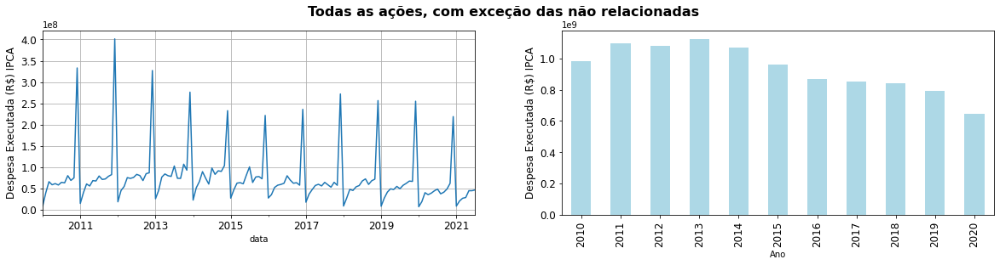

In [40]:
plot_expenditure(siga_final_geral, title='Todas as ações, com exceção das não relacionadas')

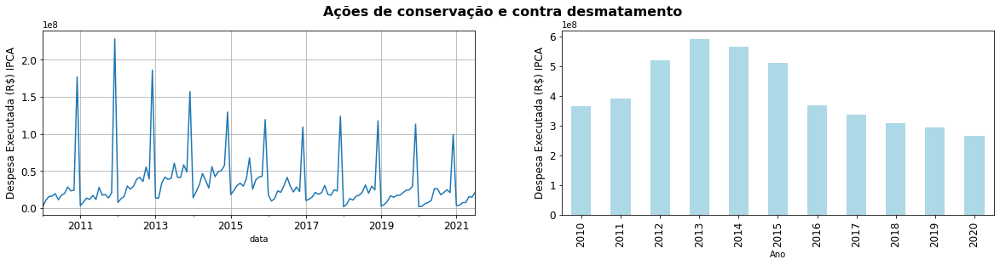

In [42]:
plot_expenditure(siga_final_conservacao, title='Ações de conservação e contra desmatamento')

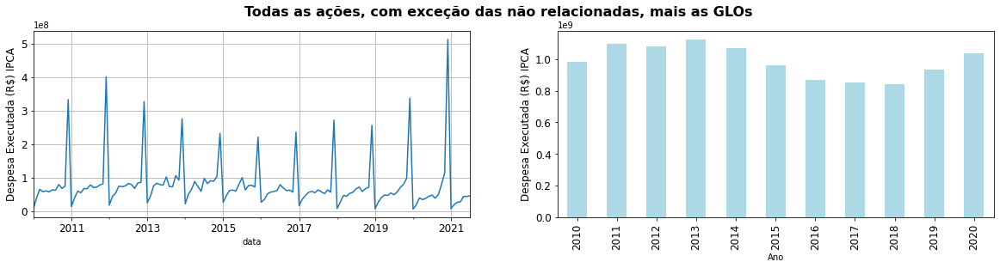

In [43]:
plot_expenditure(siga_geral_glos, title='Todas as ações, com exceção das não relacionadas, mais as GLOs')

In [42]:
# Valores dos gráficos acima, para colocar na nota técnica:
siga_final_geral.groupby('Ano')['Despesa Executada (R$) IPCA'].sum().reset_index()
#siga_geral_glos.groupby('Ano')['Despesa Executada (R$) IPCA'].sum() - siga_final_geral.groupby('Ano')['Despesa Executada (R$) IPCA'].sum()

,Ano,Despesa Executada (R$) IPCA
0,2010,9.824403e+08
1,2011,1.097091e+09
2,2012,1.078634e+09
3,2013,1.121085e+09
4,2014,1.067785e+09
5,2015,9.612383e+08
6,2016,8.684225e+08
7,2017,8.492763e+08
8,2018,8.408647e+08
9,2019,7.911111e+08


#### Gráficos para o relatório

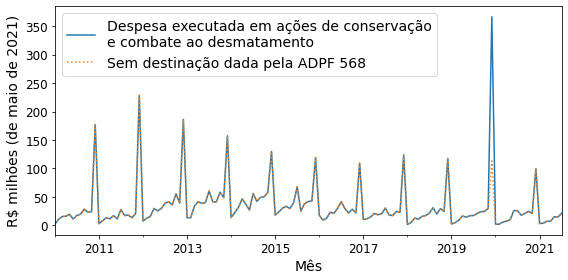

In [45]:
pl.figure(figsize=(8,4))
plot_value_timeseries(sel_siga_sfb.loc[sel_siga_sfb['grupo_acao'].isin(['desmatamento', 'conservação'])], 'data', drop_last=True, scale_factor=1e-6, 
                      label='Despesa executada em ações de conservação\ne combate ao desmatamento')
plot_value_timeseries(siga_sfb_no_adpf.loc[siga_sfb_no_adpf['grupo_acao'].isin(['desmatamento', 'conservação'])], 'data', drop_last=True, scale_factor=1e-6, 
                      label='Sem destinação dada pela ADPF 568', linestyle='dotted')
pl.xlabel('Mês', fontsize=14)
pl.ylabel('R$ milhões (de maio de 2021)', fontsize=14)
pl.tick_params(labelsize=12)
pl.legend(fontsize=14)
pl.tight_layout()
#pl.savefig('../resultados/plots/despesa_executada_conservacao_desmatamento_com_transf_STF.png')
pl.show()

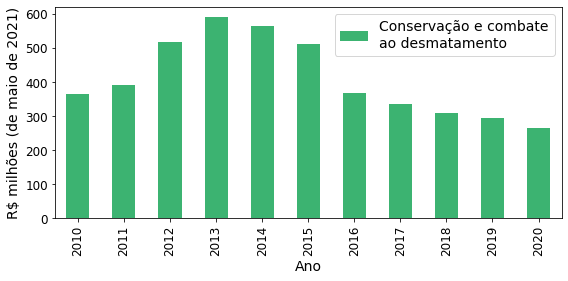

In [46]:
pl.figure(figsize=(8,4))
plot_value_timeseries(siga_final_conservacao, 'Ano', kind='bar', color='mediumseagreen', drop_last=True, scale_factor=1e-6, 
                      label='Conservação e combate\nao desmatamento')
pl.xlabel('Ano', fontsize=14)
pl.ylabel('R$ milhões (de maio de 2021)', fontsize=14)
pl.tick_params(labelsize=12)
pl.legend(fontsize=14)
pl.tight_layout()
#pl.savefig('../resultados/plots/despesa_executada_anual_conservacao_desmatamento.png')
pl.show()

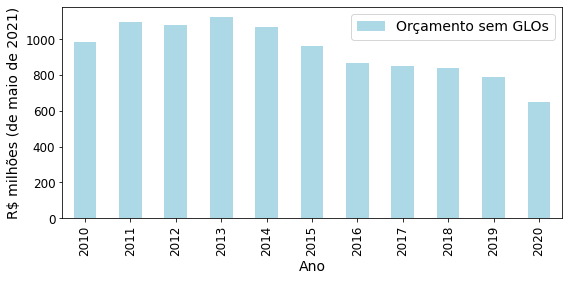

In [47]:
pl.figure(figsize=(8,4))
#plot_value_timeseries(siga_final_geral, 'Ano', kind='bar', color='lightblue', drop_last=True, scale_factor=1e-6, 
#                      label='Exceto ações não\nrelacionadas')
plot_value_timeseries(siga_final_geral, 'Ano', kind='bar', color='lightblue', drop_last=True, scale_factor=1e-6, 
                      label='Orçamento sem GLOs')
pl.xlabel('Ano', fontsize=14)
pl.ylabel('R$ milhões (de maio de 2021)', fontsize=14)
pl.tick_params(labelsize=12)
pl.legend(fontsize=14)
pl.tight_layout()
#pl.savefig('../resultados/plots/despesa_executada_anual_exceto_nao_relacionadas.png')
pl.show()

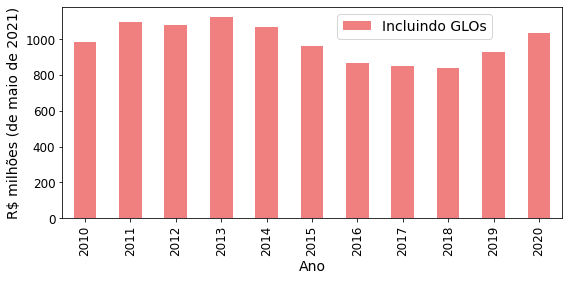

In [48]:
pl.figure(figsize=(8,4))
plot_value_timeseries(siga_geral_glos, 'Ano', kind='bar', color='lightcoral', drop_last=True, scale_factor=1e-6, 
                      label='Incluindo GLOs')
pl.xlabel('Ano', fontsize=14)
pl.ylabel('R$ milhões (de maio de 2021)', fontsize=14)
pl.tick_params(labelsize=12)
pl.legend(fontsize=14, loc=(0.55, 0.85))
pl.tight_layout()
#pl.savefig('../resultados/plots/despesa_executada_anual_exceto_nao_relacionadas_mais_GLOs.png')
pl.show()

### Nas superintendências dos estados da Amazônia legal

#### Gráficos para o relatório

In [49]:
# Seleciona categoria de ações:
amz_by_uf = ibama_amz.loc[~ibama_amz['grupo_acao'].isin(['não relacionado'])]
# Contabiliza por ano e por UF:
amz_by_uf = amz_by_uf.groupby(['Ano', 'UF'])['Despesa Executada (R$) IPCA'].sum().reset_index().pivot(index='Ano', columns='UF', values='Despesa Executada (R$) IPCA').loc[:2020, ['PA', 'MT', 'RR', 'AP']]

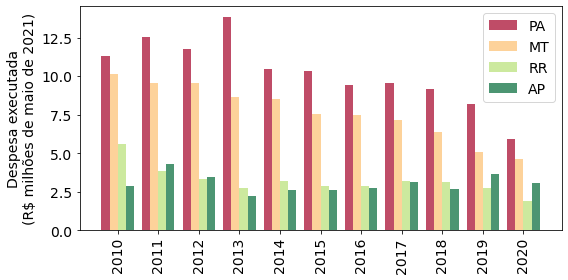

In [50]:
n_classes = len(amz_by_uf.columns)
cmap = pl.get_cmap('RdYlGn')

colors = [cmap(i/(n_classes - 1)) for i in range(n_classes)]
pl.figure(figsize=(8,4))
xp.multiple_bars_plot(amz_by_uf / 1e6, colors=colors, alpha=0.7)
pl.legend(fontsize=14)
pl.tick_params(axis='x', labelsize=14, rotation=90)
pl.tick_params(axis='y', labelsize=14)
pl.ylabel('Despesa executada\n(R$ milhões de maio de 2021)', fontsize=14)
pl.tight_layout()
#pl.savefig('../resultados/plots/despesa_executada_superintendencias_IBAMA_PA-MT-RR-AP.png')
pl.show()

#### Exploração

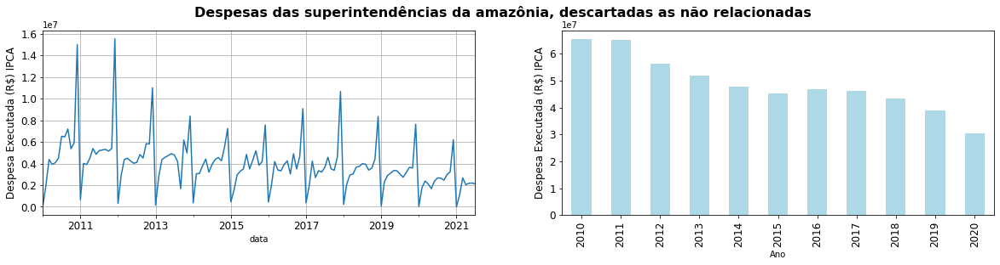

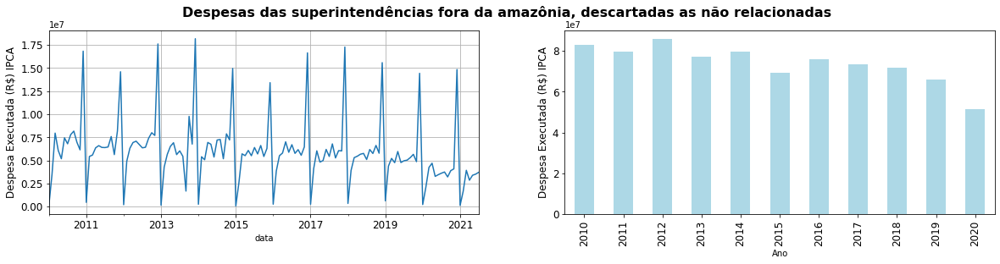

In [51]:
#plot_expenditure(ibama_amz.loc[ibama_amz['grupo_acao'].isin(['desmatamento', 'conservação'])])
plot_expenditure(ibama_amz.loc[~ibama_amz['grupo_acao'].isin(['não relacionado'])], title='Despesas das superintendências da amazônia, descartadas as não relacionadas')
#plot_expenditure(ibama_amz.loc[ibama_amz['grupo_acao'].isin(['desmatamento', 'conservação'])])
plot_expenditure(ibama_noamz.loc[~ibama_noamz['grupo_acao'].isin(['não relacionado'])], title='Despesas das superintendências fora da amazônia, descartadas as não relacionadas')

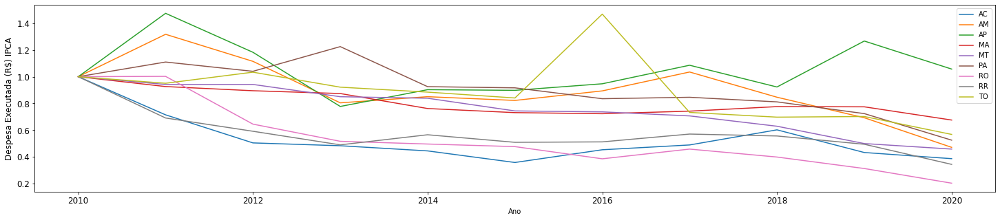

In [52]:
# Evolução das despesas das superintendências do IBAMA na Amazônia:
pl.figure(figsize=(25,5))
for uf in amz_legal:
    sel = ibama_amz.loc[(ibama_amz['UF'] == uf) & ~ibama_amz['grupo_acao'].isin(['não relacionado'])]
    avg_despesa = sel.groupby('Ano')['Despesa Executada (R$) IPCA'].sum()[2010]
    plot_value_timeseries(sel, 'Ano', label=uf, drop_last=True, scale_factor= 1.0 / avg_despesa)

pl.legend()
pl.show()

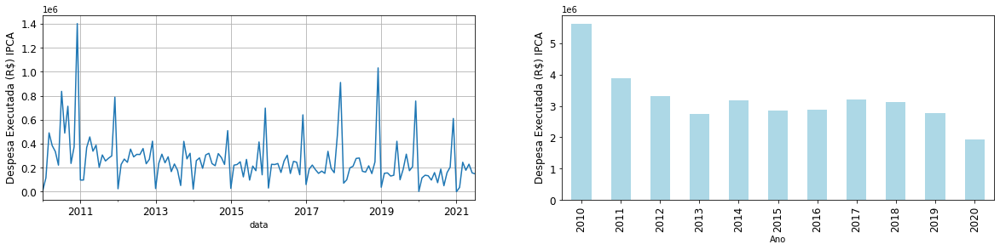

In [53]:
uf  = amz_legal[7]
sel = ibama_amz.loc[(ibama_amz['UF'] == uf) & ~ibama_amz['grupo_acao'].isin(['não relacionado'])]
plot_expenditure(sel)

In [54]:
max_despesas = sel.groupby('data')['Despesa Executada (R$) IPCA'].sum().sort_values(ascending=False)

In [55]:
max_datas = max_despesas.index[:2]
ctrl = sel.loc[~sel['data'].isin(max_datas)]
test = sel.loc[sel['data'].isin(max_datas)]
print(xu.Bold('Teste'))
display(sample_by_valor(test)[inspect_cols])
print(xu.Bold('Controle'))
display(sample_by_valor(ctrl)[inspect_cols])

Teste


,Ano,Mês (Número) DES,UO AC (Ajustada),Órgão Superior (UG) DESP,Órgão (UG) DESP,UG DESP,Função DESP,Subfunção (Ajustada),Ação Ajustada DESP,Programa DESP,GND DESP,Elemento Despesa DESP,Sub-elemento Despesa DESP,Modalidade Aplicação DESP,Despesa Executada (R$) IPCA
16132,2010,12,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,APOIO ADMINISTRATIVO,INVESTIMENTOS,EQUIPAMENTOS E MATERIAL PERMANENTE,APARELHOS E UTENSILIOS DOMESTICOS,APLICAÇÕES DIRETAS,196624.864456
121878,2018,12,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,OUTRAS DESPESAS CORRENTES,LOCACAO DE MAO-DE-OBRA,LIMPEZA E CONSERVACAO,APLICAÇÕES DIRETAS,47657.821726
15337,2010,12,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,APOIO ADMINISTRATIVO,OUTRAS DESPESAS CORRENTES,LOCACAO DE MAO-DE-OBRA,VIGILANCIA OSTENSIVA,APLICAÇÕES DIRETAS,203640.934450
121918,2018,12,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,OUTRAS DESPESAS CORRENTES,LOCACAO DE MAO-DE-OBRA,VIGILANCIA OSTENSIVA,APLICAÇÕES DIRETAS,560357.955370
18419,2010,12,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,MEIO AMBIENTE - CONTROLE AMBIENTAL,PREVENÇÃO E COMBATE A INCÊNDIOS FLORESTAIS E C...,"PREVENÇÃO E COMBATE AO DESMATAMENTO, QUEIMADAS...",OUTRAS DESPESAS CORRENTES,DIÁRIAS - CIVIL,DIARIAS NO PAIS,APLICAÇÕES DIRETAS,15845.255544


Controle


,Ano,Mês (Número) DES,UO AC (Ajustada),Órgão Superior (UG) DESP,Órgão (UG) DESP,UG DESP,Função DESP,Subfunção (Ajustada),Ação Ajustada DESP,Programa DESP,GND DESP,Elemento Despesa DESP,Sub-elemento Despesa DESP,Modalidade Aplicação DESP,Despesa Executada (R$) IPCA
134586,2020,3,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,PROGRAMA DE GESTAO E MANUTENCAO DO PODER EXECU...,OUTRAS DESPESAS CORRENTES,LOCACAO DE MAO-DE-OBRA,VIGILANCIA OSTENSIVA,APLICAÇÕES DIRETAS,58149.773525
3754,2010,5,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,APOIO ADMINISTRATIVO,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,LOCACAO DE MAQUINAS E EQUIPAMENTOS,APLICAÇÕES DIRETAS,3919.172433
113028,2018,3,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,"SERV. DE APOIO ADMIN., TECNICO E OPERACIONAL",APLICAÇÕES DIRETAS,30663.156432
3826,2010,5,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,APOIO ADMINISTRATIVO,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,"SERV. DE APOIO ADMIN., TECNICO E OPERACIONAL",APLICAÇÕES DIRETAS,57775.667101
23860,2011,6,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - SUPERINTENDENCIA DE RORAIMA/RR,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,APOIO ADMINISTRATIVO,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,MANUTENCAO E CONSERV. DE BENS IMOVEIS,APLICAÇÕES DIRETAS,86397.010400


## Relação entre orçamento e desmatamento

In [1]:
import prodes as pr

In [2]:
# Carregando dados de desmatamento:
prodes_df = pr.etl_prodes_data('../dados/brutos/desmatamento/prodes/prodes_DesmatamentoMunicipios', 2010, 2020)

In [9]:
# Exportação de dados sobre a área desmatável no município:
#prodes_df[['CodIbge','Desmatavel']].drop_duplicates().set_index('CodIbge').to_csv('../dados/processed/prodes_codIbge_municipios_area-florestal.csv')

In [43]:
# Agregando dados do desmatamento:
prodes_br = prodes_df.groupby('Ano')[pr.areas_col].sum()
prodes_br.index.name = 'ano_prodes'

# Agregando dados do orçamento geral (exceto não relacionados):
siga_geral_anual = siga_final_geral.groupby('ano_prodes')['Despesa Executada (R$) IPCA'].sum().loc[:2021]
siga_geral_anual.name = 'orcamento_geral'
# Agregando dados do orçamento de conservação:
siga_conservacao_anual = siga_final_conservacao.groupby('ano_prodes')['Despesa Executada (R$) IPCA'].sum().loc[:2021]
siga_conservacao_anual.name = 'orcamento_conservacao'
# Agregando dados do orçamento com as GLOs:
siga_geral_glos_anual = siga_geral_glos.groupby('ano_prodes')['Despesa Executada (R$) IPCA'].sum().loc[:2021]
siga_geral_glos_anual.name = 'orcamento_geral_mais_glos'

# Juntando dados de orçamento e desmatamento:
prodes_siga_br = pd.concat([siga_geral_anual, siga_conservacao_anual, siga_geral_glos_anual, prodes_br['Incremento']], axis=1)
# Remove primeiro ano Prodes, cujo orçamento não está completo:
prodes_siga_br = prodes_siga_br.iloc[1:]

# Adiciona estimativa de desmatamento para 2021:
estimativa_prodes_2021 = 12133
incerteza_prodes_2021 = 1542
prodes_siga_br.loc[2021, 'Incremento'] = estimativa_prodes_2021

# Separa o orçamento em componentes:
prodes_siga_br['componente_geral']      = prodes_siga_br['orcamento_geral'] - prodes_siga_br['orcamento_conservacao']
prodes_siga_br['componente_especifico'] = prodes_siga_br['orcamento_conservacao']
prodes_siga_br['componente_glo']        = prodes_siga_br['orcamento_geral_mais_glos'] - prodes_siga_br['orcamento_geral']

In [44]:
# Salva os dados agregados:
#prodes_siga_br.to_csv('../dados/processed/orcamentos-totalizados_incremento-desmatamento_por_ano-prodes.csv')

In [45]:
# Agregando dados do desmatamento por UF:
prodes_uf = prodes_df.groupby(['Estado', 'Ano'])[pr.areas_col].sum()
prodes_uf = prodes_uf.reset_index(level=0)
prodes_uf.rename({'Estado': 'UF'}, axis=1, inplace=True)
prodes_uf.index.name = 'ano_prodes'

# Agrega o orçamento (sem não relacionados) das superintendências do IBAMA em cada estado:
ibama_amz_geral_uf = ibama_amz_geral.groupby(['UF', 'ano_prodes'])['Despesa Executada (R$) IPCA'].sum()
ibama_amz_geral_uf.name = 'orcamento_geral_ibama_uf'

# Junta orçamento ao desmatamento::
prodes_siga_uf = prodes_uf.join(siga_geral_anual, how='left').join(siga_conservacao_anual, how='left')
prodes_siga_uf = prodes_siga_uf.reset_index().merge(ibama_amz_geral_uf.reset_index(), how='left', on=['ano_prodes', 'UF'])
# Remove primeiro ano Prodes, cujo orçamento não está completo:
prodes_siga_uf = prodes_siga_uf.loc[prodes_siga_uf['ano_prodes'] > 2010]

### Correlação entre desmatamentos nos estados

In [46]:
uf_correlation = prodes_uf.pivot(columns='UF', values='Incremento').corr()

# Cluster correlation groups:
corr_cols = uf_correlation.columns[:-1]
uf_correlation = uf_correlation.sort_values(list(corr_cols), ascending=False).transpose().sort_values(list(corr_cols), ascending=False)

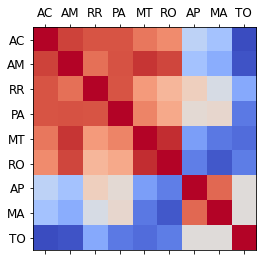

In [47]:
pl.matshow(uf_correlation, cmap='coolwarm')
ax = pl.gca()
pl.xticks(range(len(uf_correlation)), labels=uf_correlation.columns)
pl.yticks(range(len(uf_correlation)), labels=uf_correlation.columns)
pl.tick_params(labelsize=12)
pl.show()

### Gráficos do relatório

In [48]:
def year2color(yr, cmap, yr_min=2010, n_yrs=11):
    return cmap((yr - yr_min) / n_yrs)

#### Gráfico de dispersão antigo

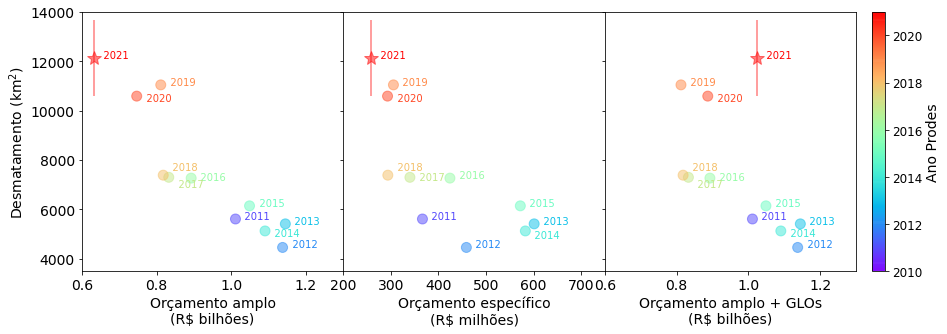

In [49]:
cmap = pl.get_cmap('rainbow')
ylim = [3500, 14000]
        
fig, (a0, a1, a2) = pl.subplots(1, 3, gridspec_kw={'width_ratios': [1, 1, 1.2]}, figsize=(15,5))

# ORÇAMENTO AMPLO:
x = prodes_siga_br['orcamento_geral'] / 1e9
y = prodes_siga_br['Incremento']
a = prodes_siga_br.index
# Plot:
a0.scatter(x[:-1], y[:-1], c=a[:-1], alpha=0.5, s=100, cmap=cmap, vmin=2010, vmax=2021)
a0.errorbar([x[2021]], [y[2021]], yerr=incerteza_prodes_2021, marker='*', markersize=15, alpha=0.5, color=year2color(a[-1], cmap))
# Text:
y_offset = np.array([0, 0, 0, -200, 0, -100, -400, 200, 0, -200, 0])
for xi, yi, ai, ci in zip(x, y + y_offset, a, cmap((a - 2010) / 11)):
    a0.text(xi, yi, '   {}'.format(ai), color=ci)
# Format:
a0.tick_params(labelsize=14)
a0.set_xlabel('Orçamento amplo\n(R$ bilhões)', fontsize=14)
a0.set_ylabel('Desmatamento ($\mathrm{km}^2$)', fontsize=14)
a0.set_xlim([0.6, 1.3])
a0.set_ylim(ylim)

# ORÇAMENTO ESPECÍFICO:
x = prodes_siga_br['orcamento_conservacao'] / 1e6
y = prodes_siga_br['Incremento']
a = prodes_siga_br.index
# Plot:
a1.scatter(x[:-1], y[:-1], c=a[:-1], alpha=0.5, s=100, cmap=cmap, vmin=2010, vmax=2021)
a1.errorbar([x[2021]], [y[2021]], yerr=incerteza_prodes_2021, marker='*', markersize=15, alpha=0.5, color=year2color(a[-1], cmap))
# Text:
y_offset = np.array([0, 0, 0, -300, 0, 0, -100, 200, 0, -200, 0])
for xi, yi, ai, ci in zip(x, y + y_offset, a, year2color(a, cmap)):
    a1.text(xi, yi, '   {}'.format(ai), color=ci)
# Format:
a1.tick_params(labelsize=14)

a1.axes.yaxis.set_ticklabels([])
a1.set_xlabel('Orçamento específico\n(R$ milhões)', fontsize=14)
a1.set_xlim([200, 750])
a1.set_ylim(ylim)

# ORÇAMENTO GERAL + GLOs:
x = prodes_siga_br['orcamento_geral_mais_glos'] / 1e9
y = prodes_siga_br['Incremento']
a = prodes_siga_br.index
# Plot:
scat = a2.scatter(x[:-1], y[:-1], c=a[:-1], alpha=0.5, s=100, cmap=cmap, vmin=2010, vmax=2021)
a2.errorbar([x[2021]], [y[2021]], yerr=incerteza_prodes_2021, marker='*', markersize=15, alpha=0.5, color=year2color(a[-1], cmap))
# Text:
y_offset = np.array([0, 0, 0, -200, 0, -100, -400, 200, 0, -200, 0])
for xi, yi, ai, ci in zip(x, y + y_offset, a, year2color(a, cmap)):
    a2.text(xi, yi, '   {}'.format(ai), color=ci)
# Format:
a2.tick_params(labelsize=14)

a2.axes.yaxis.set_ticklabels([])
a2.set_xlabel('Orçamento amplo + GLOs\n(R$ bilhões)', fontsize=14)
a2.set_xlim([0.6, 1.3])
a2.set_ylim(ylim)
# Colorbar:
cbar = pl.colorbar(scat)
cbar.set_label(label='Ano Prodes', fontsize=14)
cbar.ax.tick_params(labelsize=12)
cbar.solids.set_edgecolor("face")

pl.subplots_adjust(wspace=0, bottom=0.16)

#pl.savefig('../resultados/plots/relacao_orcamento_desmatamento_scatter.png')
pl.show()

In [50]:
# Correlação entre orçamento e desmatamento:
for orc in ['orcamento_geral', 'orcamento_conservacao', 'orcamento_geral_mais_glos']:
    print('Com', orc, ':', xc.compute_correlation(prodes_siga_br[orc], prodes_siga_br['Incremento']))

Com orcamento_geral : -0.9130202417847206
Com orcamento_conservacao : -0.7503508280853497
Com orcamento_geral_mais_glos : -0.5549811183905563


#### Gráfico de dispersão novo

In [50]:
from sklearn.linear_model import LinearRegression

In [51]:
# Cria uma linha de tendência exponencial:
fit_prodes_siga_br = prodes_siga_br.loc[:2019]
x = fit_prodes_siga_br[['orcamento_geral']]
y = np.log(fit_prodes_siga_br['Incremento'])

logfit = LinearRegression(fit_intercept=True, normalize=False)
dump   = logfit.fit(x, y)
D0     = np.exp(logfit.intercept_)
alpha  = logfit.coef_[0]

expmodel_x = np.linspace(0.5, 1.3, 50) * 1e9
expmodel_y = D0 * np.exp(alpha * expmodel_x)

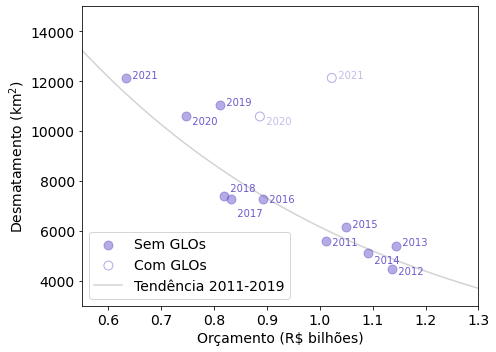

In [54]:
pl.figure(figsize=(7,5))

# ORÇAMENTO AMPLO:
color = 'slateblue'
size  = 80
x = prodes_siga_br['orcamento_geral'] / 1e9
y = prodes_siga_br['Incremento']
a = prodes_siga_br.index
# Plot:
pl.scatter(x, y, c=color, alpha=0.5, s=size, label='Sem GLOs')
pl.errorbar([x[2021]], [y[2021]], yerr=incerteza_prodes_2021, fmt='', color=color, alpha=0.5)
#pl.errorbar([x[2021]], [y[2021]], fmt='', color=color, alpha=0.5)
# Text:
y_offset = np.array([-200, -200, 0, -400, 0, -100, -700, 200, 0, -300, 0])
for xi, yi, ai in zip(x, y + y_offset, a):
    pl.text(xi, yi, '  {}'.format(ai), color=color)

# ORÇAMENTO GLO:
glo_prodes_siga_br = prodes_siga_br.loc[2020:]
x = glo_prodes_siga_br['orcamento_geral_mais_glos'] / 1e9
y = glo_prodes_siga_br['Incremento']
a = glo_prodes_siga_br.index
# Plot:
pl.scatter(x, y, alpha=0.5, s=size, facecolors='none', edgecolors=color, label='Com GLOs')
pl.errorbar([x[2021]], [y[2021]], yerr=incerteza_prodes_2021, alpha=0.5, color=color, fmt='')
#pl.errorbar([x[2021]], [y[2021]], alpha=0.5, color=color, fmt='')
# Text:
for xi, yi, ai in zip(x, y + y_offset[-2:], a):
    pl.text(xi, yi, '  {}'.format(ai), color=color, alpha=0.4)    

# Tendência:
pl.plot(expmodel_x / 1e9, expmodel_y, color='lightgray', zorder=-1, label='Tendência 2011-2019')

# Format:
pl.tick_params(labelsize=14)
pl.xlabel('Orçamento (R$ bilhões)', fontsize=14)
pl.ylabel('Desmatamento ($\mathrm{km}^2$)', fontsize=14)
pl.xlim([0.55, 1.3])
pl.ylim([3000,15000])

# Legenda:
handles, labels = pl.gca().get_legend_handles_labels()
label_order = [1, 2, 0]
handles = [handles[i] for i in label_order]
labels  = [labels[i] for i in label_order]
pl.legend(handles, labels, fontsize=14, loc='lower left')

pl.tight_layout()
#pl.savefig('../resultados/plots/relacao_orcamento_desmatamento_scatter_simples.png')
pl.show()

#### Significância do resultado

In [64]:
# Calcula a correlação entre orçamento e desmatamento para o caso mais impressionante:
corr = xc.compute_correlation(prodes_siga_br['orcamento_geral'], prodes_siga_br['Incremento'])

# Testa a significância dessa correlação em amostras sem correlação:
n_trials = 10000
sampled_corr = []
n_points = len(prodes_siga_br)
for _ in range(n_trials):
    # Embaralha os dados de desmatamento:
    random_desmate = prodes_siga_br['Incremento'].sample(n_points)
    # Calcula a correlação com as três estimativas de desmatamento:
    corr_1 = xc.compute_correlation(prodes_siga_br['orcamento_geral'], random_desmate)
    corr_2 = xc.compute_correlation(prodes_siga_br['orcamento_conservacao'], random_desmate)
    corr_3 = xc.compute_correlation(prodes_siga_br['orcamento_geral_mais_glos'], random_desmate)
    # Pega o menor valor obtido:
    min_corr = np.min([corr_1, corr_2, corr_3])
    sampled_corr.append(min_corr)

sampled_corr = np.array(sampled_corr)
pvalue = (sampled_corr < corr).mean()

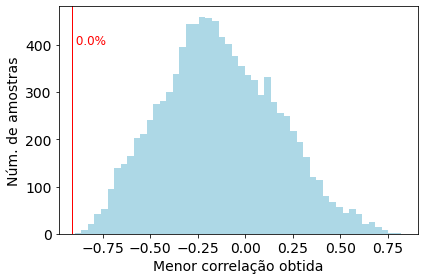

In [65]:
# Gráfico das realizações aleatórias para a correlação:
pl.hist(sampled_corr, bins=50, color='lightblue')
pl.axvline(corr, color='r', linewidth=1)
pl.text(corr, 400, ' {:.1f}%'.format(pvalue * 100), color='r', fontsize=12)
pl.tick_params(labelsize=14)
pl.xlabel('Menor correlação obtida', fontsize=14)
pl.ylabel('Núm. de amostras', fontsize=14)
pl.tight_layout()
#pl.savefig('../resultados/plots/hist_amostras_aleatorias_correlacao_desmatamento_tres_orcamentos.png')
pl.show()

#### Evolução temporal

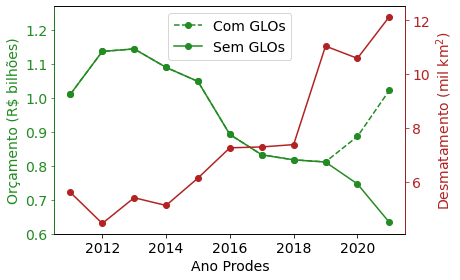

In [48]:
fig, ax1 = pl.subplots(figsize=(6.5,4))

left_color = 'forestgreen'
ax1.plot(prodes_siga_br.index, prodes_siga_br['orcamento_geral_mais_glos'] / 1e9, color=left_color, linestyle='--', marker='o', label='Com GLOs')
ax1.plot(prodes_siga_br.index, prodes_siga_br['orcamento_geral'] / 1e9, color=left_color, marker='o', label='Sem GLOs')
ax1.set_xlabel('Ano Prodes', fontsize=14)
ax1.set_ylabel('Orçamento (R$ bilhões)', color=left_color, fontsize=14)
ax1.tick_params(axis='y', labelcolor=left_color, labelsize=14, color=left_color)
ax1.tick_params(axis='x', labelsize=14)
ax1.set_ylim([0.6, 1.27])
ax1.legend(fontsize=14, loc='upper center')
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

right_color = 'firebrick'
ax2.plot(prodes_siga_br.index, prodes_siga_br['Incremento'] / 1000, color='firebrick', marker='o')
ax2.set_ylabel('Desmatamento (mil $\mathrm{km^2}$)', color=right_color, fontsize=14)
ax2.tick_params(axis='y', labelcolor=right_color, labelsize=14, color=right_color)
ax2.errorbar([prodes_siga_br.index[-1]], [prodes_siga_br['Incremento'].iloc[-1] / 1000], yerr=incerteza_prodes_2021 / 1000, color='firebrick', marker='*', markersize=13)

ax2.spines['right'].set_color(right_color)
ax2.spines['left'].set_color(left_color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
#pl.savefig('../resultados/plots/relacao_orcamento_geral_desmatamento_line.png')

pl.show()

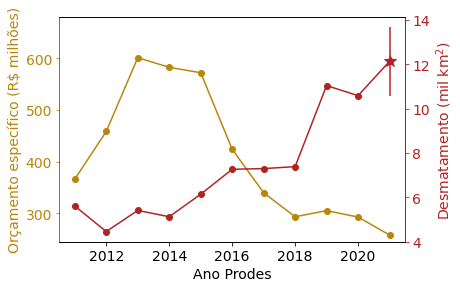

In [51]:
fig, ax1 = pl.subplots(figsize=(6.5,4))

left_color = 'darkgoldenrod'
ax1.plot(prodes_siga_br.index, prodes_siga_br['orcamento_conservacao'] / 1e6, color=left_color, marker='o')
ax1.set_xlabel('Ano Prodes', fontsize=14)
ax1.set_ylabel('Orçamento específico (R$ milhões)', color=left_color, fontsize=14)
ax1.tick_params(axis='y', labelcolor=left_color, labelsize=14, color=left_color)
ax1.tick_params(axis='x', labelsize=14)
ax1.set_ylim([245, 680])

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

right_color = 'firebrick'
ax2.plot(prodes_siga_br.index, prodes_siga_br['Incremento'] / 1000, color='firebrick', marker='o')
ax2.set_ylabel('Desmatamento (mil $\mathrm{km^2}$)', color=right_color, fontsize=14)
ax2.tick_params(axis='y', labelcolor=right_color, labelsize=14, color=right_color)
ax2.errorbar([prodes_siga_br.index[-1]], [prodes_siga_br['Incremento'].iloc[-1] / 1000], yerr=incerteza_prodes_2021 / 1000, color='firebrick', marker='*', markersize=13)

ax2.spines['right'].set_color(right_color)
ax2.spines['left'].set_color(left_color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
#pl.savefig('../resultados/plots/relacao_orcamento_especifico_desmatamento_line.png')
pl.show()

#### Gráficos para a thread do twitter

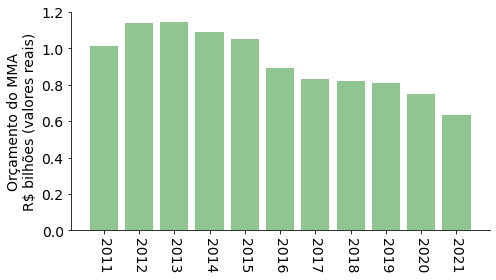

In [70]:
pl.figure(figsize=(7,4))
pl.bar(prodes_siga_br.index, prodes_siga_br['orcamento_geral'] / 1e9, color=left_color, alpha=0.5)
pl.tick_params(labelsize=14)
pl.xticks(list(range(2011,2022)))
pl.tick_params(axis='x', rotation=-90)
pl.ylabel('Orçamento do MMA\nR$ bilhões (valores reais)', fontsize=14)
ax = pl.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
pl.tight_layout()
#pl.savefig('../resultados/thread_twitter/figura02.png')
pl.show()

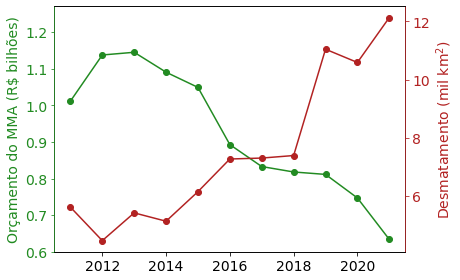

In [76]:
fig, ax1 = pl.subplots(figsize=(6.5,4))

left_color = 'forestgreen'
#ax1.plot(prodes_siga_br.index, prodes_siga_br['orcamento_geral_mais_glos'] / 1e9, color=left_color, linestyle='--', marker='o', label='Com GLOs')
ax1.plot(prodes_siga_br.index, prodes_siga_br['orcamento_geral'] / 1e9, color=left_color, marker='o', label='Sem GLOs')
#ax1.set_xlabel('Ano Prodes', fontsize=14)
ax1.set_ylabel('Orçamento do MMA (R$ bilhões)', color=left_color, fontsize=14)
ax1.tick_params(axis='y', labelcolor=left_color, labelsize=14, color=left_color)
ax1.tick_params(axis='x', labelsize=14)
ax1.set_ylim([0.6, 1.27])
#ax1.legend(fontsize=14, loc='upper center')
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

right_color = 'firebrick'
ax2.plot(prodes_siga_br.index, prodes_siga_br['Incremento'] / 1000, color='firebrick', marker='o')
ax2.set_ylabel('Desmatamento (mil $\mathrm{km^2}$)', color=right_color, fontsize=14)
ax2.tick_params(axis='y', labelcolor=right_color, labelsize=14, color=right_color)
#ax2.errorbar([prodes_siga_br.index[-1]], [prodes_siga_br['Incremento'].iloc[-1] / 1000], yerr=incerteza_prodes_2021 / 1000, color='firebrick', marker='*', markersize=13)

ax2.spines['right'].set_color(right_color)
ax2.spines['left'].set_color(left_color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
#pl.savefig('../resultados/thread_twitter/figura03.png')

pl.show()

In [81]:
prodes_siga_br['orcamento_geral'].loc[2021] / 1e6

633.7849879611664

In [77]:
prodes_siga_br['orcamento_geral_mais_glos'] / 1e6 - prodes_siga_br['orcamento_geral'] / 1e6


ano_prodes
2011      0.000000
2012      0.000000
2013      0.000000
2014      0.000000
2015      0.000000
2016      0.000000
2017      0.000000
2018      0.000000
2019      0.676261
2020    139.737951
2021    388.800186
dtype: float64

### Modelo entre orçamento e desmatamento

In [71]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from mltools import adjusted_r2

#### Funções

In [72]:
def estimate_coeffs_error(model, prodes_siga_br, X_cols=['componente_geral', 'componente_glo'], y_col='Incremento', w_col='model_weights'):
    """
    Estimate the linear `model` coefficients and
    the squared error using a "leave-one-out"
    approach.    
    """
    
    coeffs      = []
    test_scores = []
    measured_years = prodes_siga_br.index

    for yr in measured_years:

        # Get other years as training:
        train_yr_df = prodes_siga_br.loc[prodes_siga_br.index != yr]
        test_yr_df  = prodes_siga_br.loc[prodes_siga_br.index == yr]
        
        # Fit model:
        dump = model.fit(train_yr_df[X_cols], train_yr_df[y_col], train_yr_df[w_col])
        coeffs.append(model.coef_)
        
        # Compute error:
        y_test_true = test_yr_df[y_col]
        y_test_pred = model.predict(test_yr_df[X_cols])
        test_scores.append(mean_squared_error(y_test_true, y_test_pred))
        
    return np.array(coeffs), np.array(test_scores)

#### Preparação dos dados

In [73]:
# Carrega taxas de desmatamento:
taxa_df = pd.read_csv('../dados/brutos/desmatamento/terrabrasilis_prodes/terrabrasilis_legal_amazon_taxa_desmatamento.csv', sep=';')
taxa_df['area km²'] = taxa_df['area km²'].apply(xu.parse_ptbr_number)
# Carrega incrementos de desmatamento:
incremento_df = pd.read_csv('../dados/brutos/desmatamento/terrabrasilis_prodes/terrabrasilis_legal_amazon_incremento_desmatamento.csv', sep=';')
incremento_df['area km²'] = incremento_df['area km²'].apply(xu.parse_ptbr_number)
# Cálculo do desvio médio entre taxa e incremento:
medidas_df = incremento_df.merge(taxa_df, how='inner', on=['year', 'uf'], suffixes=(' incremento', ' taxa'))
medidas_df['diff'] = medidas_df['area km² taxa'] - medidas_df['area km² incremento']
desvio_medio_taxa_incremento = medidas_df.groupby('year')['diff'].sum().std()

In [74]:
# Cria pesos para ajuste linear:
prodes_siga_br['model_weights'] = 1.0 / desvio_medio_taxa_incremento ** 2
prodes_siga_br.loc[2021, 'model_weights'] = 1.0 / (incerteza_prodes_2021**2 + desvio_medio_taxa_incremento**2)

#### Ajuste do modelo

In [75]:
# Instancia modelo:
model = LinearRegression(fit_intercept=True, normalize=False)

In [76]:
# Faz ajuste:
#X = prodes_siga_br[['componente_geral', 'componente_especifico', 'componente_glo']]
#X = prodes_siga_br[['componente_geral', 'componente_especifico']]
#X = prodes_siga_br[['orcamento_geral']]
X = prodes_siga_br[['orcamento_geral', 'componente_glo']]
y = prodes_siga_br['Incremento']
w = prodes_siga_br['model_weights']
dump = model.fit(X, y, w)
r2 = model.score(X, y, w)
adj_r2 = adjusted_r2(model, X, y, w)
model_coeffs = model.coef_

# Calcula incertezas:
coeffs, errors = estimate_coeffs_error(model, prodes_siga_br)
mean_pred_error = np.sqrt(np.mean(errors))
coeffs_sigma = coeffs.std(axis=0)

#### Resultados

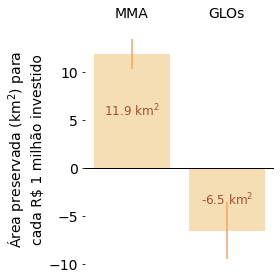

In [77]:

#x_labels = ['Geral', 'Específico', 'GLOs']
x_labels = ['MMA', 'GLOs']

pl.figure(figsize=(4,4))
# Plot:
coef_factor = 1e6
pl.bar(x_labels, -model_coeffs * coef_factor, color='wheat')
pl.errorbar(x_labels, -model_coeffs * coef_factor, yerr=coeffs_sigma * coef_factor, ls='none', color='sandybrown')
# Values on text:
for x, y, v in zip(x_labels, -model_coeffs * coef_factor / 2, -model_coeffs * coef_factor):
    pl.text(x, y, '{:.1f} km$^2$'.format(v), fontsize=12, color='sienna', ha='center', va='center')
# Format:
pl.tick_params(labelsize=14)
ax = pl.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.xaxis.set_ticks_position('top') 
pl.tick_params(axis='x', top=False)
pl.axhline(0, linewidth=1, color='k')
pl.ylabel('Área preservada ($\mathrm{km}^2$) para\ncada R$ 1 milhão investido', fontsize=14)
pl.tight_layout()
#pl.savefig('../resultados/plots/coeficientes_modelo_linear_entre_orcamento_e_desmatamento.png')
pl.show()

In [78]:
coeffs_sigma * coef_factor

array([1.55788674, 2.95936466])

### Relação entre desmatamento por estados e orçamento

In [132]:
import correlation as xc

#### Comparação da distribuição das diferenças fracionais

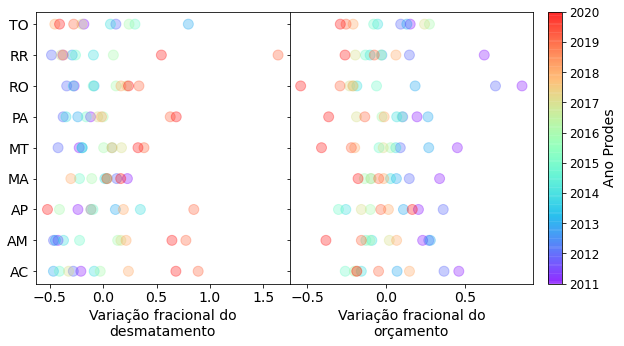

In [133]:
ufs = ['AC', 'AM', 'AP', 'MA', 'MT', 'PA', 'RO', 'RR', 'TO']
cmap = pl.get_cmap('rainbow')
fig, (a0, a1) = pl.subplots(1, 2, gridspec_kw={'width_ratios': [1, 1.2]}, figsize=(10,5))

# DESMATAMENTO:
for i, uf in enumerate(ufs):
    sel = prodes_siga_uf.loc[prodes_siga_uf['UF'] == uf]
    x = sel['Incremento'] / sel['Incremento'].mean() - 1
    c = sel['ano_prodes']
    y = i * np.ones_like(x)
    a0.scatter(x, y, c=c, cmap=cmap, alpha=0.3, s=100)

# Format:
a0.tick_params(labelsize=14)
a0.set_xlabel('Variação fracional do\ndesmatamento', fontsize=14)
a0.set_yticks(range(len(ufs)))
a0.set_yticklabels(ufs)

# ORÇAMENTO:
for i, uf in enumerate(ufs):
    sel = prodes_siga_uf.loc[prodes_siga_uf['UF'] == uf]
    x = sel['orcamento_geral_ibama_uf'] / sel['orcamento_geral_ibama_uf'].mean() - 1
    #x = sel['orcamento_geral_ibama_uf'] / sel['orcamento_geral']
    y = i * np.ones_like(x)
    scat = a1.scatter(x, y, c=c, cmap=cmap, alpha=0.3, s=100)

# Format:
a1.tick_params(labelsize=14)
a1.axes.yaxis.set_ticklabels([])
a1.set_xlabel('Variação fracional do\norçamento', fontsize=14)

# Colorbar:
cbar = pl.colorbar(scat)
cbar.set_label(label='Ano Prodes', fontsize=14)
cbar.ax.tick_params(labelsize=12)
cbar.solids.set_edgecolor("face")

pl.subplots_adjust(wspace=0)


pl.show()

#### Teste de aleatorização:
<https://www.uvm.edu/~statdhtx/StatPages/R/RandomizationTestsWithR/RandomCorr/randomization_Correlation.html>

Abaixo fazemos um teste assumindo que o orçamento das superintendências são independentes:

In [134]:
x = frac_diff_by_parts(prodes_siga_uf, 'UF', 'orcamento_geral_ibama_uf')
#x = prodes_siga_uf['orcamento_geral']
y = frac_diff_by_parts(prodes_siga_uf, 'UF', 'Incremento')
actual_corr = xc.compute_correlation(x, y)
random_corrs = xc.bootstrap_correlation(x, y)
pvalue = (random_corrs < actual_corr).sum() / len(random_corrs)

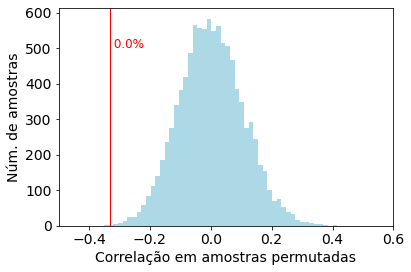

In [135]:
pl.hist(random_corrs, bins=50, color='lightblue')
pl.axvline(actual_corr, color='r', linewidth=1)
pl.text(actual_corr, 500, ' {:.1f}%'.format(pvalue * 100), color='r', fontsize=12)
pl.tick_params(labelsize=14)
pl.xlabel('Correlação em amostras permutadas', fontsize=14)
pl.ylabel('Núm. de amostras', fontsize=14)
pl.xlim([-0.5, 0.6])
pl.show()

Entretanto, como vemos abaixo, isso não é real (i.e. os orçamentos são correlacionados positivamente):

UF,AC,AM,AP,MA,MT,PA,RO,RR,TO
UF,,,,,,,,,
AC,1.000000,0.772208,0.776324,0.894675,0.563410,0.517905,0.857043,0.871916,0.163704
AM,0.772208,1.000000,0.458331,0.782531,0.794345,0.786085,0.827014,0.661013,0.563368
AP,0.776324,0.458331,1.000000,0.519164,0.189312,0.099157,0.568392,0.501781,0.020863
MA,0.894675,0.782531,0.519164,1.000000,0.802353,0.703123,0.917361,0.910504,0.299813
MT,0.563410,0.794345,0.189312,0.802353,1.000000,0.841738,0.821440,0.726515,0.724295
PA,0.517905,0.786085,0.099157,0.703123,0.841738,1.000000,0.733264,0.597260,0.433598
RO,0.857043,0.827014,0.568392,0.917361,0.821440,0.733264,1.000000,0.859994,0.474604
RR,0.871916,0.661013,0.501781,0.910504,0.726515,0.597260,0.859994,1.000000,0.316130
TO,0.163704,0.563368,0.020863,0.299813,0.724295,0.433598,0.474604,0.316130,1.000000


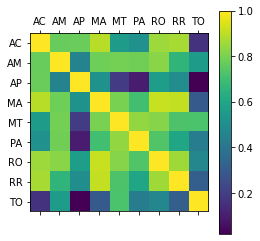

In [136]:
orcamento_superintendencias_corr = prodes_siga_uf.pivot(index='ano_prodes', columns='UF', values='orcamento_geral_ibama_uf').corr()
display(orcamento_superintendencias_corr)
pl.matshow(orcamento_superintendencias_corr)
pl.xticks(ticks=range(len(orcamento_superintendencias_corr)), labels=orcamento_superintendencias_corr.index)
pl.yticks(ticks=range(len(orcamento_superintendencias_corr)), labels=orcamento_superintendencias_corr.index)
pl.colorbar()
pl.show()

Vamos refazer a amostragem mantendo as correlações entre as variáveis:

In [137]:
def unpivot_no_sort(df, index, values):
    """
    Reverse a pivot operation on DataFrame `df` 
    that was performed with parameters `index` 
    and `values`. 
    """
    return df.reset_index().melt(id_vars=index, value_name=values)


def unpivot(df, pivot_table, index, columns, values, sort_index=True):
    """
    Given a `pivot_table` obtained from `df` through the
    pivot method with parameters `index`, `columns` and 
    `values`, unpivot `pivot_table` such that its index 
    and `df` index are the same.
    
    If `sort_index` is True, sort the final DataFrame by
    the original index.
    """
    # Pivot and unpivot the indices to find out where the elements end:
    index_pivot = df.reset_index().pivot(index=index, columns=columns, values='index')
    recov_df_index = unpivot_no_sort(index_pivot, index, 'index')
    
    # Unpivot the pivot table and set the original index:
    recov_df = unpivot_no_sort(pivot_table, index, values)
    recov_df = recov_df.join(recov_df_index['index']).set_index('index')
    
    # Sort the DataFrame by index, if requested:
    if sort_index:
        recov_df = recov_df.sort_index()
        
    return recov_df


def two_label_shuffle(df, col_1, col_2, value_col):
    """
    Create the data in column `value_col` from 
    DataFrame `df` with the labels set in columns
    `col_1` and `col_2` shuffled: All data with 
    the same label in `col_1` will still have the 
    same label (albeit a different one). The same 
    goes for `col_2`.
    """
    
    # Pivot data:
    pivot = df.pivot(index=col_1, columns=col_2, values=value_col)
    
    # Shuffle columns and rows:
    shuffled_pivot = pivot.sample(len(pivot.index), axis=0).sample(len(pivot.columns), axis=1)
    shuffled_pivot.index = pivot.index
    shuffled_pivot.columns = pivot.columns

    # Unpivot data:
    randomly_tagged_data = unpivot(df, shuffled_pivot, col_1, col_2, value_col)
    
    return randomly_tagged_data

In [138]:
# Get fractional increment of the variables:
x = frac_diff_by_parts(prodes_siga_uf, 'UF', 'orcamento_geral_ibama_uf')
y = frac_diff_by_parts(prodes_siga_uf, 'UF', 'Incremento')
# Compute the correlation:
actual_corr = xc.compute_correlation(x, y)

# Prepare DataFrame for pairwise sampling:
frac_diff_df = prodes_siga_uf[['ano_prodes', 'UF']].join(x).join(y)
#frac_diff_by_uf_yr = frac_diff_df.pivot(index='ano_prodes', columns='UF', values='orcamento_geral_ibama_uf')
# Make a pairwise sampling of the data (data of the same year are kept together) and compute the correlation:
pairwise_random_corrs = np.array([xc.compute_correlation(two_label_shuffle(frac_diff_df, 'ano_prodes', 'UF', 'orcamento_geral_ibama_uf')['orcamento_geral_ibama_uf'], y) for _ in range(10000)])
pvalue = (pairwise_random_corrs < actual_corr).sum() / len(pairwise_random_corrs)

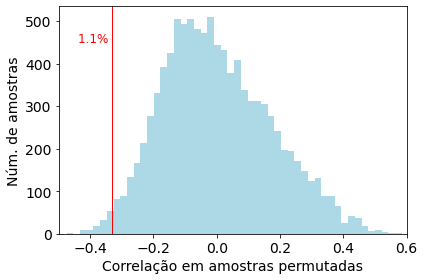

In [139]:
pl.hist(pairwise_random_corrs, bins=50, color='lightblue')
pl.axvline(actual_corr, color='r', linewidth=1)
pl.text(actual_corr, 450, '{:.1f}% '.format(pvalue * 100), color='r', fontsize=12, ha='right')
pl.tick_params(labelsize=14)
pl.xlabel('Correlação em amostras permutadas', fontsize=14)
pl.ylabel('Núm. de amostras', fontsize=14)
pl.xlim([-0.5, 0.6])
pl.tight_layout()
#pl.savefig('../resultados/plots/hist_amostras_aleatorias_correlacao_desmatamento_orcamento_superintendencias.png')
pl.show()

#### Gráfico do relatório

In [140]:
# Fita linha de tendência:
from sklearn.linear_model import LinearRegression
lin_model = LinearRegression()
dump = lin_model.fit(x.values.reshape(-1, 1), y)
x_min = x.sort_values().iloc[0]
x_max = x.sort_values().iloc[-1]
x_lin = np.linspace(x_min, x_max, 5)
y_lin = lin_model.predict(x_lin.reshape((-1, 1)))

In [141]:
ufs = ['AC', 'AM', 'AP', 'MA', 'MT', 'PA', 'RO', 'RR', 'TO']
markers = ['o', 's', 'P', '*', 'x', 'v', '^', 'd', 'p']
#markers = ['$\mathrm{' + uf + '}$' for uf in ufs]
marker_dict = dict(zip(ufs, markers))

In [142]:
actual_corr

-0.33049053133847395

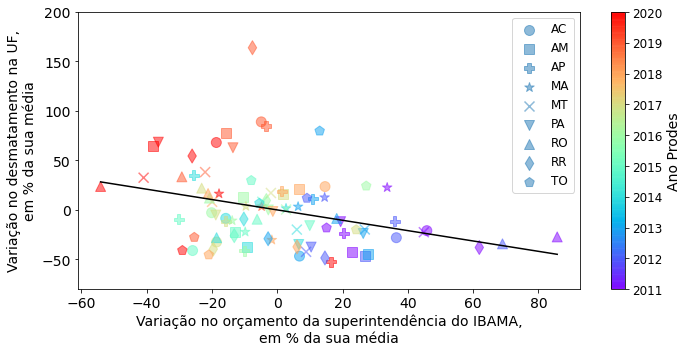

In [143]:
cmap = pl.get_cmap('rainbow')

#fig, (a0, a1) = pl.subplots(1, 2, gridspec_kw={'width_ratios': [1, 1.2]}, figsize=(10,5))
fig, a1 = pl.subplots(1, 1, figsize=(10,5))

# ORÇAMENTO SUPERINTENDÊNCIAS:
for uf in ufs:
    # Seleciona UF:
    sel = prodes_siga_uf.loc[prodes_siga_uf['UF'] == uf]
    # Pega os dados:
    x = frac_diff(sel['orcamento_geral_ibama_uf']) * 100
    y = frac_diff(sel['Incremento']) * 100
    a = sel['ano_prodes']
    # Plot:
    scat = a1.scatter(x, y, c=a, alpha=0.5, s=100, cmap=cmap, marker=marker_dict[uf], label=uf)

# Linha de tendência:
pl.plot(x_lin * 100, y_lin * 100, color='k')
    
# Format:
a1.tick_params(labelsize=14)
a1.legend(fontsize=12)
a1.set_xlabel('Variação no orçamento da superintendência do IBAMA,\nem % da sua média', fontsize=14)
a1.set_ylabel('Variação no desmatamento na UF,\nem % da sua média', fontsize=14)
#a1.set_xlim([-70, 100])
a1.set_ylim([-80, 200])
# Colorbar:
cbar = pl.colorbar(scat)
cbar.set_label(label='Ano Prodes', fontsize=14)
cbar.ax.tick_params(labelsize=12)
cbar.solids.set_edgecolor("face")

#pl.subplots_adjust(wspace=0)
pl.tight_layout()
#pl.savefig('../resultados/plots/relacao_orcamento_superintendencias_IBAMA_desmatamento_scatter.png')
pl.show()

#### Verificações gerais

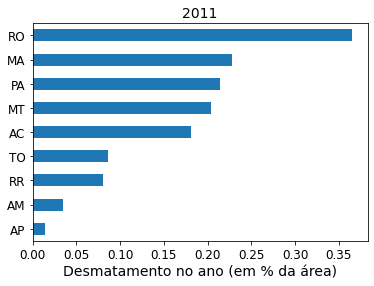

In [153]:
# Ranking de desmatamento por área
ano = 2011
prodes_uf_ano = prodes_uf.loc[ano].set_index('UF')
(prodes_uf_ano['Incremento'] / prodes_uf_ano['Desmatavel'] * 100).sort_values().plot(kind='barh')
pl.title(ano, fontsize=14)
pl.xlabel('Desmatamento no ano (em % da área)', fontsize=14)
pl.tick_params(labelsize=12)
pl.ylabel('')
pl.show()

## Explorando os dados

### Ações presentes nos critérios eliminados

In [110]:
clean = siga
clean = clean.loc[clean['Despesa Executada (R$) IPCA'] != 0.0]
clean = clean.loc[~clean['GND DESP'].isin(['PESSOAL E ENCARGOS SOCIAIS', 'JUROS E ENCARGOS DA DIVIDA', 'RESERVA DE CONTINGENCIA', 'AMORTIZACAO DA DIVIDA'])]
clean = clean.loc[clean['Função DESP'] != 'PREVIDÊNCIA SOCIAL']
clean = clean.loc[~clean['Elemento Despesa DESP'].isin(['SENTENCAS JUDICIAIS', 'AUXÍLIO FINANCEIRO A PESQUISADORES', 'AUXÍLIO FINANCEIRO A ESTUDANTES', 
                                                        'PREMIAÇÕES CULTURAIS, ARTÍSTICAS, CIENTÍFICAS, DESPORTIVAS E OUTRAS', 'PENSOES ESPECIAIS', 'DEPOSITOS COMPULSORIOS',
                                                        'EQUALIZAÇÃO DE PREÇOS E TAXAS'])]

In [123]:
x = clean.loc[clean['Função DESP'] == 'TRABALHO']
xu.mapUnique(x)
#plot_expenditure(x)


Mês (Número) DES: 1 unique values.
12

Ano: 1 unique values.
2013

Ação Ajustada DESP: 1 unique values.
FOMENTO PARA A ORGANIZAÇÃO E O DESENVOLVIMENTO DE EMPREENDIMENTOS ECONÔMICOS SOLIDÁRIOS DE CATADORES ATUANTES COM RESÍDUOS SÓLIDOS

Subfunção (Ajustada): 1 unique values.
TRABALHO - EMPREGABILIDADE

Função DESP: 1 unique values.
TRABALHO

Programa DESP: 1 unique values.
RESÍDUOS SÓLIDOS

Categoria Econômica DESP: 1 unique values.
DESPESAS CORRENTES

GND DESP: 1 unique values.
OUTRAS DESPESAS CORRENTES

Modalidade Aplicação DESP: 1 unique values.
TRANSFERÊNCIAS A INST. PRIVADAS S/ FINS LUCRATIVOS

Elemento Despesa DESP: 1 unique values.
CONTRIBUICOES

Sub-elemento Despesa DESP: 1 unique values.
INST.DE CARATER ASSIST.CULT.E EDUCACIONAL

Órgão (UG) DESP: 1 unique values.
MINISTERIO DO TRABALHO E EMPREGO

Órgão Superior (UG) DESP: 1 unique values.
MINISTERIO DO TRABALHO E EMPREGO

UG DESP: 1 unique values.
SECRETARIA NACIONAL DE ECONOMIA SOLIDARIA

Autor (Tipo): 1 unique values.
NÃO IN

In [119]:
siga.columns

Index(['Mês (Número) DES', 'Ano', 'Ação Ajustada DESP', 'Subfunção (Ajustada)',
       'Função DESP', 'Programa DESP', 'Categoria Econômica DESP', 'GND DESP',
       'Modalidade Aplicação DESP', 'Elemento Despesa DESP',
       'Sub-elemento Despesa DESP', 'Órgão (UG) DESP',
       'Órgão Superior (UG) DESP', 'UG DESP', 'Autor (Tipo)',
       'Origem da Despesa', 'UO AC (Ajustada)', 'Órgão Superior (UO AC) DESP',
       'Dotação Inicial (R$)', 'Autorizado (R$)', 'Empenhado (R$)',
       'Liquidado (R$)', 'Despesa Executada (R$)', 'Pago (R$)',
       'Pago + RP Pago (R$)', 'RP Pago (R$)', 'Contingenciamento (R$)',
       'Passível de Contingenciamento (R$)', 'Veto (R$)', 'data', 'ipca',
       'Dotação Inicial (R$) IPCA', 'Autorizado (R$) IPCA',
       'Empenhado (R$) IPCA', 'Liquidado (R$) IPCA',
       'Despesa Executada (R$) IPCA', 'Pago (R$) IPCA',
       'Pago + RP Pago (R$) IPCA', 'RP Pago (R$) IPCA',
       'Contingenciamento (R$) IPCA',
       'Passível de Contingenciamento (R$) 

In [121]:
count_by_category(clean, 'Função DESP')

,n_registros,valor_realizado
Função DESP,,
GESTÃO AMBIENTAL,173928,1.605221e+10
TRABALHO,1,1.523891e+05
ENCARGOS ESPECIAIS,2,5.878783e+03


In [34]:
xu.unique(siga.loc[siga['Função DESP'] == 'PREVIDÊNCIA SOCIAL', 'Ação Ajustada DESP'])
xu.unique(siga.loc[siga['Elemento Despesa DESP'] == 'SENTENCAS JUDICIAIS', 'Ação Ajustada DESP'])
xu.unique(siga.loc[siga['GND DESP'] == 'PESSOAL E ENCARGOS SOCIAIS', 'Ação Ajustada DESP'])

3: APOSENTADORIAS E PENSÕES - SERVIDORES CIVIS | APOSENTADORIAS E PENSÕES CIVIS DA UNIÃO | BENEFÍCIOS E PENSÕES INDENIZATÓRIAS DECORRENTES DE LEGISLAÇÃO ESPECIAL E/OU DECISÕES JUDICIAIS
10: ADMINISTRAÇÃO DA UNIDADE | APOIO À CRIAÇÃO, GESTÃO E IMPLEMENTAÇÃO DAS UNIDADES DE CONSERVAÇÃO FEDERAIS | APOSENTADORIAS E PENSÕES - SERVIDORES CIVIS | APOSENTADORIAS E PENSÕES CIVIS DA UNIÃO | ATIVOS CIVIS DA UNIÃO | CONTRIBUIÇÃO DA UNIÃO, DE SUAS AUTARQUIAS E FUNDAÇÕES PARA O CUSTEIO DO REGIME DE PREVIDÊNCIA DOS SERVIDORES PÚBLICOS FEDERAIS DECORRENTE DO PAGAMENTO DE PRECATÓRIOS E REQUISIÇÕES DE PEQUENO VALOR | FISCALIZAÇÃO AMBIENTAL E PREVENÇÃO E COMBATE A INCÊNDIOS FLORESTAIS | FUNCIONAMENTO DO SERVIÇO FLORESTAL BRASILEIRO | PESSOAL ATIVO DA UNIÃO | SENTENÇAS JUDICIAIS TRANSITADAS EM JULGADO (PRECATÓRIOS)
11: - | ADMINISTRAÇÃO DA UNIDADE | APOSENTADORIAS E PENSÕES - SERVIDORES CIVIS | APOSENTADORIAS E PENSÕES CIVIS DA UNIÃO | ATIVOS CIVIS DA UNIÃO | BENEFÍCIO ESPECIAL E DEMAIS COMPLEMENTAÇÕES DE

### Gastos do MMA (UO) feitas pela Defesa

In [40]:
gastos_defesa = siga.loc[siga['Órgão Superior (UG) STD'] == 'MINISTERIO DA DEFESA']
sample_by_valor(gastos_defesa)[inspect_cols]

,Ano,Mês (Número) DES,UO AC (Ajustada),Órgão Superior (UG) DESP,Órgão (UG) DESP,UG DESP,Função DESP,Subfunção (Ajustada),Ação Ajustada DESP,Programa DESP,GND DESP,Elemento Despesa DESP,Sub-elemento Despesa DESP,Modalidade Aplicação DESP,Despesa Executada (R$) IPCA
251779,2017,12,AGÊNCIA NACIONAL DE ÁGUAS - ANA,MINISTERIO DA DEFESA,COMANDO DA AERONAUTICA,GRUPAMENTO DE APOIO LOGISTICO,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - NORMATIZAÇÃO E FISCALIZAÇÃO,REGULAÇÃO E FISCALIZAÇÃO DOS USOS DE RECURSOS ...,RECURSOS HÍDRICOS,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,SERVICOS EM ITENS REPARAVEIS DE AVIACAO,APLICAÇÕES DIRETAS,5.203439e+05
171612,2014,12,FUNDO NACIONAL SOBRE MUDANÇA DO CLIMA - FNMC,MINISTERIO DA DEFESA,COMANDO DA MARINHA,COMISSAO NAVAL BRASILEIRA EM WASHINGTON,GESTÃO AMBIENTAL,MEIO AMBIENTE - PRESERVAÇÃO E CONSERVAÇÃO AMBI...,"FOMENTO A ESTUDOS, PROJETOS E EMPREENDIMENTOS ...",MUDANÇAS CLIMÁTICAS,INVESTIMENTOS,EQUIPAMENTOS E MATERIAL PERMANENTE,APARELHOS DE MEDICAO E ORIENTACAO,APLICAÇÕES DIRETAS,2.481207e+06
225352,2016,12,AGÊNCIA NACIONAL DE ÁGUAS - ANA,MINISTERIO DA DEFESA,COMANDO DO EXERCITO,COMANDO LOGISTICO,GESTÃO AMBIENTAL,MEIO AMBIENTE - RECURSOS HÍDRICOS,IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE RECURSOS...,RECURSOS HÍDRICOS,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,SERVICOS EM ITENS REPARAVEIS DE AVIACAO,APLICAÇÕES DIRETAS,3.652366e+05
223985,2016,12,INSTITUTO CHICO MENDES DE CONSERVAÇÃO DA BIODI...,MINISTERIO DA DEFESA,COMANDO DO EXERCITO,COMANDO DO COMANDO MILITAR DA AMAZONIA,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,INVESTIMENTOS,EQUIPAMENTOS E MATERIAL PERMANENTE,MAQUINAS E EQUIPAMENTOS ENERGETICOS,APLICAÇÕES DIRETAS,5.780477e+04
314697,2020,12,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DA DEFESA,COMANDO DA AERONAUTICA,CENTRO DE AQUISICOES ESPECIFICAS,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,PROGRAMA DE GESTAO E MANUTENCAO DO PODER EXECU...,OUTRAS DESPESAS CORRENTES,MATERIAL DE CONSUMO,MATERIAL HOSPITALAR,APLICAÇÕES DIRETAS,6.921349e+05


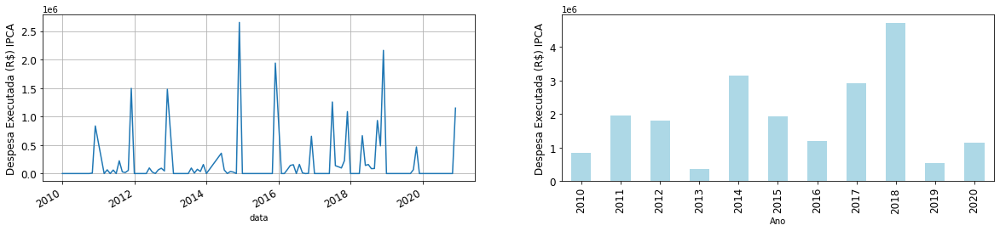

In [41]:
pl.figure(figsize=(20,4))
plot_expenditure(gastos_defesa)
pl.show()

### Recortes antigos (usados em explorações)

In [30]:
# Seleciona apenas entradas com alguma execução, para limpar as classificações
executado = siga.loc[siga['Despesa Executada (R$) IPCA'] != 0]

In [31]:
# Sem gastos com previdência social:
siga_s_prev = siga.loc[~siga['Função DESP'].isin(['PREVIDÊNCIA SOCIAL'])]
executado_s_prev = executado.loc[~executado['Função DESP'].isin(['PREVIDÊNCIA SOCIAL'])]

In [32]:
# Só previdência social:
siga_prev = siga.loc[siga['Função DESP'].isin(['PREVIDÊNCIA SOCIAL'])]
executado_prev = executado.loc[executado['Função DESP'].isin(['PREVIDÊNCIA SOCIAL'])]

In [33]:
# Sem gastos com previdência social ou despesas com senteças judiciais:
siga_s_prev_jud = siga_s_prev.loc[siga_s_prev['Elemento Despesa DESP'] != 'SENTENCAS JUDICIAIS']
executado_s_prev_jud = executado_s_prev.loc[executado_s_prev['Elemento Despesa DESP'] != 'SENTENCAS JUDICIAIS']

In [34]:
# Remove orgãos that are not of interest:
executado_orgaos_filtrados = executado_s_prev_jud.loc[~executado_s_prev_jud['Órgão (UG) DESP'].isin(veto_orgaos)]
siga_orgaos_filtrados = siga_s_prev_jud.loc[~siga_s_prev_jud['Órgão (UG) DESP'].isin(veto_orgaos)]

In [35]:
# Divide os gastos com servidores e outros:
servidores    = executado_orgaos_filtrados.loc[executado_orgaos_filtrados['GND DESP'].isin(['PESSOAL E ENCARGOS SOCIAIS'])]
outros_gastos = executado_orgaos_filtrados.loc[~executado_orgaos_filtrados['GND DESP'].isin(['PESSOAL E ENCARGOS SOCIAIS'])]
siga_outros_gastos = siga_orgaos_filtrados.loc[~siga_orgaos_filtrados['GND DESP'].isin(['PESSOAL E ENCARGOS SOCIAIS'])]

In [37]:
# Seleção de ações específicas:
outros_gastos = outros_gastos.copy()
outros_gastos['grupo_acao'] = outros_gastos['Ação Ajustada DESP'].map(acoes_grupo_dict)

#### Gráficos com esses recortes

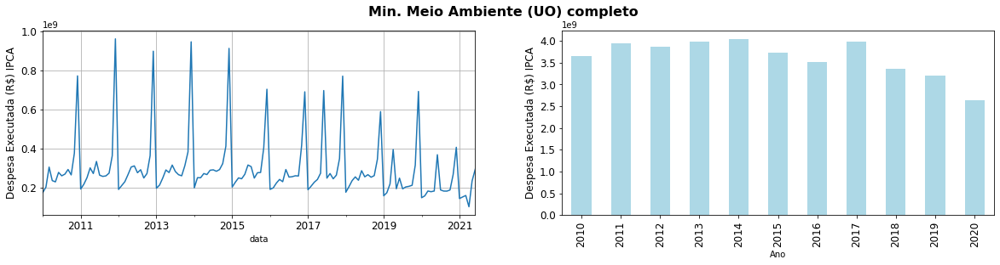

In [40]:
pl.figure(figsize=(20,4))
plot_expenditure(siga, title='Min. Meio Ambiente (UO) completo')
pl.show()

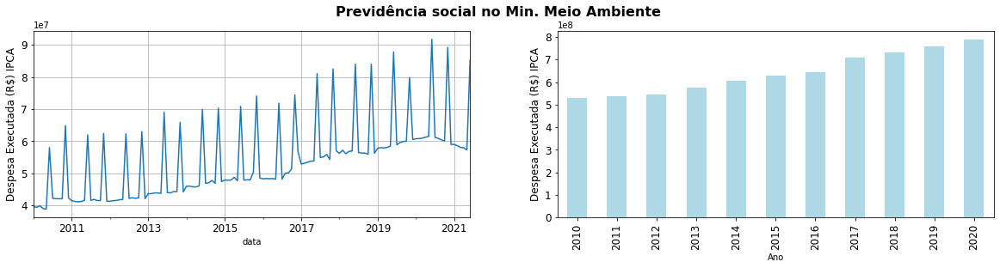

In [41]:
pl.figure(figsize=(20,4))
plot_expenditure(siga_prev, title='Previdência social no Min. Meio Ambiente')
pl.show()

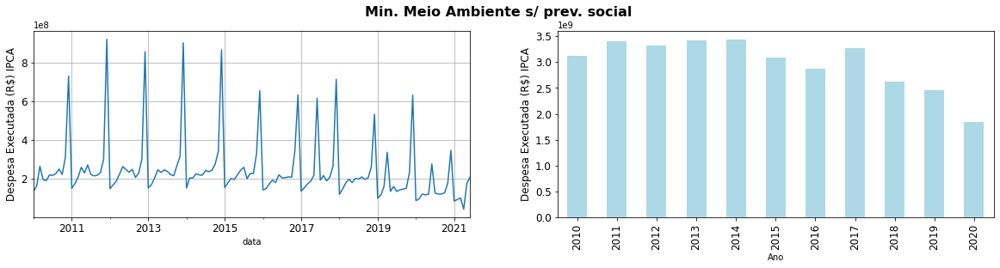

In [42]:
pl.figure(figsize=(20,4))
plot_expenditure(siga_s_prev, title='Min. Meio Ambiente s/ prev. social')
pl.show()

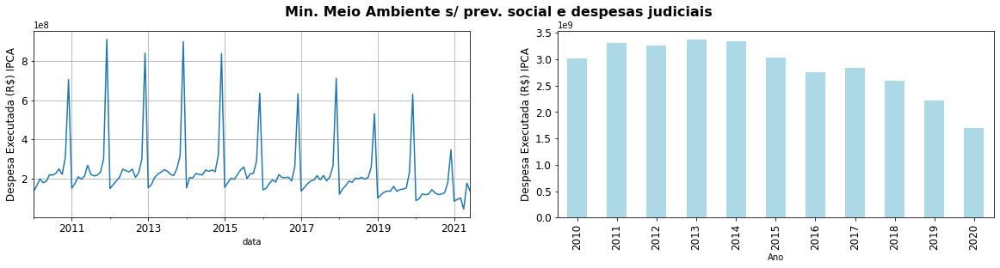

In [43]:
pl.figure(figsize=(20,4))
plot_expenditure(siga_s_prev_jud, title='Min. Meio Ambiente s/ prev. social e despesas judiciais')
pl.show()

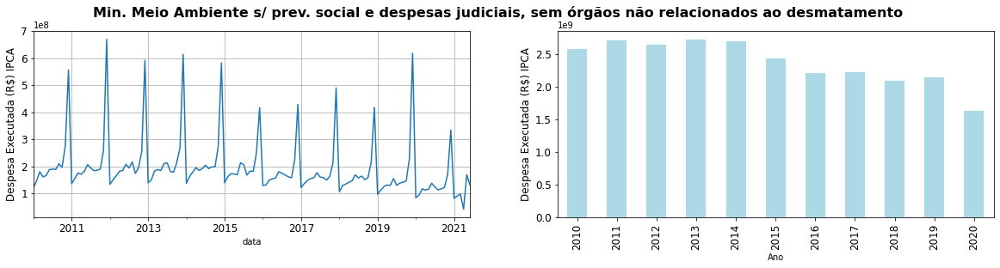

In [44]:
pl.figure(figsize=(20,4))
plot_expenditure(executado_orgaos_filtrados, title='Min. Meio Ambiente s/ prev. social e despesas judiciais, sem órgãos não relacionados ao desmatamento')
pl.show()

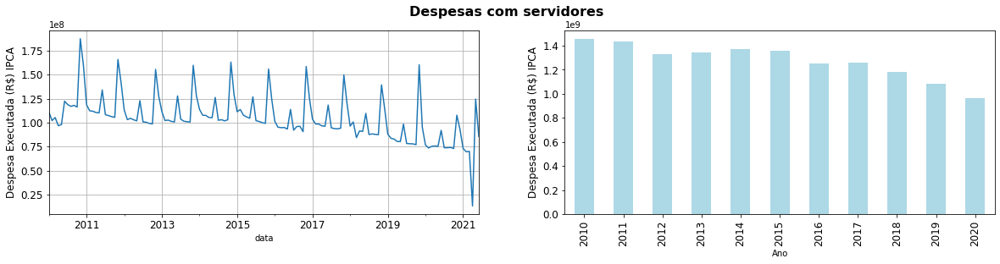

In [45]:
pl.figure(figsize=(20,4))
plot_expenditure(servidores, title='Despesas com servidores')
pl.show()

<ipython-input-46-0b3215abd26a>:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  pl.subplot(1,2,2)


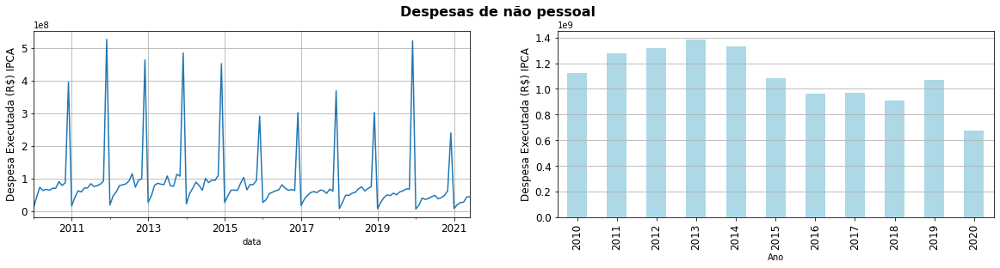

In [46]:
pl.figure(figsize=(20,4))
plot_expenditure(siga_outros_gastos, title='Despesas de não pessoal')
pl.subplot(1,2,2)
pl.grid(axis='y')
pl.show()

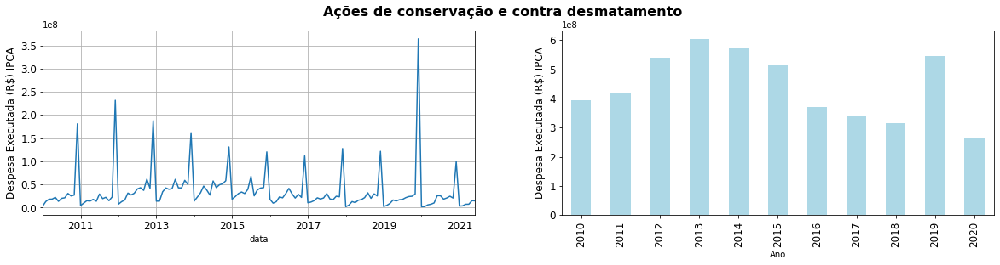

In [47]:
pl.figure(figsize=(20,4))
plot_expenditure(outros_gastos.loc[outros_gastos['grupo_acao'].isin(['desmatamento', 'conservação', 'florestal'])], title='Ações de conservação e contra desmatamento')
pl.show()

In [48]:
xu.unique(executado['Órgão (UG) STD'])

79: ADVOCACIA-GERAL DA UNIAO | AGENCIA ESPACIAL BRASILEIRA - AEB | AGENCIA NACIONAL DE AGUAS | AGENCIA NACIONAL DE TRANSPORTES TERRESTRES | AGENCIA NACIONAL DE VIGILANCIA SANITARIA | CIA.DE DES.DOS VALES DO S.FRANC.E DO PARNAIBA | COMANDO DA AERONAUTICA | COMANDO DA MARINHA | COMANDO DO EXERCITO | COMPANHIA DE PESQUISA DE RECURSOS MINERAIS | COMPANHIA NACIONAL DE ABASTECIMENTO | CONSELHO NACIONAL DE DES.CIENT.E TECNOLOGICO | CONTROLADORIA-GERAL DA UNIAO | DEFENSORIA PUBLICA DA UNIAO | DEPARTAMENTO DE POLICIA FEDERAL | DEPARTAMENTO DE POLICIA RODOVIARIA FEDERAL/MJ | DEPARTAMENTO NAC.DE OBRAS CONTRA AS SECAS | EMPRESA BRASILEIRA DE PESQUISA AGROPECUARIA | FUND.COORD.DE APERF.DE PESSOAL NIVEL SUPERIOR | FUND.UNIVERSIDADE FEDERAL VALE SAO FRANCISCO | FUNDACAO ESCOLA NACIONAL DE ADM. PUBLICA | FUNDACAO NACIONAL DO INDIO | FUNDACAO OSWALDO CRUZ | FUNDACAO UNIVERSIDADE DE BRASILIA | FUNDACAO UNIVERSIDADE DO AMAZONAS | FUNDACAO UNIVERSIDADE FEDERAL DE PELOTAS | FUNDACAO UNIVERSIDADE FEDERAL DE

In [49]:
count_by_category(executado, 'UO AC (Ajustada)')

,n_registros,valor_realizado
UO AC (Ajustada),,
INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RECURSOS NATURAIS RENOVÁVEIS - IBAMA,93878,2.079924e+10
INSTITUTO CHICO MENDES DE CONSERVAÇÃO DA BIODIVERSIDADE,40898,9.657365e+09
AGÊNCIA NACIONAL DE ÁGUAS - ANA,18272,4.472435e+09
MINISTÉRIO DO MEIO AMBIENTE - ADMINISTRAÇÃO DIRETA,18593,4.218881e+09
INSTITUTO DE PESQUISAS JARDIM BOTÂNICO DO RIO DE JANEIRO - JBRJ,9718,9.765580e+08
SERVIÇO FLORESTAL BRASILEIRO - SFB,9913,5.909945e+08
FUNDO NACIONAL SOBRE MUDANÇA DO CLIMA - FNMC,396,1.881605e+08
FUNDO NACIONAL DE MEIO AMBIENTE - FNMA,1023,6.595562e+07


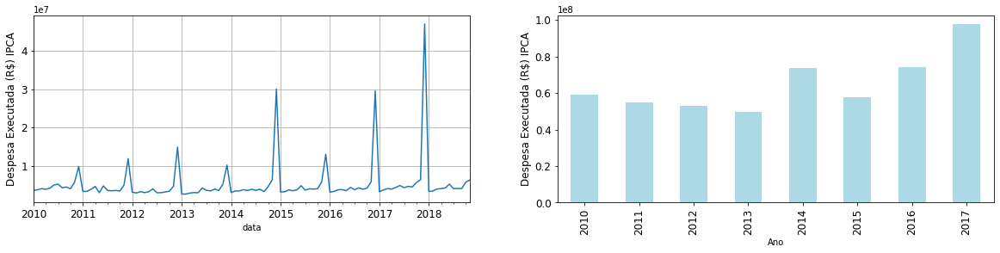

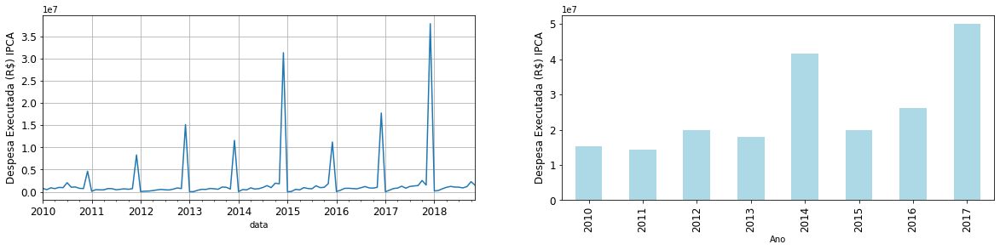

In [87]:
pl.figure(figsize=(20,4))
plot_expenditure(executado.loc[executado['UO AC (Ajustada)'] == 'SERVIÇO FLORESTAL BRASILEIRO - SFB'])
pl.show()

pl.figure(figsize=(20,4))
plot_expenditure(executado.loc[executado['Órgão (UG) STD'] == 'SERVICO FLORESTAL BRASILEIRO'])
pl.show()

### Serviço Florestal Brasileiro

In [94]:
print(xu.Bold('Órgão (UG) STD'))
print_array_series(check_guarda_compartilhada(siga.loc[siga['Órgão (UG) STD'] == 'SERVICO FLORESTAL BRASILEIRO'], 'Órgão (UG) STD', 'UO AC (Ajustada)', drop_unique=False))
print(xu.Bold('UO AC (Ajustada)'))
print_array_series(check_guarda_compartilhada(siga.loc[siga['UO AC (Ajustada)'] == 'SERVIÇO FLORESTAL BRASILEIRO - SFB'], 'UO AC (Ajustada)', 'Órgão (UG) STD', drop_unique=False))

Órgão (UG) STD
SERVICO FLORESTAL BRASILEIRO: SERVIÇO FLORESTAL BRASILEIRO - SFB / MINISTÉRIO DO MEIO AMBIENTE - ADMINISTRAÇÃO DIRETA / FUNDO NACIONAL SOBRE MUDANÇA DO CLIMA - FNMC
UO AC (Ajustada)
SERVIÇO FLORESTAL BRASILEIRO - SFB: SERVICO FLORESTAL BRASILEIRO / MINISTERIO DO MEIO AMBIENTE / INSTITUTO DE PESQUISAS JARDIM BOTANICO DO RJ / MINISTERIO DA ECONOMIA / UNIVERSIDADE FEDERAL DE LAVRAS / FUNDO NACIONAL DO MEIO AMBIENTE / UNIVERSIDADE FEDERAL DO PARA / EMPRESA BRASILEIRA DE PESQUISA AGROPECUARIA / FUNDACAO UNIVERSIDADE FEDERAL DO ACRE / FUNDACAO UNIVERSIDADE DO AMAZONAS / MINISTERIO DAS RELACOES EXTERIORES


### Contribuições

In [68]:
# Seleciona os dados:
contribuicoes = executado.loc[executado['Elemento Despesa DESP'] == 'CONTRIBUICOES']

In [69]:
count_by_category(contribuicoes, 'Modalidade Aplicação DESP')

,n_registros,valor_realizado
Modalidade Aplicação DESP,,
TRANSFERÊNCIAS A ESTADOS E AO DISTRITO FEDERAL,386,7.595512e+08
TRANSFERÊNCIAS A INST. PRIVADAS S/ FINS LUCRATIVOS,91,4.643058e+08
TRANSFERÊNCIAS A MUNICÍPIOS,127,1.590944e+08
TRANSFERÊNCIAS AO EXTERIOR,4,4.572980e+06
TRANSFERÊNCIAS A INSTITUIÇÕES MULTIGOVERNAMENTAIS,1,3.114661e+06
TRANSFERÊNCIAS A CONSÓRCIOS PÚBLICOS,2,1.605527e+06


In [72]:
count_by_category(contribuicoes.loc[contribuicoes['Ano'].isin([2019])], 'Ação Ajustada DESP')

,n_registros,valor_realizado
Ação Ajustada DESP,,
"PREVENCAO, FISCALIZACAO, COMBATE E CONTROLE AO DESMATAMENTO",18,2.513547e+08
"APOIO À CRIAÇÃO, GESTÃO E IMPLEMENTAÇÃO DAS UNIDADES DE CONSERVAÇÃO FEDERAIS",4,1.092847e+06
FOMENTO PARA A MELHORIA DA QUALIDADE AMBIENTAL,3,9.610405e+05
APOIO À IMPLEMENTAÇÃO DE INSTRUMENTOS ESTRUTURANTES DA POLITICA NACIONAL DE RESÍDUOS SÓLIDOS,1,8.032422e+05
POLÍTICAS PARA A GESTÃO AMBIENTAL E TERRITORIAL DA ZONA COSTEIRA,1,7.322072e+05
APOIO À GESTÃO AMBIENTAL EM ÁREAS URBANAS,1,6.721006e+05
GESTÃO DO USO SUSTENTÁVEL DA BIODIVERSIDADE,2,2.185693e+05
AMPLIAÇÃO E CONSOLIDAÇÃO DO SISTEMA NACIONAL DE UNIDADES DE CONSERVAÇÃO DA NATUREZA,1,1.092847e+05
APOIO À IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE EDUCAÇÃO AMBIENTAL,1,1.092847e+05


### Explorando ações não agrupadas manualmente 

In [52]:
teste = executado.loc[~executado['GND DESP'].isin(['PESSOAL E ENCARGOS SOCIAIS'])]

In [55]:
count_by_category(teste.loc[teste['Ação Ajustada DESP'].map(acoes_grupo_dict).isnull()], 'Ação Ajustada DESP')

,n_registros,valor_realizado
Ação Ajustada DESP,,
TRANSFERÊNCIA DOS RECURSOS DA COBRANÇA ÀS AGÊNCIAS DE ÁGUAS (LEIS Nº 9.433/1997 E Nº 10.881/2004),52,4.886650e+08
REMOÇÃO DE CARGAS POLUIDORAS DE BACIAS HIDROGRÁFICAS - PRODES,11,1.749455e+08
DESENVOLVIMENTO DE AÇÕES PRIORIZADAS PELO COMITÊ DA BACIA HIDROGRÁFICA DO RIO PARAÍBA DO SUL COM RECURSOS DA COBRANÇA PELO USO DE RECURSOS HÍDRICOS,12,9.448168e+07
DESENVOLVIMENTO DE AÇÕES PRIORIZADAS PELO COMITÊ DA BACIA HIDROGRÁFICA DO RIO SÃO FRANCISCO COM RECURSOS DA COBRANÇA PELO USO DE RECURSOS HÍDRICOS,13,7.354089e+07
DESENVOLVIMENTO DE AÇÕES PRIORIZADAS PELO COMITÊ DA BACIA HIDROGRÁFICA DOS RIOS PIRACICABA/JUNDIAÍ E CAPIVARI COM RECURSOS DA COBRANÇA PELO USO DE RECURSOS HÍDRICOS,12,6.315634e+07
MODERNIZAÇÃO DA REDE HIDROMETEOROLÓGICA,35,5.242006e+07
APLICAÇÃO DOS RECURSOS DA COBRANÇA PELO USO DE RECURSOS HÍDRICOS NA BACIA HIDROGRÁFICA DO RIO SÃO FRANCISCO,7,3.529466e+07
PROTEÇÃO E AMPLIAÇÃO DE COLEÇÕES VIVAS EM JARDINS BOTÂNICOS,487,3.348696e+07
IMPLANTAÇÃO DO SISTEMA NACIONAL DE INFORMAÇÕES SOBRE RECURSOS HÍDRICOS,93,3.328744e+07


### Pico em 2019: transferência para Estados

Essa transferência ocorreu em consequência da ADPF 568.

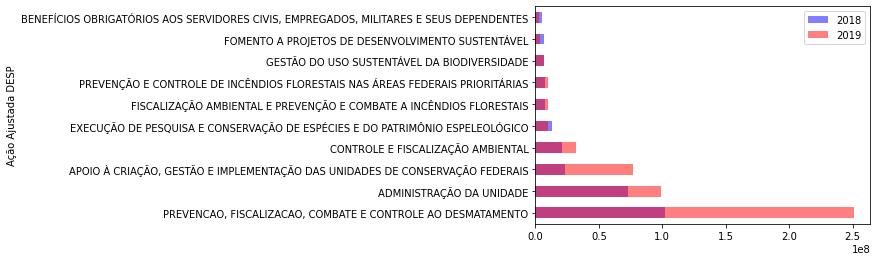

In [40]:
i = 2
count_by_col_pos(outros_gastos.loc[(outros_gastos['Ano'] == 2018) & (outros_gastos['Mês (Número) DES'] == 12)], i).head(10)['valor_realizado'].plot(kind='barh', alpha=0.5, color='blue', label=2018)
count_by_col_pos(outros_gastos.loc[(outros_gastos['Ano'] == 2019) & (outros_gastos['Mês (Número) DES'] == 12)], i).head(10)['valor_realizado'].plot(kind='barh', alpha=0.5, color='red', label=2019)
pl.legend()

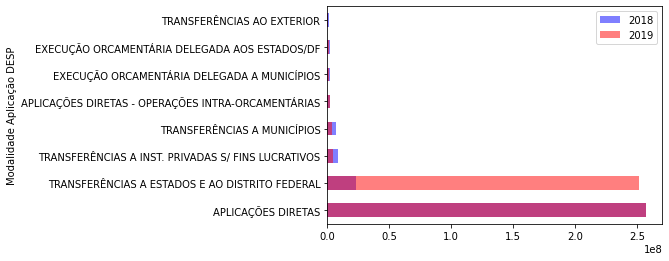

In [41]:
i = 8
count_by_col_pos(outros_gastos.loc[(outros_gastos['Ano'] == 2018) & (outros_gastos['Mês (Número) DES'] == 12)], i).head(10)['valor_realizado'].plot(kind='barh', alpha=0.5, color='blue', label=2018)
count_by_col_pos(outros_gastos.loc[(outros_gastos['Ano'] == 2019) & (outros_gastos['Mês (Número) DES'] == 12)], i).head(10)['valor_realizado'].plot(kind='barh', alpha=0.5, color='red', label=2019)
pl.legend()

In [44]:
#siga['Ação Ajustada DESP'].unique()

In [58]:
df = siga

follow_cols   = ['Modalidade Aplicação DESP', 'Ação Ajustada DESP']
follow_labels = ['TRANSFERÊNCIAS A ESTADOS E AO DISTRITO FEDERAL', 'PREVENCAO, FISCALIZACAO, COMBATE E CONTROLE AO DESMATAMENTO']
date_cols = ['Ano', 'Mês (Número) DES']

In [73]:
select_matching_entries(siga, follow_cols, follow_labels).groupby('Sub-elemento Despesa DESP')['Despesa Executada (R$) IPCA'].sum()

Sub-elemento Despesa DESP
ACRE             1.913304e+07
AMAPA            1.388177e+07
AMAZONAS         3.284345e+07
MARANHAO         2.583474e+07
MATO GROSSO      4.643492e+07
NÃO APLICÁVEL    0.000000e+00
PARA             5.430398e+07
RONDONIA         2.133618e+07
RORAIMA          2.027018e+07
TOCANTINS        1.731645e+07
Name: Despesa Executada (R$) IPCA, dtype: float64

In [71]:
get_expense_timeline(siga, ['Modalidade Aplicação DESP', 'Ação Ajustada DESP'], ['TRANSFERÊNCIAS A ESTADOS E AO DISTRITO FEDERAL', 'PREVENCAO, FISCALIZACAO, COMBATE E CONTROLE AO DESMATAMENTO'])

Dotação Inicial (R$)  Autorizado (R$)  Empenhado (R$)  \
Ano  Mês (Número) DES                                                          
2019 12                                 0.0      230000000.0     230000000.0   
2020 1                                  0.0              0.0             0.0   
     2                                  0.0              0.0             0.0   

                       Liquidado (R$)  Despesa Executada (R$)  Pago (R$)  \
Ano  Mês (Número) DES                                                      
2019 12                           0.0             230000000.0        0.0   
2020 1                            0.0                     0.0        0.0   
     2                            0.0                     0.0        0.0   

                       Pago + RP Pago (R$)  RP Pago (R$)  \
Ano  Mês (Número) DES                                      
2019 12                                0.0           0.0   
2020 1                         199946880.0   199946880.0   
     2                          30053120.0    30053120.0   

                       Contingenciamento (R$)  \
Ano  Mês (Número) DES                           
2019 12                                     0   
2020 1                                      0   
     2                                      0   

                       Passível de Contingenciamento (R$)  Veto (R$)  
Ano  Mês (Número) DES                                                 
2019 12                                       230000000.0          0  
2020 1                                                0.0          0  
     2                                                0.0          0

### Fases da despesa

**Conclusões:**

* Os valores que aparecem em cada mês são os valores que foram inscritos naquele mês, naquela fase de despesa. 
A medida que a despesa vai caminhando, as movimentações vão sendo registradas nas colunas associadas. E.g.: Se no mês de março empenhou-se um certo montante, esse valor aparece. Se depois no mês de abril a despesa é executada, ele valor aparece nessa coluna, e assim vai. Algumas colunas podem apresentar valores negativos quando: existe registro errado, ou quando o valor é abatido (e.g. na coluna RP inscritos, quando o RP é pago, eles lançam um valor negativo naquela coluna no mês do pagamento e lançam um valor positivo no RP pago).

In [58]:
siga[value_cols].sample(10)

,Dotação Inicial (R$),Autorizado (R$),Empenhado (R$),Liquidado (R$),Despesa Executada (R$),Pago (R$),Pago + RP Pago (R$),RP Pago (R$),Contingenciamento (R$),Passível de Contingenciamento (R$),Veto (R$)
44638,0.0,0.00,302.35,700.00,700.00,700.00,700.00,0.00,0,0.0,0
248296,0.0,0.00,-1836781.00,7472293.50,7472293.50,7472293.50,7472293.50,0.00,0,0.0,0
202662,0.0,0.00,0.00,1258799.65,1258799.65,1258799.65,1699014.99,440215.34,0,0.0,0
265864,-200000.0,-622271.00,0.00,0.00,0.00,0.00,0.00,0.00,0,-622271.0,0
226152,0.0,0.00,222990.00,0.00,222990.00,0.00,0.00,0.00,0,0.0,0
226284,0.0,0.00,4448.66,0.00,0.00,0.00,4448.66,4448.66,0,0.0,0
165234,0.0,0.00,172501.31,169081.79,169081.79,158889.18,164348.07,5458.89,0,0.0,0
87069,0.0,0.00,300000.00,92386.95,92386.95,92386.95,92386.95,0.00,0,0.0,0
296528,0.0,0.00,335000.00,329316.63,531358.07,184207.20,184207.20,0.00,0,0.0,0
58895,0.0,-586691.77,0.00,0.00,0.00,0.00,0.00,0.00,0,0.0,0


In [70]:
get_expense_timeline(siga, 
                     ['UO AC (Ajustada)', 'Programa DESP', 'Sub-elemento Despesa DESP'], 
                     ['INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RECURSOS NATURAIS RENOVÁVEIS - IBAMA',
                      'PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO DO MEIO AMBIENTE',
                      'MANUT.CONS.EQUIP. DE  PROCESSAMENTO DE DADOS'])

Dotação Inicial (R$)  Autorizado (R$)  Empenhado (R$)  \
Ano  Mês (Número) DES                                                          
2012 1                                  0.0              0.0         1823.94   
     2                                  0.0              0.0         7766.66   
     3                                  0.0              0.0         4794.90   
     4                                  0.0              0.0        11735.91   
     5                                  0.0              0.0        19215.98   
     6                                  0.0              0.0         2649.99   
     7                                  0.0              0.0        14002.51   
     8                                  0.0              0.0            0.00   
     9                                  0.0              0.0            0.00   
     10                                 0.0              0.0        -5282.98   
     11                                 0.0              0.0            0.00   
     12                                 0.0              0.0       -12013.42   
2013 2                                  0.0              0.0         2500.00   
     3                                  0.0              0.0         2500.00   
     4                                  0.0              0.0        10720.00   
     5                                  0.0              0.0            0.00   
     6                                  0.0              0.0            0.00   
     7                                  0.0              0.0          700.00   
     8                                  0.0              0.0         1028.20   
     9                                  0.0              0.0            0.00   
     10                                 0.0              0.0          300.00   
     11                                 0.0              0.0         1520.00   
     12                                 0.0              0.0        -7723.90   
2014 1                                  0.0              0.0         2500.00   
     2                                  0.0              0.0         2000.00   
     6                                  0.0              0.0         1594.00   
     7                                  0.0              0.0         3000.00   
     8                                  0.0              0.0            0.00   
     9                                  0.0              0.0          160.00   
     10                                 0.0              0.0            0.00   
     11                                 0.0              0.0            0.00   
     12                                 0.0              0.0         5000.00   
2015 1                                  0.0              0.0         3930.22   
     2                                  0.0              0.0          608.33   
     3                                  0.0              0.0         4538.55   
     4                                  0.0              0.0         1930.22   
     5                                  0.0              0.0         7146.88   
     6                                  0.0              0.0         4538.55   
     7                                  0.0              0.0         4538.55   
     8                                  0.0              0.0         4538.55   
     9                                  0.0              0.0         4737.55   
     10                                 0.0              0.0         4538.55   
     11                                 0.0              0.0         6468.77   
     12                                 0.0              0.0       -22157.86   
2016 4                                  0.0              0.0         2875.00   
     5                                  0.0              0.0            0.00   
     6                                  0.0              0.0            0.00   
     7                                  0.0              0.0            0.00   
     9                 

### Gastos com não servidores

* O sub-elemento despesa não está contido nos elementos de despesa.

In [213]:
print_array_series(check_guarda_compartilhada(outros_gastos, 'Órgão (UG) DESP', 'Órgão Superior (UG) DESP'))

CONSELHO NACIONAL DE DES.CIENT.E TECNOLOGICO: MINISTERIO DA CIENCIA E TECNOLOGIA / MINISTERIO DA CIENCIA, TECNOLOGIA E INOVACAO / MINIST.DA CIENCIA,TECNOL.,INOV.E COMUNICACOES / MINISTERIO DA CIENCIA, TECNOLOGIA E INOVACOES
DEPARTAMENTO DE POLICIA FEDERAL: MINISTERIO DA JUSTICA / MINISTERIO DA JUSTICA E CIDADANIA / MINISTERIO DA JUSTICA E SEGURANCA PUBLICA
FUNDACAO ESCOLA NACIONAL DE ADM. PUBLICA: MINISTERIO DO PLANEJAMENTO,ORCAMENTO E GESTAO / MINISTERIO DA ECONOMIA
INSTIT. NAC. DE COLONIZACAO E REFORMA AGRARIA: MINISTERIO DO DESENVOLVIMENTO AGRARIO / PRESIDENCIA DA REPUBLICA
INSTITUTO DE PESQUISA ECONOMICA APLICADA: PRESIDENCIA DA REPUBLICA / MINIST. DO PLANEJAMENTO, DESENVOLV. E GESTAO / MINISTERIO DA ECONOMIA


In [214]:
print_array_series(check_guarda_compartilhada(outros_gastos, 'UG DESP', 'Órgão (UG) DESP'))

CENTRAL DE COMPRAS E CONTRATACOES - CENTRAL: MINIST. DO PLANEJAMENTO, DESENVOLV. E GESTAO / MINISTERIO DA ECONOMIA
COORDENACAO-GERAL DE GESTAO DE PESSOAS - MF: MINISTERIO DA FAZENDA / MINISTERIO DA ECONOMIA
COORDENACAO-GERAL DE LOGISTICA-CGL: MINISTERIO DA JUSTICA / MINISTERIO DA JUSTICA E CIDADANIA
COORDENACAO-GERAL DE RECURSOS LOGISTICOS: MINISTERIO DA CIENCIA E TECNOLOGIA / MINISTERIO DA CIENCIA, TECNOLOGIA E INOVACAO
ESCOLA DE ADMINISTRACAO FAZENDARIA: MINISTERIO DA FAZENDA / MINISTERIO DA ECONOMIA
INSTITUTO NACIONAL DE METEOROLOGIA: MINISTERIO DA AGRICULTURA, PECUARIA E ABASTECIMENTO / MINIST. DA AGRICUL.,PECUARIA E ABASTECIMENTO


In [215]:
#print_array_series(check_guarda_compartilhada(outros_gastos, 'Sub-elemento Despesa DESP', 'Elemento Despesa DESP'))

In [216]:
sample_by_valor(outros_gastos.loc[outros_gastos['Ano'] < 2015])[inspect_cols]

,Ano,Mês (Número) DES,UO AC (Ajustada),Órgão Superior (UG) DESP,Órgão (UG) DESP,UG DESP,Função DESP,Subfunção (Ajustada),Ação Ajustada DESP,Programa DESP,Categoria Econômica DESP,GND DESP,Elemento Despesa DESP,Sub-elemento Despesa DESP,Despesa Executada (R$) IPCA
77495,2012,1,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - COORDENACAO-GERAL DE FINANCAS - CGFIN,GESTÃO AMBIENTAL,SAÚDE - ATENÇÃO BÁSICA,ASSISTÊNCIA MÉDICA E ODONTOLÓGICA AOS SERVIDOR...,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,INDENIZACOES E RESTITUICOES,RESSARCIMENTO ASSISTENCIA MEDICA/ODONTOLOGICA,1.666230e+06
56212,2011,6,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - COORDENACAO-GERAL DE FINANCAS - CGFIN,GESTÃO AMBIENTAL,MEIO AMBIENTE - CONTROLE AMBIENTAL,MONITORAMENTO E CONTROLE DO DESMATAMENTO E DOS...,"PREVENÇÃO E COMBATE AO DESMATAMENTO, QUEIMADAS...",DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,TRANSPORTE DE SERVIDORES,1.632737e+07
96672,2012,8,MINISTÉRIO DO MEIO AMBIENTE - ADMINISTRAÇÃO DI...,MINISTERIO DO MEIO AMBIENTE,MINISTERIO DO MEIO AMBIENTE,DEP.REVITALIZACAO BACIAS HIDROGRAFICAS - DRBH,GESTÃO AMBIENTAL,MEIO AMBIENTE - RECURSOS HÍDRICOS,DESSALINIZAÇÃO DE ÁGUA - ÁGUA DOCE,SEGURANÇA ALIMENTAR E NUTRICIONAL,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,CONTRIBUICOES,CEARA,1.090111e+07
47989,2011,4,INSTITUTO CHICO MENDES DE CONSERVAÇÃO DA BIODI...,MINISTERIO DO MEIO AMBIENTE,INST.CHICO MENDES DE CONSER.DA BIODIVERSIDADE,INSTITUTO CHICO MENDES - SEDE,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ADMINISTRAÇÃO DA UNIDADE,APOIO ADMINISTRATIVO,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,DESPESAS DE EXERCICIOS ANTERIORES,SERVICOS DE TERCEIROS - PESSOA JURIDICA,7.403848e+05
172268,2014,12,MINISTÉRIO DO MEIO AMBIENTE - ADMINISTRAÇÃO DI...,MINISTERIO DO MEIO AMBIENTE,MINISTERIO DO MEIO AMBIENTE,"SUBSECRET.DE PLANEJ.,ORC.E ADMINIST.±SPOA/MMA",GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,MODERNIZAÇÃO DA GESTÃO DE ATIVIDADES LIGADAS A...,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,SUPORTE DE INFRAESTRUTURA DE T.I.,3.986638e+06


### Gastos com servidores

* Os picos no meio e no final de cada ano correspondem ao pagamento do 13° salário.
* Férias são tipicamente pagas em dezembro.
* Aparentemente houve congelamento de remunerações e queda no número de servidores desde 2017.
* Parece ter havido maior quantidade de servidores requisitados de outros órgãos para o MMA.

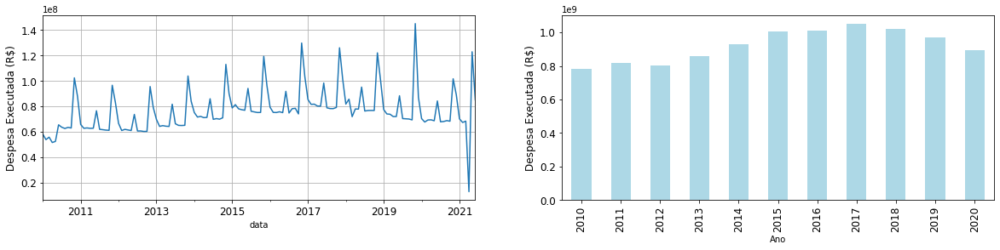

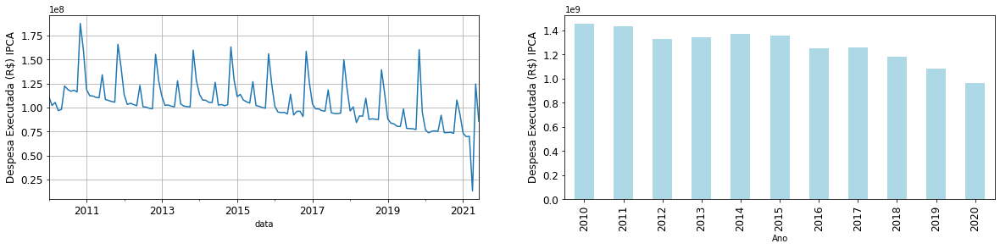

In [217]:
pl.figure(figsize=(20,4))
plot_expenditure(servidores, sum_y='Despesa Executada (R$)')
pl.show()

pl.figure(figsize=(20,4))
plot_expenditure(servidores)
#pl.subplot(1,2,1)
#pl.axvline('2011-11-01', linewidth=1, color='red', linestyle='--')
pl.show()

In [218]:
subelemento_dict = {'13 SALARIO - PENSOES CIVIS': '13 SALARIO',
 '13 SALARIO - PESSOAL CIVIL': '13 SALARIO',
 '13 SALARIO - PESSOAL CIVIL - PENSIONISTAS': '13 SALARIO',
 '13. SALARIO': '13 SALARIO',
 '13. SALARIO - CONTRATO TEMPORARIO': '13 SALARIO',
 '13? SALARIO': '13 SALARIO',
 '13º SALARIO': '13 SALARIO',
 '13¿ SALARIO': '13 SALARIO',
 'ABONO DE PERMANENCIA': 'EXTRAS',
 'ADICIONAL DE INSALUBRIDADE': 'ADICIONAIS',
 'ADICIONAL DE PERICULOSIDADE': 'ADICIONAIS',
 'ADICIONAL DE PERICULOSIDADE CONTR. TEMPORARIO': 'ADICIONAIS',
 'ADICIONAL DE TRANSFERENCIA - ART. 469/CLT': 'ADICIONAIS',
 'ADICIONAL NATALINO': 'ADICIONAIS',
 'ADICIONAL NOTURNO': 'ADICIONAIS',
 'APOSENTADORIAS, RESERVA REMUNERADA E REFORMAS': 'PROVENTOS',
 'ATIVO CIVIL': 'VENCIMENTOS',
 'AUXILIO FUNERAL ATIVO CIVIL': 'AUXILIOS',
 'AUXILIO FUNERAL ATIVO MILITAR': 'AUXILIOS',
 'AUXILIO FUNERAL INATIVO CIVIL': 'AUXILIOS',
 'AUXILIO NATALIDADE ATIVO CIVIL': 'AUXILIOS',
 'AUXILIO NATALIDADE INATIVO MILITAR': 'AUXILIOS',
 'AVISO PREVIO.': 'DEMISSAO',
 'CONTRIB. A ENTIDADES FECHADAS DE PREVIDENCIA': 'PREVIDENCIA',
 'CONTRIBUICAO PATRONAL - FUNPRESP LEI 12618/12': 'PREVIDENCIA',
 'CONTRIBUICAO PATRONAL PARA O RPPS': 'PREVIDENCIA',
 'CONTRIBUICOES PATRONAIS - ATIVO CIVIL - CLT': 'PREVIDENCIA',
 'CONTRIBUICOES PATRONAIS PARA O PSSS': 'PREVIDENCIA',
 'CONTRIBUICOES PREVIDENCIARIAS - INSS': 'PREVIDENCIA',
 'ENCARGOS DE PESSOAL REQUISIT. DE OUTROS ENTES': 'PESSOAL REQUISITADO',
 'FERIAS - 1/3 CONSTITUCIONAL': 'FERIAS',
 'FERIAS - ABONO CONSTITUCIONAL': 'FERIAS',
 'FERIAS - PAGAMENTO ANTECIPADO': 'FERIAS',
 'FERIAS VENCIDAS E PROPORCIONAIS': 'FERIAS',
 'GRAT POR EXERCICIO DE FUNCOES COMISSIONADAS': 'GRATIFICACAO POR CARGO/FUNCAO',
 'GRATIFICACAO DE TEMPO DE SERVICO': 'EXTRAS',
 'GRATIFICACAO P/EXERCICIO DE CARGO EM COMISSAO': 'GRATIFICACAO POR CARGO/FUNCAO',
 'GRATIFICACAO POR EXERCICIO DE CARGO EFETIVO': 'GRATIFICACAO POR CARGO/FUNCAO',
 'GRATIFICACAO POR EXERCICIO DE CARGOS': 'GRATIFICACAO POR CARGO/FUNCAO',
 'GRATIFICACAO POR EXERCICIO DE FUNCOES': 'GRATIFICACAO POR CARGO/FUNCAO',
 'GRATIFICACAO TEMPO DE SERVICO - ANUENIO CIVIL': 'EXTRAS',
 'GRATIFICACAO/ADICIONAL DE LOCALIZACAO': 'ADICIONAIS',
 'INCENTIVO A QUALIFICACAO': 'EXTRAS',
 'INCORPORACOES': 'EXTRAS',
 'INCREMENTO PLANO DE CARGOS E SALARIOS JUDIC.': 'GRATIFICACAO POR CARGO/FUNCAO',
 'INDENIZACAO DE LOCALIZACAO': 'ADICIONAIS',
 'INDENIZACAO EM DECORRENCIA DE ADESAO AO PDV - PROGRAMA DE DESLIGAMENTO E/OU DEMISSAO VOLUNTARIA': 'DEMISSAO',
 'INDENIZACAO PELA CONCESSAO DE LICENCA SEM REMUNERACAO': 'INDENIZACOES',
 'INDENIZACOES E RESTITUICOES TRAB. ATIVO CIVIL': 'INDENIZACOES',
 'INDENIZACOES E RESTITUICOES TRABALHISTAS': 'INDENIZACOES',
 'INDENIZAÇÃO § 2º ART.12 LEI 8.745/93': 'INDENIZACOES',
 'OBRIGACOES PATRONAIS': 'OBRIGACOES PATRONAIS',
 'OBRIGACOES PATRONAIS - INATIVO CIVIL': 'PROVENTOS',
 'OUTRAS DESPESAS DE EXERCICIOS ANTERIORES': 'OUTROS',
 'OUTRAS DESPESAS VARIAVEIS - PESSOAL CIVIL': 'OUTROS',
 'OUTRAS VANTAGENS - CONTRATOS TEMPORARIOS': 'TEMPORARIOS',
 'OUTRAS VANTAGENS CONTRATOS TEMPORARIOS': 'TEMPORARIOS',
 'OUTROS BENEFICIOS ASSISTENCIAIS': 'EXTRAS',
 'PENSOES CIVIS': 'PROVENTOS',
 'PENSOES DO RPPS E DO MILITAR': 'PROVENTOS',
 'PESSOAL REQUISITADO DE OUTROS DA ADM PUB FED': 'PESSOAL REQUISITADO',
 'PESSOAL REQUISITADO DE OUTROS ENTES': 'PESSOAL REQUISITADO',
 'PESSOAL REQUISITADO DE OUTROS ORGAOS': 'PESSOAL REQUISITADO',
 'PESSOAL REQUISITADO DE OUTROS ORGAOS DA APF': 'PESSOAL REQUISITADO',
 'PROVENTOS - PESSOAL CIVIL': 'PROVENTOS',
 'RESSARC. DE DESPESAS DE PESSOAL REQUISITADO': 'PESSOAL REQUISITADO',
 'RESSARCIMENTO DE DESP. DE PESSOAL REQUISITADO': 'PESSOAL REQUISITADO',
 'SALARIO CONTRATO TEMPORARIO - LEI 8.745/93': 'VENCIMENTOS',
 'SALARIO FAMILIA - ATIVO PESSOAL CIVIL': 'VENCIMENTOS',
 'SENTENCAS JUDICIAIS': 'INDENIZACOES',
 'SERVICOS EXTRAORDINARIOS': 'OUTROS',
 'SUBSIDIOS': 'EXTRAS',
 'SUBSTITUICOES': 'OUTROS',
 'VANTAGENS PERM.SENT.JUD.TRANS.JULGADO - CIVIL': 'OUTROS',
 'VANTAGENS PERMANENTES SENT.TRANSIT.JULG.CIVIL': 'OUTROS',
 'VENCIMENTOS E SALARIOS': 'VENCIMENTOS',
 'VENCIMENTOS E VANTAGENS FIXAS - PESSOAL CIVIL': 'VENCIMENTOS'}

In [219]:
servidores_simples = servidores.copy()
servidores_simples['Sub-elemento Despesa DESP'] = servidores_simples['Sub-elemento Despesa DESP'].map(subelemento_dict) 

In [220]:
count_by_category(servidores_simples, 'Sub-elemento Despesa DESP')

,n_registros,valor_realizado
Sub-elemento Despesa DESP,,
VENCIMENTOS,850,5.194002e+09
GRATIFICACAO POR CARGO/FUNCAO,1045,4.746493e+09
PREVIDENCIA,1396,2.446418e+09
13 SALARIO,501,8.677620e+08
EXTRAS,1630,7.019508e+08
FERIAS,1370,3.506011e+08
PESSOAL REQUISITADO,366,5.413331e+07
OUTROS,829,5.110404e+07
ADICIONAIS,965,4.125492e+07


In [221]:
#(count_by_category(servidores_simples.loc[~servidores_simples['Mês (Número) DES'].isin([11, 6])], col) / 10)

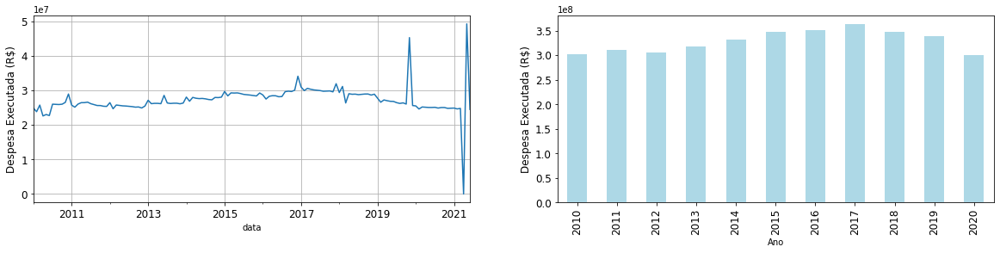

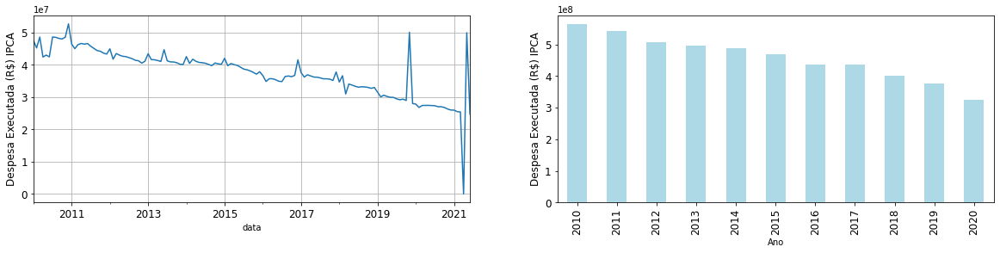

In [222]:
#subelemento = 'EXTRAS' # Alguma das coisas classificadas como EXTRA só foi utilizada em 2017 e 2018.
#subelemento = 'PESSOAL REQUISITADO' # Parece haver aumento de pessoal requisitado de outros orgãos, principalmente a partir de 2018.
#subelemento = 'GRATIFICACAO POR CARGO/FUNCAO' # Valor real das gratificações vem caindo ao longo do tempo desde 2016.
#subelemento = 'PREVIDENCIA' # Contribuições patronais e p/ INSS costumam acontecer em novembro.
#subelemento = 'DEMISSAO' # Aparentemente houve um PDV em 2017/2018 no MMA.
subelemento = 'VENCIMENTOS'

pl.figure(figsize=(20,4))
plot_expenditure(servidores_simples.loc[servidores_simples['Sub-elemento Despesa DESP'] == subelemento],  sum_y='Despesa Executada (R$)')
pl.show()

pl.figure(figsize=(20,4))
plot_expenditure(servidores_simples.loc[servidores_simples['Sub-elemento Despesa DESP'] == subelemento])
#pl.subplot(1,2,1)
#pl.axvline('2012-11-01', linewidth=1, color='r', linestyle='--')
pl.show()

In [223]:
# Casos de demissão:
servidores.loc[sample_by_valor(servidores_simples.loc[servidores_simples['Sub-elemento Despesa DESP'] == 'DEMISSAO']).index, inspect_cols]

,Ano,Mês (Número) DES,UO AC (Ajustada),Órgão Superior (UG) DESP,Órgão (UG) DESP,UG DESP,Função DESP,Subfunção (Ajustada),Ação Ajustada DESP,Programa DESP,Categoria Econômica DESP,GND DESP,Elemento Despesa DESP,Sub-elemento Despesa DESP,Despesa Executada (R$) IPCA
274452,2018,11,MINISTÉRIO DO MEIO AMBIENTE - ADMINISTRAÇÃO DI...,MINISTERIO DO MEIO AMBIENTE,MINISTERIO DO MEIO AMBIENTE,"SUBSECRET.DE PLANEJ.,ORC.E ADMINIST.¿SPOA/MMA",GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ATIVOS CIVIS DA UNIÃO,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,DESPESAS CORRENTES,PESSOAL E ENCARGOS SOCIAIS,INDENIZAÇÕES E RESTITUIÇÕES TRABALHISTAS,INDENIZACAO EM DECORRENCIA DE ADESAO AO PDV - ...,15928.620344
265431,2018,7,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - COORD. GERAL DE GESTAO DE PESSOAS,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ATIVOS CIVIS DA UNIÃO,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,DESPESAS CORRENTES,PESSOAL E ENCARGOS SOCIAIS,INDENIZAÇÕES E RESTITUIÇÕES TRABALHISTAS,INDENIZACAO EM DECORRENCIA DE ADESAO AO PDV - ...,13963.042995
274451,2018,11,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - COORD. GERAL DE GESTAO DE PESSOAS,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ATIVOS CIVIS DA UNIÃO,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,DESPESAS CORRENTES,PESSOAL E ENCARGOS SOCIAIS,INDENIZAÇÕES E RESTITUIÇÕES TRABALHISTAS,INDENIZACAO EM DECORRENCIA DE ADESAO AO PDV - ...,13798.595435
252857,2018,1,MINISTÉRIO DO MEIO AMBIENTE - ADMINISTRAÇÃO DI...,MINISTERIO DO MEIO AMBIENTE,MINISTERIO DO MEIO AMBIENTE,"SUBSECRET.DE PLANEJ.,ORC.E ADMINIST.¿SPOA/MMA",GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ATIVOS CIVIS DA UNIÃO,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,DESPESAS CORRENTES,PESSOAL E ENCARGOS SOCIAIS,INDENIZAÇÕES E RESTITUIÇÕES TRABALHISTAS,INDENIZACAO EM DECORRENCIA DE ADESAO AO PDV - ...,16452.759471
271965,2018,10,INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RE...,MINISTERIO DO MEIO AMBIENTE,INST.BRAS.DO MEIO AMB.E DOS REC.NAT.RENOVAV.,IBAMA - COORD. GERAL DE GESTAO DE PESSOAS,GESTÃO AMBIENTAL,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,ATIVOS CIVIS DA UNIÃO,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,DESPESAS CORRENTES,PESSOAL E ENCARGOS SOCIAIS,INDENIZAÇÕES E RESTITUIÇÕES TRABALHISTAS,INDENIZACAO EM DECORRENCIA DE ADESAO AO PDV - ...,13846.549772


### Evolução do orçamento para cada órgão

In [64]:
orgaos = executado_s_prev_jud['Órgão (UG) STD'].unique()

In [173]:
veto_orgaos = ['INSTITUTO DE PESQUISAS JARDIM BOTANICO DO RJ', 'AGENCIA NACIONAL DE AGUAS', 'COMPANHIA DE PESQUISA DE RECURSOS MINERAIS', 'SERVICO FLORESTAL BRASILEIRO',
               'AGENCIA NACIONAL DE VIGILANCIA SANITARIA', 'AGENCIA ESPACIAL BRASILEIRA - AEB', 'SECRETARIA DE ASSUNTOS ESTRATEGICOS', 'DEPARTAMENTO NAC.DE OBRAS CONTRA AS SECAS',
              'DEFENSORIA PUBLICA DA UNIAO', 'FUNDO DE IMPRENSA NACIONAL', 'CIA.DE DES.DOS VALES DO S.FRANC.E DO PARNAIBA', 'MINISTERIO DO DESENVOLVIMENTO REGIONAL',
              'AGENCIA NACIONAL DE TRANSPORTES TERRESTRES', 'MINISTERIO DA CIDADANIA', 'MINISTERIO PUBLICO DA UNIAO', 'ADVOCACIA-GERAL DA UNIAO']

COMPANHIA DE PESQUISA DE RECURSOS MINERAIS


,Ano,Mês (Número) DES,UO AC (Ajustada),Órgão Superior (UG) DESP,Órgão (UG) DESP,UG DESP,Função DESP,Subfunção (Ajustada),Ação Ajustada DESP,Programa DESP,Categoria Econômica DESP,GND DESP,Elemento Despesa DESP,Sub-elemento Despesa DESP,Despesa Executada (R$) IPCA
23056,2010,8,AGÊNCIA NACIONAL DE ÁGUAS - ANA,MINISTERIO DE MINAS E ENERGIA,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,GESTÃO AMBIENTAL,MEIO AMBIENTE - RECURSOS HÍDRICOS,OPERAÇÃO DA REDE HIDROMETEOROLÓGICA,PROBACIAS - CONSERVAÇÃO DE BACIAS HIDROGRÁFICAS,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,PASSAGENS E DESPESAS COM LOCOMOCAO,LOCACAO DE MEIOS DE TRANSPORTE,135692.292922
155482,2014,6,AGÊNCIA NACIONAL DE ÁGUAS - ANA,MINISTERIO DE MINAS E ENERGIA,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,GESTÃO AMBIENTAL,MEIO AMBIENTE - RECURSOS HÍDRICOS,IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE RECURSOS...,CONSERVAÇÃO E GESTÃO DE RECURSOS HÍDRICOS,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,MATERIAL DE CONSUMO,MATERIAL P/ MANUT.DE BENS IMOVEIS/INSTALACOES,24972.515107
125491,2013,6,AGÊNCIA NACIONAL DE ÁGUAS - ANA,MINISTERIO DE MINAS E ENERGIA,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,GESTÃO AMBIENTAL,MEIO AMBIENTE - RECURSOS HÍDRICOS,IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE RECURSOS...,CONSERVAÇÃO E GESTÃO DE RECURSOS HÍDRICOS,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,INDENIZACAO PELA EXECUCAO TRABALHOS DE CAMPO,INDENIZACOES A SERVIDORES EXEC. TRAB. CAMPO,245283.647400
217886,2016,9,AGÊNCIA NACIONAL DE ÁGUAS - ANA,MINISTERIO DE MINAS E ENERGIA,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,GESTÃO AMBIENTAL,MEIO AMBIENTE - RECURSOS HÍDRICOS,IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE RECURSOS...,RECURSOS HÍDRICOS,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,HOSPEDAGENS,17452.897352
50597,2011,4,AGÊNCIA NACIONAL DE ÁGUAS - ANA,MINISTERIO DE MINAS E ENERGIA,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,GESTÃO AMBIENTAL,MEIO AMBIENTE - RECURSOS HÍDRICOS,OPERAÇÃO DA REDE HIDROMETEOROLÓGICA,PROBACIAS - CONSERVAÇÃO DE BACIAS HIDROGRÁFICAS,DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,HOSPEDAGENS,137686.415549


,n_registros,valor_realizado
UG DESP,,
COMPANHIA DE PESQUISA DE RECURSOS MINERAIS,7016,2.606952e+08


,n_registros,valor_realizado
Ação Ajustada DESP,,
OPERAÇÃO DA REDE HIDROMETEOROLÓGICA,5098,1.935385e+08
IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE RECURSOS HÍDRICOS,1868,6.564000e+07
MONITORAMENTO DA RECUPERAÇÃO AMBIENTAL DA BACIA CARBONÍFERA DE SANTA CATARINA,34,1.059632e+06
MODERNIZAÇÃO DA REDE HIDROMETEOROLÓGICA,4,3.783698e+05
FORMULAÇÃO E APOIO À IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE RECURSOS HÍDRICOS,12,7.869725e+04


,n_registros,valor_realizado
Programa DESP,,
CONSERVAÇÃO E GESTÃO DE RECURSOS HÍDRICOS,2872,1.200989e+08
RECURSOS HÍDRICOS,2631,9.395132e+07
PROBACIAS - CONSERVAÇÃO DE BACIAS HIDROGRÁFICAS,1479,4.558531e+07
RESÍDUOS SÓLIDOS,17,5.981162e+05
QUALIDADE AMBIENTAL,16,2.837619e+05
QUALIDADE AMBIENTAL URBANA,1,1.777541e+05


,n_registros,valor_realizado
Sub-elemento Despesa DESP,,
"SERV. DE APOIO ADMIN., TECNICO E OPERACIONAL",204,5.972770e+07
INDENIZACOES A SERVIDORES EXEC. TRAB. CAMPO,135,3.702645e+07
"APOIO ADMINISTRATIVO, TECNICO E OPERACIONAL",91,3.507491e+07
HOSPEDAGENS,141,2.040214e+07
CONTRIB.PREVIDENCIARIAS-SERVICOS DE TERCEIROS,119,1.248151e+07
COMBUSTIVEIS E LUBRIFICANTES AUTOMOTIVOS,131,1.171733e+07
MATERIAL LABORATORIAL,72,8.303581e+06
LOCACAO BENS MOV. OUT.NATUREZAS E INTANGIVEIS,78,6.537012e+06
MANUTENCAO E CONSERV. DE VEICULOS,178,5.064407e+06


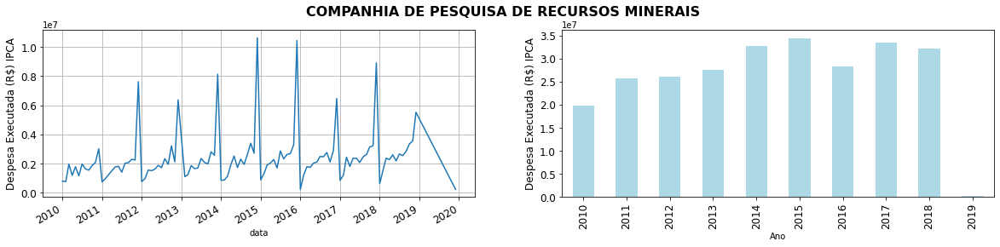

In [205]:
i = 7
orgao = orgaos[i]
print(orgao)
sel_orgao = executado_s_prev_jud.loc[executado_s_prev_jud['Órgão (UG) STD'].isin([orgao])]
display(sample_by_valor(sel_orgao, n_samples=5)[inspect_cols])
display(count_by_category(sel_orgao, 'UG DESP').head(10))
display(count_by_category(sel_orgao, 'Ação Ajustada DESP').head(10))
display(count_by_category(sel_orgao, 'Programa DESP').head(10))
display(count_by_category(sel_orgao, 'Sub-elemento Despesa DESP').head(10))
pl.figure(figsize=(20,4))
plot_expenditure(executado_s_prev_jud.loc[executado_s_prev_jud['Órgão (UG) DESP'] == orgaos[i]], title=orgaos[i])
pl.show()

SERVICO FLORESTAL BRASILEIRO


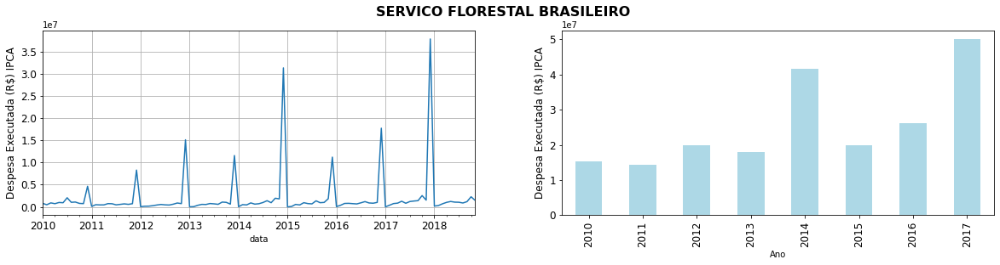

In [60]:
i = 6
pl.figure(figsize=(20,4))
print(orgaos[i])
plot_expenditure(executado_s_prev_jud.loc[executado_s_prev_jud['Órgão (UG) DESP'] == orgaos[i]], title=orgaos[i])
pl.show()

COMPANHIA DE PESQUISA DE RECURSOS MINERAIS


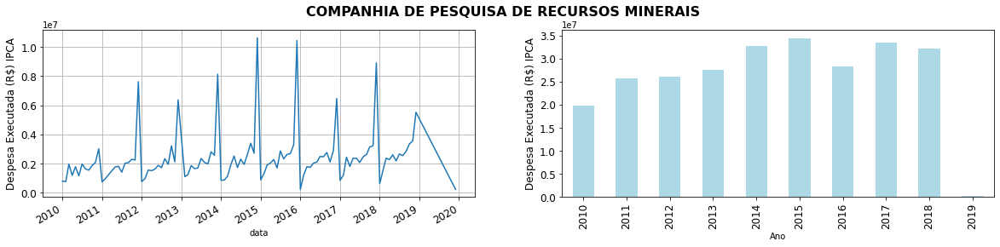

In [53]:
i = 5
pl.figure(figsize=(20,4))
print(orgaos[i])
plot_expenditure(executado_s_prev_jud.loc[executado_s_prev_jud['Órgão (UG) DESP'] == orgaos[i]], title=orgaos[i])
pl.show()

AGENCIA NACIONAL DE AGUAS


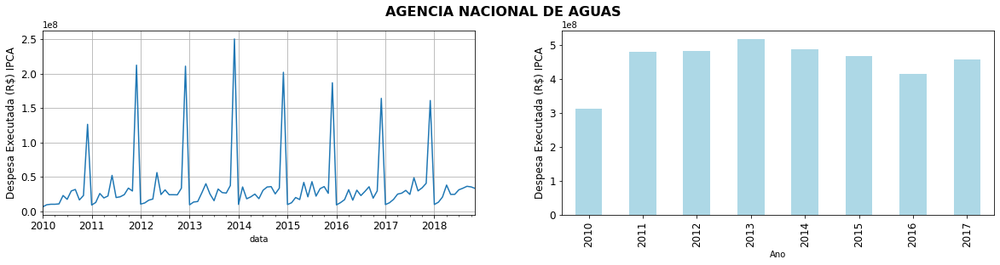

In [52]:
i = 3
pl.figure(figsize=(20,4))
print(orgaos[i])
plot_expenditure(executado_s_prev_jud.loc[executado_s_prev_jud['Órgão (UG) DESP'] == orgaos[i]], title=orgaos[i])
pl.show()

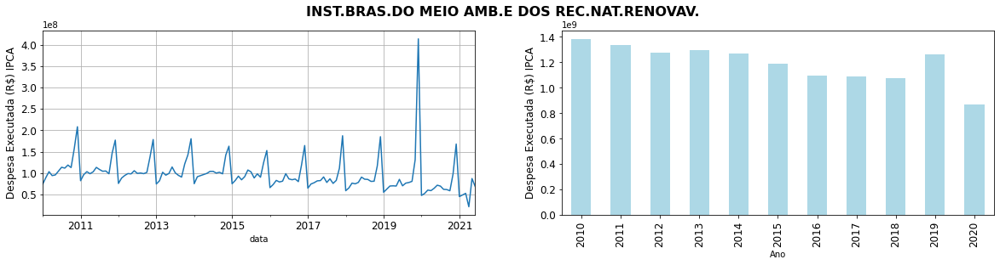

In [43]:
i = 0
pl.figure(figsize=(20,4))
plot_expenditure(executado_s_prev_jud.loc[executado_s_prev_jud['Órgão (UG) DESP'] == orgaos[i]], title=orgaos[i])
pl.show()

### Picos em dezembro

Aparentemente os picos no final do ano correspondem a custos de manutenção da infraestrutura: aluguéis, água e luz

In [235]:
dezembro = siga.loc[siga['Mês (Número) DES'] == 12]

In [280]:
sel = executado_s_prev_jud.loc[executado_s_prev_jud['Órgão Superior (UG) DESP'] == 'MINISTERIO DO MEIO AMBIENTE']
sel = sel.loc[~sel['GND DESP'].isin(['PESSOAL E ENCARGOS SOCIAIS']) & sel['Função DESP'].isin(['GESTÃO AMBIENTAL'])]
sel = sel.loc[sel['Subfunção (Ajustada)'].isin(['ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL', 'MEIO AMBIENTE - PRESERVAÇÃO E CONSERVAÇÃO AMBIENTAL', 
                                                'MEIO AMBIENTE - RECURSOS HÍDRICOS', 'ADMINISTRAÇÃO - NORMATIZAÇÃO E FISCALIZAÇÃO'])]
sel = sel.loc[sel['Elemento Despesa DESP'].isin(['OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA',
       'LOCACAO DE MAO-DE-OBRA', 'CONTRIBUICOES',
       'EQUIPAMENTOS E MATERIAL PERMANENTE',
       'PASSAGENS E DESPESAS COM LOCOMOCAO', 'AQUISICAO DE IMOVEIS',
       'CONTRIBUICOES - FUNDO A FUNDO', 'SERVICOS DE CONSULTORIA',
       'OBRAS E INSTALACOES',
       'SERVICOS DE TECNOLOGIA DA INFORMACAO E COMUNICACAO - PJ',
       'MATERIAL DE CONSUMO', 'OUTROS AUXÍLIOS FINANCEIROS A PESSOAS FÍSICAS',
       'DESPESAS DE EXERCICIOS ANTERIORES'])]
sel = sel.loc[sel['Elemento Despesa DESP'].isin(['OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA'])]

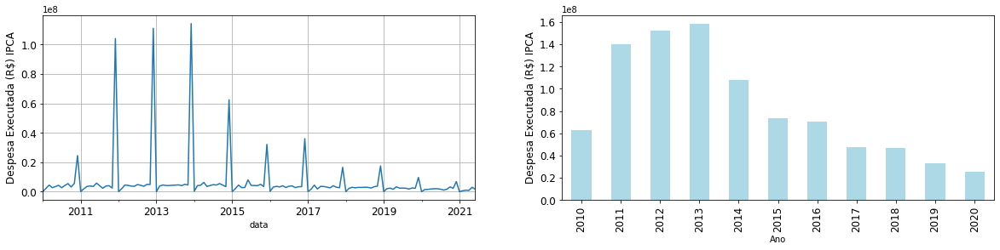

In [296]:
pl.figure(figsize=(20,4))
plot_expenditure(siga.loc[siga['Sub-elemento Despesa DESP'].isin(['MANUTENCAO E CONSERV. DE BENS IMOVEIS', 'SERVICOS DE AGUA E ESGOTO', 'LOCACAO DE IMOVEIS'])])
pl.show()

In [285]:
count_by_category(sel.loc[sel['Mês (Número) DES'] == 12], 'Sub-elemento Despesa DESP').head(20)

,n_registros,valor_realizado
Sub-elemento Despesa DESP,,
SERVICOS DE AGUA E ESGOTO,537,3.753007e+08
"SERV. DE APOIO ADMIN., TECNICO E OPERACIONAL",506,1.817333e+08
INSTITUICOES DE CARATER AMBIENTAL,48,1.375532e+08
"SERVICOS DE AUDIO, VIDEO E FOTO",124,1.313132e+08
SERVICOS TECNICOS PROFISSIONAIS,227,1.234114e+08
MANUTENCAO E CONSERV. DE BENS IMOVEIS,432,7.790473e+07
SERVICOS TECNICOS PROFISSIONAIS DE T.I.,109,7.607052e+07
LOCACAO DE IMOVEIS,198,5.768782e+07
PNUD - PROGRAMA DAS NACOES UNIDAS P/ O DESENV,52,4.394190e+07


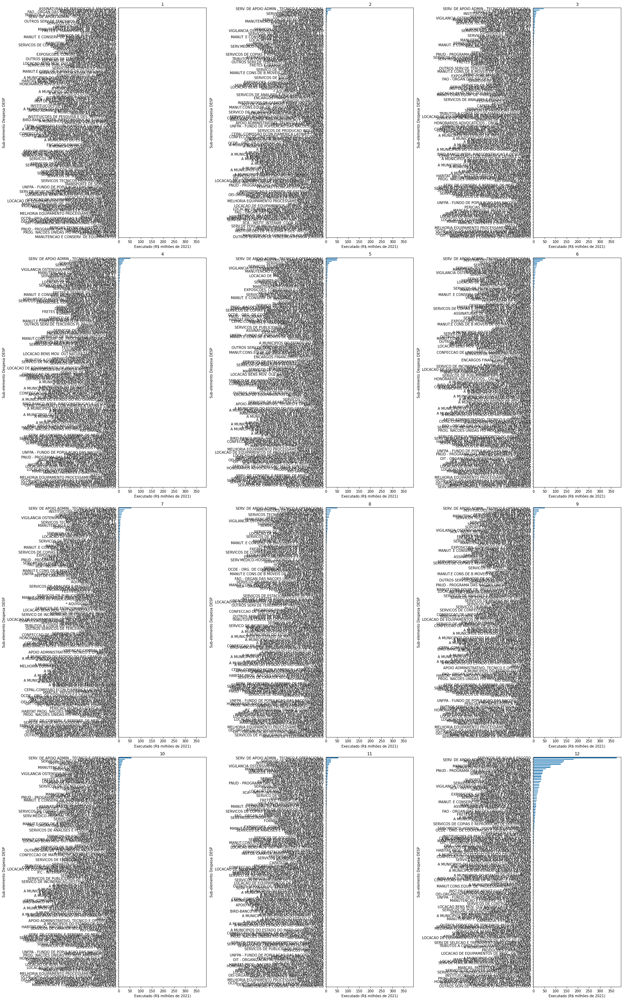

In [282]:
#col = 'Ação Ajustada DESP'
#col = 'Programa DESP'
#col = 'Função DESP'
col = 'Sub-elemento Despesa DESP'
#col = 'Subfunção (Ajustada)'
#col = 'Categoria Econômica DESP'
#col = 'GND DESP' # Outras despesas correntes, Investimentos.
#col = 'Modalidade Aplicação DESP'
#col = 'Elemento Despesa DESP'
#col = 'Órgão (UG) DESP'

by_ano_col  = sel.groupby(['Mês (Número) DES', col])['Despesa Executada (R$) IPCA'].sum().reset_index()
by_ano_col  = by_ano_col.pivot(index='Mês (Número) DES', columns=col, values='Despesa Executada (R$) IPCA').fillna(0)
max_val_col = by_ano_col.max().max()

pl.figure(figsize=(25, 40))
for i, ano in enumerate(range(1, 13)):
    
    pl.subplot(4, 3, i + 1)
    (by_ano_col.transpose()[ano].sort_values() / 1e6).plot(kind='barh')
    pl.title(ano)
    pl.xlim([0, max_val_col * 1.05 / 1e6])
    pl.xlabel('Executado (R$ milhões de 2021)')
pl.tight_layout()
pl.show()

### Pico em 2017

Detalhamento das despesas com sentenças judiciais:

In [221]:
judiciais = siga.loc[siga['Elemento Despesa DESP'] == 'SENTENCAS JUDICIAIS']

In [229]:
i = 2
count_by_category(judiciais, judiciais.columns[i])

,n_registros,valor_realizado
Ação Ajustada DESP,,
SENTENÇAS JUDICIAIS TRANSITADAS EM JULGADO (PRECATÓRIOS),878,1.426224e+09
APOSENTADORIAS E PENSÕES - SERVIDORES CIVIS,600,5.334894e+07
APOSENTADORIAS E PENSÕES CIVIS DA UNIÃO,292,2.608856e+07
"CONTRIBUIÇÃO DA UNIÃO, DE SUAS AUTARQUIAS E FUNDAÇÕES PARA O CUSTEIO DO REGIME DE PREVIDÊNCIA DOS SERVIDORES PÚBLICOS FEDERAIS DECORRENTE DO PAGAMENTO DE PRECATÓRIOS E REQUISIÇÕES DE PEQUENO VALOR",170,1.862419e+07
ADMINISTRAÇÃO DA UNIDADE,385,1.407955e+07
PESSOAL ATIVO DA UNIÃO,469,4.343965e+06
ATIVOS CIVIS DA UNIÃO,207,2.289339e+06
"APOIO À CRIAÇÃO, GESTÃO E IMPLEMENTAÇÃO DAS UNIDADES DE CONSERVAÇÃO FEDERAIS",50,4.411958e+05
FUNCIONAMENTO DO SERVIÇO FLORESTAL BRASILEIRO,47,5.966374e+04


<ipython-input-219-65c37f9c24e9>:15: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  pl.tight_layout()


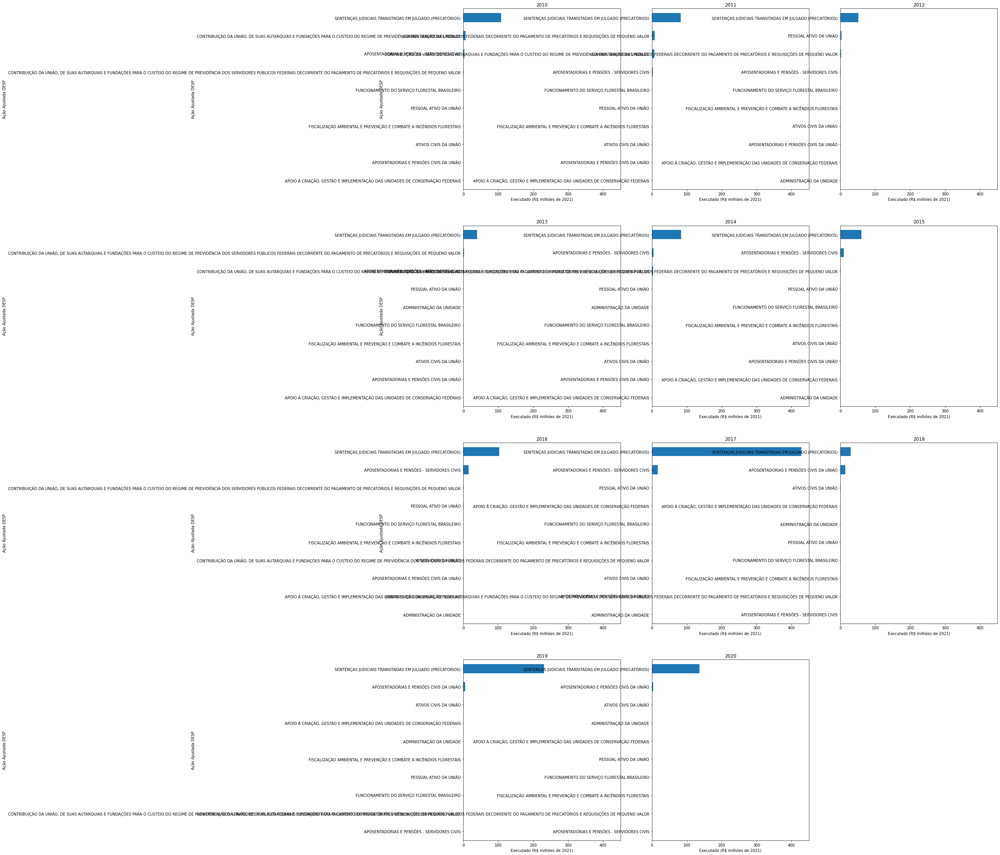

In [219]:
col = 'Ação Ajustada DESP'
#col = 'Programa DESP'
by_ano_col  = judiciais.groupby(['Ano', col])['Despesa Executada (R$) IPCA'].sum().reset_index()
by_ano_col  = by_ano_col.pivot(index='Ano', columns=col, values='Despesa Executada (R$) IPCA').fillna(0)
max_val_col = by_ano_col.max().max()

pl.figure(figsize=(25, 40))
for i, ano in enumerate(range(2010, 2021)):
    
    pl.subplot(4, 3, i + 1)
    (by_ano_col.transpose()[ano].sort_values() / 1e6).plot(kind='barh')
    pl.title(ano)
    pl.xlim([0, max_val_col * 1.05 / 1e6])
    pl.xlabel('Executado (R$ milhões de 2021)')
pl.tight_layout()
pl.show()

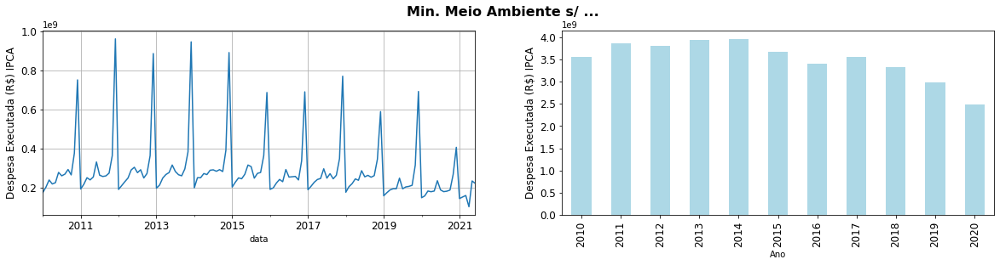

In [223]:
sel = siga.loc[siga['Ação Ajustada DESP'] != 'SENTENÇAS JUDICIAIS TRANSITADAS EM JULGADO (PRECATÓRIOS)']
pl.figure(figsize=(20,4))
plot_expenditure(sel, title='Min. Meio Ambiente s/ ...')
pl.show()

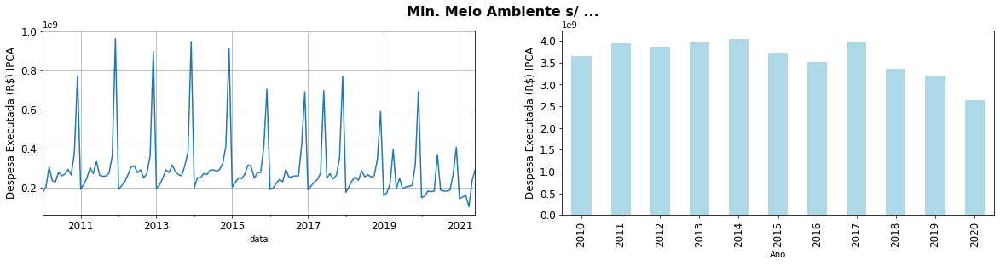

In [224]:
pl.figure(figsize=(20,4))
plot_expenditure(siga, title='Min. Meio Ambiente s/ ...')
pl.show()

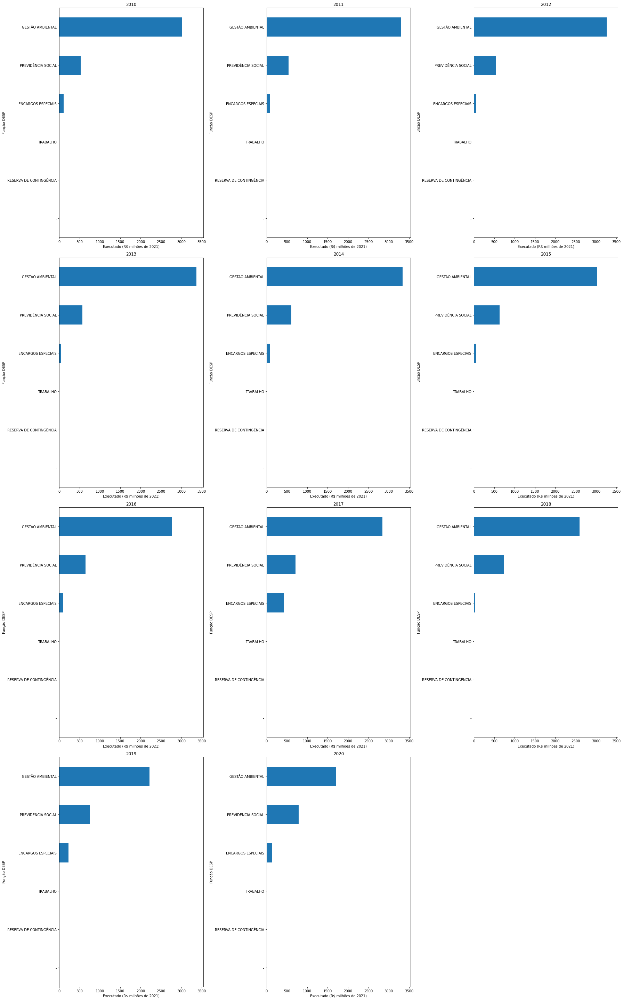

In [201]:
col = 'Função DESP' # Encargos especiais
#col = 'Subfunção (Ajustada)' # Outros encargos especiais
#col = 'Categoria Econômica DESP' # Despesas de capital
#col = 'GND DESP' # Inversões financeiras + Investimentos
#col = 'Elemento Despesa DESP' # Sentença judicial
by_ano_col  = siga.groupby(['Ano', col])['Despesa Executada (R$) IPCA'].sum().reset_index()
by_ano_col  = by_ano_col.pivot(index='Ano', columns=col, values='Despesa Executada (R$) IPCA').fillna(0)
max_val_col = by_ano_col.max().max()

pl.figure(figsize=(25, 40))
for i, ano in enumerate(range(2010, 2021)):
    
    pl.subplot(4, 3, i + 1)
    (by_ano_col.transpose()[ano].sort_values() / 1e6).plot(kind='barh')
    pl.title(ano)
    pl.xlim([0, max_val_col * 1.05 / 1e6])
    pl.xlabel('Executado (R$ milhões de 2021)')
pl.tight_layout()
pl.show()

### Gastos do órgão UG MMA

In [51]:
mma_direto = siga.loc[siga['Órgão (UG) DESP'] == 'MINISTERIO DO MEIO AMBIENTE']

In [72]:
i = 17
count_by_category(mma_direto, mma_direto.columns[i]).head(50)

,n_registros,valor_realizado
Órgão Superior (UO AC) DESP,,
MINISTÉRIO DO MEIO AMBIENTE,41686,4.483189e+09


### Valores zerados

Nossa seleção de dados foi feita tal que o mês que aparece nos dados é o **mês de execução**. Logo, para aparecer empenho associado a uma certa ação nesse mês, ele precisa ter sido feito no mesmo mês de execução, o que não é muito comum. O mesmo acontece para a Dotação Inicial e o valor Autorizado.

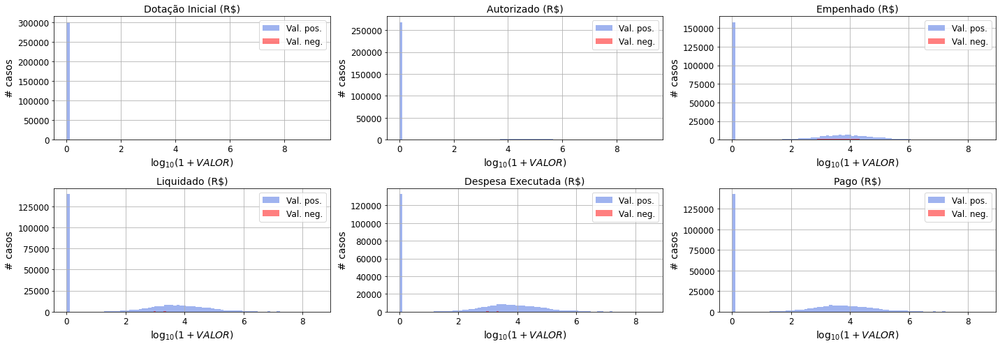

In [36]:
# Valores para todos os casos:
pl.figure(figsize=(20,7))
plot_fases_despesa_dist(siga)
pl.show()

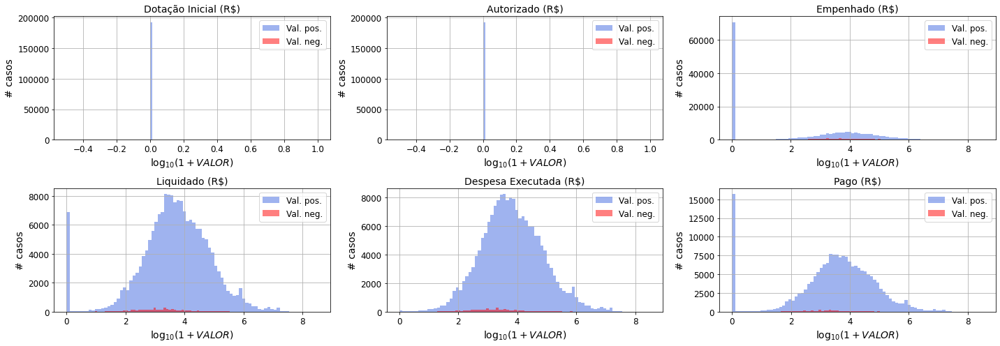

In [34]:
# Valores para o caso no qual o executado não é nulo.
pl.figure(figsize=(20,7))
plot_fases_despesa_dist(executado)
pl.show()

In [43]:
# Existem linhas que não contém nenhum valor. Por que isso acontece?
siga.loc[(siga[value_cols] == 0).all(axis=1), value_cols]

,Dotação Inicial (R$),Autorizado (R$),Empenhado (R$),Liquidado (R$),Despesa Executada (R$),Pago (R$),Pago + RP Pago (R$),RP Pago (R$),Contingenciamento (R$),Passível de Contingenciamento (R$),Veto (R$)
110,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0
207,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0
222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0
261,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0
740,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...
324370,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0
324579,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0
324823,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0
325051,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0


### Gerais 2

In [22]:
i = 2
count_by_category(siga_s_prev, siga.columns[i]).iloc[50:100]

,n_registros,valor_realizado
Ação Ajustada DESP,,
"ELABORAÇÃO E IMPLEMENTAÇÃO DE PLANOS, PROJETOS, OBRAS E EQUIPAMENTOS PARA A COLETA SELETIVA DE RESÍDUOS SÓLIDOS URBANOS",169,3.698121e+07
DESENVOLVIMENTO INSTITUCIONAL PARA A GESTÃO INTEGRADA DE RESÍDUOS SÓLIDOS,313,3.648445e+07
APLICAÇÃO DOS RECURSOS DA COBRANÇA PELO USO DE RECURSOS HÍDRICOS NA BACIA HIDROGRÁFICA DO RIO SÃO FRANCISCO,16,3.529466e+07
PROTEÇÃO E AMPLIAÇÃO DE COLEÇÕES VIVAS EM JARDINS BOTÂNICOS,1230,3.348696e+07
IMPLANTAÇÃO DO SISTEMA NACIONAL DE INFORMAÇÕES SOBRE RECURSOS HÍDRICOS,258,3.328744e+07
FISCALIZAÇÃO AMBIENTAL DAS ATIVIDADES DO SETOR PESQUEIRO,1520,3.207227e+07
"CONTROLE, MONITORAMENTO, TRIAGEM, RECUPERAÇÃO E DESTINAÇÃO DE ANIMAIS SILVESTRES",4198,3.109532e+07
APOIO À IMPLEMENTAÇÃO DE INSTRUMENTOS ESTRUTURANTES DA POLITICA NACIONAL DE RESÍDUOS SÓLIDOS,301,3.086477e+07
"APLICAÇÃO DOS RECURSOS DA COBRANÇA PELO USO DE RECURSOS HÍDRICOS NA BACIA HIDROGRÁFICA DOS RIOS PIRACICABA, CAPIVARI E JUNDIAÍ",14,2.913560e+07


In [85]:
print_array_series(check_guarda_compartilhada(siga, 'Função DESP', 'Subfunção (Ajustada)', drop_unique=False))

-: -
ENCARGOS ESPECIAIS: ENCARGOS ESPECIAIS - SERVIÇO DA DÍVIDA EXTERNA / ENCARGOS ESPECIAIS - OUTROS ENCARGOS ESPECIAIS
GESTÃO AMBIENTAL: ADMINISTRAÇÃO - TECNOLOGIA DA INFORMAÇÃO / ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL / MEIO AMBIENTE - CONTROLE AMBIENTAL / MEIO AMBIENTE - PRESERVAÇÃO E CONSERVAÇÃO AMBIENTAL / MEIO AMBIENTE - RECURSOS HÍDRICOS / SAÚDE - ATENÇÃO BÁSICA / EDUCAÇÃO - EDUCAÇÃO INFANTIL / AGRICULTURA - PROMOÇÃO DA PRODUÇÃO AGROPECUÁRIA / SAÚDE - ALIMENTAÇÃO E NUTRIÇÃO / TRABALHO - PROTEÇÃO E BENEFÍCIOS AO TRABALHADOR / ADMINSTRAÇÃO - ORDENAMENTO TERRITORIAL / ADMINISTRAÇÃO - FORMAÇÃO DE RECURSOS HUMANOS / CIÊNCIA E TECNOLOGIA - DIFUSÃO DO CONHECIMENTO CIENTÍFICO / CIÊNCIA E TECNOLOGIA - DESENVOLVIMENTO TECNOLÓGICO E ENGENHARIA / ADMINISTRAÇÃO - PLANEJAMENTO E ORÇAMENTO / ADMINISTRAÇÃO - NORMATIZAÇÃO E FISCALIZAÇÃO / SANEAMENTO - SANEAMENTO BÁSICO URBANO / MEIO AMBIENTE - RECUPERAÇÃO DE ÁREAS DEGRADADAS / CULTURA - PATRIMÔNIO HISTÓRICO, ARTÍSTICO E ARQUEOLÓGICO / CIÊNCIA E TE

In [36]:
print_array_series(check_guarda_compartilhada(siga, 'Subfunção (Ajustada)', 'Função DESP'))

ENCARGOS ESPECIAIS - OUTROS ENCARGOS ESPECIAIS: ENCARGOS ESPECIAIS / GESTÃO AMBIENTAL
TRABALHO - EMPREGABILIDADE: TRABALHO / GESTÃO AMBIENTAL


In [42]:
print_array_series(check_guarda_compartilhada(siga, 'Ação Ajustada DESP', 'Subfunção (Ajustada)'))

ASSISTÊNCIA PRÉ-ESCOLAR AOS DEPENDENTES DOS SERVIDORES CIVIS, EMPREGADOS E MILITARES: EDUCAÇÃO - EDUCAÇÃO INFANTIL / TRABALHO - PROTEÇÃO E BENEFÍCIOS AO TRABALHADOR
AUXÍLIO-ALIMENTAÇÃO AOS SERVIDORES CIVIS, EMPREGADOS E MILITARES: SAÚDE - ALIMENTAÇÃO E NUTRIÇÃO / TRABALHO - PROTEÇÃO E BENEFÍCIOS AO TRABALHADOR
BENEFÍCIOS E PENSÕES INDENIZATÓRIAS DECORRENTES DE LEGISLAÇÃO ESPECIAL E/OU DECISÕES JUDICIAIS: PREVIDÊNCIA SOCIAL - PREVIDÊNCIA ESPECIAL / ENCARGOS ESPECIAIS - OUTROS ENCARGOS ESPECIAIS
BENEFÍCIOS OBRIGATÓRIOS AOS SERVIDORES CIVIS, EMPREGADOS, MILITARES E SEUS DEPENDENTES: TRABALHO - PROTEÇÃO E BENEFÍCIOS AO TRABALHADOR / SAÚDE - ATENÇÃO BÁSICA
CADASTRO NACIONAL DE USUÁRIOS DE RECURSOS HÍDRICOS: ADMINISTRAÇÃO - TECNOLOGIA DA INFORMAÇÃO / MEIO AMBIENTE - RECURSOS HÍDRICOS
CONTRIBUIÇÃO DA UNIÃO, DE SUAS AUTARQUIAS E FUNDAÇÕES PARA O CUSTEIO DO REGIME DE PREVIDÊNCIA DOS SERVIDORES PÚBLICOS FEDERAIS: ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL / ENCARGOS ESPECIAIS - OUTROS ENCARGOS ESPECIAI

In [61]:
#print_array_series(check_guarda_compartilhada(siga, 'Função DESP', 'Ação Ajustada DESP'))

In [40]:
i = 4
count_by_category(siga, siga.columns[i]).head(50)

,n_registros,valor_realizado
Função DESP,,
GESTÃO AMBIENTAL,317397,3.209119e+10
PREVIDÊNCIA SOCIAL,6036,7.426800e+09
ENCARGOS ESPECIAIS,1610,1.451453e+09
TRABALHO,29,1.523891e+05
-,41,0.000000e+00
RESERVA DE CONTINGÊNCIA,63,0.000000e+00


In [67]:
i = 7
count_by_category(siga, siga.columns[i])

,n_registros,valor_realizado
GND DESP,,
PESSOAL E ENCARGOS SOCIAIS,24316,2.381881e+10
OUTRAS DESPESAS CORRENTES,283160,1.461287e+10
INVESTIMENTOS,17059,1.382929e+09
INVERSOES FINANCEIRAS,445,1.149144e+09
AMORTIZACAO DA DIVIDA,33,3.493065e+06
JUROS E ENCARGOS DA DIVIDA,97,2.342230e+06
RESERVA DE CONTINGENCIA,66,0.000000e+00


In [74]:
i = 13
count_by_category(siga, siga.columns[i]).head(50)

,n_registros,valor_realizado
UG DESP,,
IBAMA - COORDENACAO-GERAL DE FINANCAS - CGFIN,17138,1.294343e+10
INSTITUTO CHICO MENDES - SEDE,28414,7.505959e+09
IBAMA - COORD. GERAL DE GESTAO DE PESSOAS,3357,5.375178e+09
AGENCIA NACIONAL DE AGUAS - GEEFI/SAF/ANA,8044,2.207245e+09
AGENCIA NACIONAL DE AGUAS - COGEF/SAF/ANA,5990,1.663724e+09
"SUBSECRET.DE PLANEJ.,ORC.E ADMINIST. SPOA/MMA",9180,1.183024e+09
TRIBUNAL REGIONAL FEDERAL DA 1A.REG.-PREC.RPV,197,1.079906e+09
INST. DE PESQUISAS JARDIM BOTANICO DO RJ/JBRJ,13711,9.749953e+08
"SUBSECRET.DE PLANEJ.,ORC.E ADMINIST.?SPOA/MMA",5286,8.550798e+08


In [66]:
mma_direta = siga.loc[siga['UO AC (Ajustada)'] == 'MINISTÉRIO DO MEIO AMBIENTE - ADMINISTRAÇÃO DIRETA']

In [79]:
i = 4
count_by_category(siga, siga.columns[i])

,n_registros,valor_realizado
Função DESP,,
GESTÃO AMBIENTAL,317397,3.209119e+10
PREVIDÊNCIA SOCIAL,6036,7.426800e+09
ENCARGOS ESPECIAIS,1610,1.451453e+09
TRABALHO,29,1.523891e+05
-,41,0.000000e+00
RESERVA DE CONTINGÊNCIA,63,0.000000e+00


In [69]:
i = 7
count_by_category(mma_direta, mma_direta.columns[i])

,n_registros,valor_realizado
GND DESP,,
OUTRAS DESPESAS CORRENTES,33161,2.256394e+09
PESSOAL E ENCARGOS SOCIAIS,3745,1.502059e+09
INVESTIMENTOS,2519,4.549393e+08
AMORTIZACAO DA DIVIDA,33,3.493065e+06
JUROS E ENCARGOS DA DIVIDA,61,1.994909e+06
INVERSOES FINANCEIRAS,3,0.000000e+00
RESERVA DE CONTINGENCIA,15,0.000000e+00


### Dados de superintendências do IBAMA

In [67]:
superint_ibama = list(filter(lambda s: s.find('SUPERINTENDENCIA') != -1, siga['UG DESP'].unique()))
siga_superint = siga.loc[siga['UG DESP'].isin(superint_ibama)]

In [68]:
siga_superint

,Mês (Número) DES,Ano,UF DESP,Ação Ajustada DESP,Localidade DESP,Subfunção (Cod) (Ajustado),Subfunção (Ajustada),Função (Cod) DESP,Função DESP,Programa DESP,...,Autorizado (R$),Empenhado (R$),Liquidado (R$),Despesa Executada (R$),Pago (R$),Pago + RP Pago (R$),RP Pago (R$),Contingenciamento (R$),Passível de Contingenciamento (R$),Veto (R$)
2107,1,2019,NaN,ADMINISTRAÇÃO DA UNIDADE,NACIONAL,122,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,18,GESTÃO AMBIENTAL,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,...,0.0,0.00,0.00,0.00,0.00,7545.58,7545.58,0,0.0,0
2111,1,2019,NaN,ADMINISTRAÇÃO DA UNIDADE,NACIONAL,122,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,18,GESTÃO AMBIENTAL,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,...,0.0,443.84,443.84,443.84,443.84,443.84,0.00,0,0.0,0
2112,1,2019,NaN,ADMINISTRAÇÃO DA UNIDADE,NACIONAL,122,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,18,GESTÃO AMBIENTAL,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,...,0.0,2202.25,2202.25,2202.25,2202.25,2202.25,0.00,0,0.0,0
2113,1,2019,NaN,ADMINISTRAÇÃO DA UNIDADE,NACIONAL,122,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,18,GESTÃO AMBIENTAL,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,...,0.0,5433.80,5402.55,5402.55,5402.55,5402.55,0.00,0,0.0,0
2114,1,2019,NaN,ADMINISTRAÇÃO DA UNIDADE,NACIONAL,122,ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,18,GESTÃO AMBIENTAL,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,...,0.0,25.77,25.77,25.77,25.77,25.77,0.00,0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27365,12,2019,NaN,PREVENÇÃO E CONTROLE DE INCÊNDIOS FLORESTAIS N...,NACIONAL,542,MEIO AMBIENTE - CONTROLE AMBIENTAL,18,GESTÃO AMBIENTAL,MUDANÇA DO CLIMA,...,0.0,69700.00,0.00,69700.00,0.00,0.00,0.00,0,0.0,0
27686,12,2019,RS,GESTÃO DO USO SUSTENTÁVEL DA BIODIVERSIDADE,RIO GRANDE DO SUL (ESTADO),542,MEIO AMBIENTE - CONTROLE AMBIENTAL,18,GESTÃO AMBIENTAL,CONSERVAÇÃO E USO SUSTENTÁVEL DA BIODIVERSIDADE,...,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0.0,0
27687,12,2019,RS,GESTÃO DO USO SUSTENTÁVEL DA BIODIVERSIDADE,RIO GRANDE DO SUL (ESTADO),542,MEIO AMBIENTE - CONTROLE AMBIENTAL,18,GESTÃO AMBIENTAL,CONSERVAÇÃO E USO SUSTENTÁVEL DA BIODIVERSIDADE,...,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0.0,0
27688,12,2019,RS,GESTÃO DO USO SUSTENTÁVEL DA BIODIVERSIDADE,RIO GRANDE DO SUL (ESTADO),542,MEIO AMBIENTE - CONTROLE AMBIENTAL,18,GESTÃO AMBIENTAL,CONSERVAÇÃO E USO SUSTENTÁVEL DA BIODIVERSIDADE,...,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0.0,0


### Gerais

In [16]:
# Todas as ações estão circunscritas às subfunções:
print_array_series(check_guarda_compartilhada(siga, 'Ação Ajustada DESP', 'Subfunção (Ajustada)'))

ASSISTÊNCIA PRÉ-ESCOLAR AOS DEPENDENTES DOS SERVIDORES CIVIS, EMPREGADOS E MILITARES: EDUCAÇÃO - EDUCAÇÃO INFANTIL / TRABALHO - PROTEÇÃO E BENEFÍCIOS AO TRABALHADOR
AUXÍLIO-ALIMENTAÇÃO AOS SERVIDORES CIVIS, EMPREGADOS E MILITARES: SAÚDE - ALIMENTAÇÃO E NUTRIÇÃO / TRABALHO - PROTEÇÃO E BENEFÍCIOS AO TRABALHADOR
BENEFÍCIOS E PENSÕES INDENIZATÓRIAS DECORRENTES DE LEGISLAÇÃO ESPECIAL E/OU DECISÕES JUDICIAIS: PREVIDÊNCIA SOCIAL - PREVIDÊNCIA ESPECIAL / ENCARGOS ESPECIAIS - OUTROS ENCARGOS ESPECIAIS
BENEFÍCIOS OBRIGATÓRIOS AOS SERVIDORES CIVIS, EMPREGADOS, MILITARES E SEUS DEPENDENTES: TRABALHO - PROTEÇÃO E BENEFÍCIOS AO TRABALHADOR / SAÚDE - ATENÇÃO BÁSICA
CADASTRO NACIONAL DE USUÁRIOS DE RECURSOS HÍDRICOS: ADMINISTRAÇÃO - TECNOLOGIA DA INFORMAÇÃO / MEIO AMBIENTE - RECURSOS HÍDRICOS
CONTRIBUIÇÃO DA UNIÃO, DE SUAS AUTARQUIAS E FUNDAÇÕES PARA O CUSTEIO DO REGIME DE PREVIDÊNCIA DOS SERVIDORES PÚBLICOS FEDERAIS: ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL / ENCARGOS ESPECIAIS - OUTROS ENCARGOS ESPECIAI

In [17]:
count_by_category(siga, 'UG DESP').head(50)

,n_registros,valor_realizado
UG DESP,,
IBAMA - COORDENACAO-GERAL DE FINANCAS - CGFIN,17138,1.294343e+10
INSTITUTO CHICO MENDES - SEDE,28414,7.505959e+09
IBAMA - COORD. GERAL DE GESTAO DE PESSOAS,3357,5.375178e+09
AGENCIA NACIONAL DE AGUAS - GEEFI/SAF/ANA,8044,2.207245e+09
AGENCIA NACIONAL DE AGUAS - COGEF/SAF/ANA,5990,1.663724e+09
"SUBSECRET.DE PLANEJ.,ORC.E ADMINIST. SPOA/MMA",9180,1.183024e+09
TRIBUNAL REGIONAL FEDERAL DA 1A.REG.-PREC.RPV,197,1.079906e+09
INST. DE PESQUISAS JARDIM BOTANICO DO RJ/JBRJ,13711,9.749953e+08
"SUBSECRET.DE PLANEJ.,ORC.E ADMINIST.?SPOA/MMA",5286,8.550798e+08


In [18]:
siga.columns

Index(['Mês (Número) DES', 'Ano', 'Ação Ajustada DESP', 'Subfunção (Ajustada)',
       'Função DESP', 'Programa DESP', 'Categoria Econômica DESP', 'GND DESP',
       'Modalidade Aplicação DESP', 'Elemento Despesa DESP',
       'Sub-elemento Despesa DESP', 'Órgão (UG) DESP',
       'Órgão Superior (UG) DESP', 'UG DESP', 'Autor (Tipo)',
       'Origem da Despesa', 'UO AC (Ajustada)', 'Órgão Superior (UO AC) DESP',
       'Dotação Inicial (R$)', 'Autorizado (R$)', 'Empenhado (R$)',
       'Liquidado (R$)', 'Despesa Executada (R$)', 'Pago (R$)',
       'Pago + RP Pago (R$)', 'RP Pago (R$)', 'Contingenciamento (R$)',
       'Passível de Contingenciamento (R$)', 'Veto (R$)', 'data', 'ipca',
       'Dotação Inicial (R$) IPCA', 'Autorizado (R$) IPCA',
       'Empenhado (R$) IPCA', 'Liquidado (R$) IPCA',
       'Despesa Executada (R$) IPCA', 'Pago (R$) IPCA',
       'Pago + RP Pago (R$) IPCA', 'RP Pago (R$) IPCA',
       'Contingenciamento (R$) IPCA',
       'Passível de Contingenciamento (R$) 

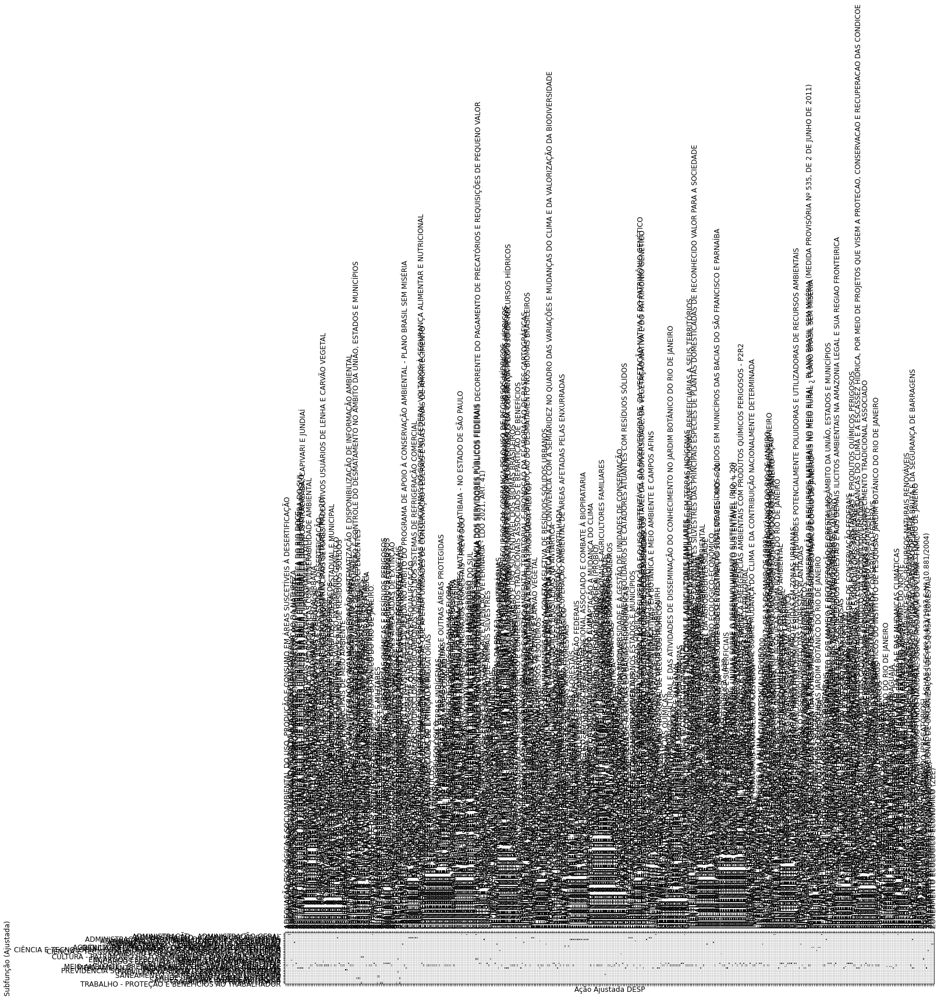

In [101]:
pl.figure(figsize=(20,20))
matrix_plot(siga, 'Liquidado (R$)', 'Ação Ajustada DESP', 'Subfunção (Ajustada)', grid=True)

In [19]:
i = 6
col = siga.columns[i]
count_by_category(siga, col).head(50)

,n_registros,valor_realizado
Categoria Econômica DESP,,
DESPESAS CORRENTES,307573,3.843403e+10
DESPESAS DE CAPITAL,17537,2.535565e+09
RESERVA DE CONTINGENCIA,66,0.000000e+00


In [20]:
siga.columns

Index(['Mês (Número) DES', 'Ano', 'Ação Ajustada DESP', 'Subfunção (Ajustada)',
       'Função DESP', 'Programa DESP', 'Categoria Econômica DESP', 'GND DESP',
       'Modalidade Aplicação DESP', 'Elemento Despesa DESP',
       'Sub-elemento Despesa DESP', 'Órgão (UG) DESP',
       'Órgão Superior (UG) DESP', 'UG DESP', 'Autor (Tipo)',
       'Origem da Despesa', 'UO AC (Ajustada)', 'Órgão Superior (UO AC) DESP',
       'Dotação Inicial (R$)', 'Autorizado (R$)', 'Empenhado (R$)',
       'Liquidado (R$)', 'Despesa Executada (R$)', 'Pago (R$)',
       'Pago + RP Pago (R$)', 'RP Pago (R$)', 'Contingenciamento (R$)',
       'Passível de Contingenciamento (R$)', 'Veto (R$)', 'data', 'ipca',
       'Dotação Inicial (R$) IPCA', 'Autorizado (R$) IPCA',
       'Empenhado (R$) IPCA', 'Liquidado (R$) IPCA',
       'Despesa Executada (R$) IPCA', 'Pago (R$) IPCA',
       'Pago + RP Pago (R$) IPCA', 'RP Pago (R$) IPCA',
       'Contingenciamento (R$) IPCA',
       'Passível de Contingenciamento (R$) 

In [21]:
count_by_category(siga, 'GND DESP').head(50)

,n_registros,valor_realizado
GND DESP,,
PESSOAL E ENCARGOS SOCIAIS,24316,2.381881e+10
OUTRAS DESPESAS CORRENTES,283160,1.461287e+10
INVESTIMENTOS,17059,1.382929e+09
INVERSOES FINANCEIRAS,445,1.149144e+09
AMORTIZACAO DA DIVIDA,33,3.493065e+06
JUROS E ENCARGOS DA DIVIDA,97,2.342230e+06
RESERVA DE CONTINGENCIA,66,0.000000e+00


In [22]:
count_by_category(siga, 'Sub-elemento Despesa DESP').head(50)

,n_registros,valor_realizado
Sub-elemento Despesa DESP,,
VENCIMENTOS E SALARIOS,784,5.510015e+09
PROVENTOS - PESSOAL CIVIL,730,4.154118e+09
GRATIFICACAO POR EXERCICIO DE CARGO EFETIVO,560,3.462752e+09
CONTRIBUICAO PATRONAL PARA O RPPS,785,2.595209e+09
PENSOES CIVIS,522,1.289265e+09
GRATIFICACAO POR EXERCICIO DE CARGOS,216,1.224192e+09
VIGILANCIA OSTENSIVA,6509,1.168696e+09
"APOIO ADMINISTRATIVO, TECNICO E OPERACIONAL",5927,9.336743e+08
INSTITUICOES DE CARATER AMBIENTAL,753,9.276529e+08


In [48]:
i = 3
col = siga.columns[i]
count_by_category(siga, col).head(50)

,n_registros,valor_realizado
Ação Ajustada DESP,,
ATIVOS CIVIS DA UNIÃO,1183,8.450299e+08
APOSENTADORIAS E PENSÕES CIVIS DA UNIÃO,698,6.787850e+08
ADMINISTRAÇÃO DA UNIDADE,10086,2.467357e+08
SENTENÇAS JUDICIAIS TRANSITADAS EM JULGADO (PRECATÓRIOS),112,2.068697e+08
"CONTRIBUIÇÃO DA UNIÃO, DE SUAS AUTARQUIAS E FUNDAÇÕES PARA O CUSTEIO DO REGIME DE PREVIDÊNCIA DOS SERVIDORES PÚBLICOS FEDERAIS",83,1.527982e+08
"APOIO À CRIAÇÃO, GESTÃO E IMPLEMENTAÇÃO DAS UNIDADES DE CONSERVAÇÃO FEDERAIS",3123,1.365102e+08
CONTROLE E FISCALIZAÇÃO AMBIENTAL,2465,8.495435e+07
PREVENÇÃO E CONTROLE DE INCÊNDIOS FLORESTAIS NAS ÁREAS FEDERAIS PRIORITÁRIAS,919,3.671106e+07
"BENEFÍCIOS OBRIGATÓRIOS AOS SERVIDORES CIVIS, EMPREGADOS, MILITARES E SEUS DEPENDENTES",352,3.538752e+07


In [23]:
print_array_series(siga.groupby('Função DESP')['Subfunção (Ajustada)'].unique())

-: -
ENCARGOS ESPECIAIS: ENCARGOS ESPECIAIS - SERVIÇO DA DÍVIDA EXTERNA / ENCARGOS ESPECIAIS - OUTROS ENCARGOS ESPECIAIS
GESTÃO AMBIENTAL: ADMINISTRAÇÃO - TECNOLOGIA DA INFORMAÇÃO / ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL / MEIO AMBIENTE - CONTROLE AMBIENTAL / MEIO AMBIENTE - PRESERVAÇÃO E CONSERVAÇÃO AMBIENTAL / MEIO AMBIENTE - RECURSOS HÍDRICOS / SAÚDE - ATENÇÃO BÁSICA / EDUCAÇÃO - EDUCAÇÃO INFANTIL / AGRICULTURA - PROMOÇÃO DA PRODUÇÃO AGROPECUÁRIA / SAÚDE - ALIMENTAÇÃO E NUTRIÇÃO / TRABALHO - PROTEÇÃO E BENEFÍCIOS AO TRABALHADOR / ADMINSTRAÇÃO - ORDENAMENTO TERRITORIAL / ADMINISTRAÇÃO - FORMAÇÃO DE RECURSOS HUMANOS / CIÊNCIA E TECNOLOGIA - DIFUSÃO DO CONHECIMENTO CIENTÍFICO / CIÊNCIA E TECNOLOGIA - DESENVOLVIMENTO TECNOLÓGICO E ENGENHARIA / ADMINISTRAÇÃO - PLANEJAMENTO E ORÇAMENTO / ADMINISTRAÇÃO - NORMATIZAÇÃO E FISCALIZAÇÃO / SANEAMENTO - SANEAMENTO BÁSICO URBANO / MEIO AMBIENTE - RECUPERAÇÃO DE ÁREAS DEGRADADAS / CULTURA - PATRIMÔNIO HISTÓRICO, ARTÍSTICO E ARQUEOLÓGICO / CIÊNCIA E TE

### Valores negativos

In [73]:
# Verificando valores negativos:
for col in value_cols:
    n_tot = len(siga[col])
    n_neg = (siga[col] < 0).sum()
    print('{}: {} de {} são negativos ({:.1f}%)'.format(col, n_neg, n_tot, n_neg / n_tot * 100))

Dotação Inicial (R$): 6884 de 325176 são negativos (2.1%)
Autorizado (R$): 17091 de 325176 são negativos (5.3%)
Empenhado (R$): 24899 de 325176 são negativos (7.7%)
Liquidado (R$): 4504 de 325176 são negativos (1.4%)
Despesa Executada (R$): 4398 de 325176 são negativos (1.4%)
Pago (R$): 3988 de 325176 são negativos (1.2%)
Pago + RP Pago (R$): 4090 de 325176 são negativos (1.3%)
RP Pago (R$): 133 de 325176 são negativos (0.0%)
Contingenciamento (R$): 246 de 325176 são negativos (0.1%)
Passível de Contingenciamento (R$): 6671 de 325176 são negativos (2.1%)
Veto (R$): 0 de 325176 são negativos (0.0%)


### Unidades gestoras externas ao MMA

Aparentemente isso acontece quando o MMA usa serviços de outros órgãos governamentais, e paga por isso.

#### Executados pela Justiça Federal

A grande parte da verba do MMA destinado à Justiça foi para pagamento de precatórios.

Outra coisa potencialmente importante: aparentemente houve uma aprovação de lei em 2017 que determinou o pagamento de indenizações via precatórios, e não mais com títulos da dívida agrária:
<https://www1.folha.uol.com.br/poder/2020/09/bolsonaro-incrementa-verba-para-ruralistas-e-reduz-quase-a-zero-a-reforma-agraria.shtml>

In [127]:
justica = siga.loc[siga['Órgão Superior (UG) DESP'] == 'JUSTICA FEDERAL']

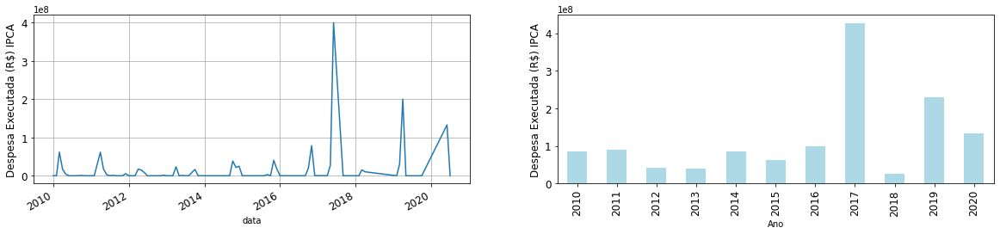

In [152]:
pl.figure(figsize=(20,4))
plot_expenditure(justica)
pl.show()

In [131]:
i = 2
count_by_category(justica, justica.columns[i])

,n_registros,valor_realizado
Ação Ajustada DESP,,
SENTENÇAS JUDICIAIS TRANSITADAS EM JULGADO (PRECATÓRIOS),526,1.372791e+09
"CONTRIBUIÇÃO DA UNIÃO, DE SUAS AUTARQUIAS E FUNDAÇÕES PARA O CUSTEIO DO REGIME DE PREVIDÊNCIA DOS SERVIDORES PÚBLICOS FEDERAIS DECORRENTE DO PAGAMENTO DE PRECATÓRIOS E REQUISIÇÕES DE PEQUENO VALOR",134,1.862419e+07


In [150]:
i = 10
count_by_category(justica, justica.columns[i])

,n_registros,valor_realizado
Sub-elemento Despesa DESP,,
PRECATORIOS INCLUIDOS NA LEI DO ORCAMENTO,150,8.876216e+08
PRECATORIOS ADMINISTRACAO INDIRETA (AUT/FUND),43,1.396850e+08
PRECATORIOS - ATIVO CIVIL,80,1.229198e+08
PRECATORIOS - INATIVO CIVIL,59,8.533855e+07
SENTENCAS JUDICIAIS TRANSITADAS EM JULGADO,52,7.655406e+07
HONORARIOS SUCUMBENCIAIS DE PRECATORIOS,63,3.810439e+07
PRECATORIOS - PENSIONISTA CIVIL,45,1.922321e+07
SENTENCAS JUDICIAIS DA CONTRIBUICAO PATRONAL,50,1.113651e+07
OBRIGACOES PATRONAIS DE PRECATORIOS,81,7.487679e+06


In [141]:
i = 13
count_by_category(justica, justica.columns[i])

,n_registros,valor_realizado
UG DESP,,
TRIBUNAL REGIONAL FEDERAL DA 1A.REG.-PREC.RPV,197,1.079906e+09
TRIBUNAL REGIONAL FEDERAL 4ª REGIAO-PREC/RPVS,86,6.139046e+07
TRIBUNAL REGIONAL FEDERAL 5A REGIAO-PREC/RPV,80,5.666762e+07
SECRETARIA DO T.R.F. DA 1A. REGIAO,14,5.421820e+07
TRIBUNAL REGIONAL FEDERAL 4? REGIAO-PREC/RPVS,38,4.946753e+07
TRIBUNAL REGIONAL FEDERAL DA 2A. REG.-PR. RPV,107,3.155796e+07
TRIBUNAL REGIONAL FEDERAL 5A REGIÃO-PREC/RPV,26,3.106024e+07
TRIBUNAL REGIONAL FEDERAL DA 5A.REGIAO,59,1.801273e+07
TRIBUNAL REGIONAL FEDERAL DA 3A.REGIAO-PR.RPV,35,4.878687e+06


In [144]:
i = 16
count_by_category(justica, justica.columns[i])

,n_registros,valor_realizado
UO AC (Ajustada),,
INSTITUTO CHICO MENDES DE CONSERVAÇÃO DA BIODIVERSIDADE,59,7.467426e+08
INSTITUTO BRASILEIRO DO MEIO AMBIENTE E DOS RECURSOS NATURAIS RENOVÁVEIS - IBAMA,600,6.444015e+08
INSTITUTO DE PESQUISAS JARDIM BOTÂNICO DO RIO DE JANEIRO - JBRJ,1,2.707354e+05


#### Executado pelo MDR

Foi quase tudo executado pela ANA que, no passado, pertencia ao MMA.

In [155]:
mdr = siga.loc[siga['Órgão Superior (UG) DESP'] == 'MINISTERIO DO DESENVOLVIMENTO REGIONAL']

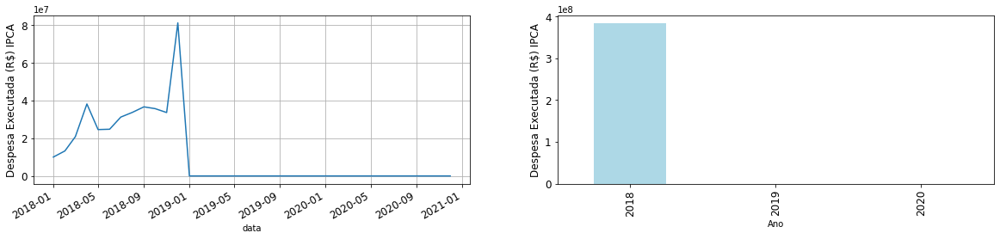

In [158]:
pl.figure(figsize=(20,4))
plot_expenditure(mdr)
pl.show()

In [174]:
i = 11
count_by_category(mdr, mdr.columns[i]).head(50)

,n_registros,valor_realizado
Órgão (UG) DESP,,
AGENCIA NACIONAL DE AGUAS,2310,3.811034e+08
DEPARTAMENTO NAC.DE OBRAS CONTRA AS SECAS,22,2.435704e+06
CIA.DE DES.DOS VALES DO S.FRANC.E DO PARNAIBA,12,0.000000e+00
MINISTERIO DO DESENVOLVIMENTO REGIONAL,48,0.000000e+00


In [162]:
i = 2
count_by_category(mdr, mdr.columns[i])

,n_registros,valor_realizado
Ação Ajustada DESP,,
IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE RECURSOS HÍDRICOS,743,1.226391e+08
ATIVOS CIVIS DA UNIÃO,254,9.766180e+07
TRANSFERÊNCIA DOS RECURSOS DA COBRANÇA ÀS AGÊNCIAS DE ÁGUAS (LEIS Nº 9.433/1997 E Nº 10.881/2004),20,8.126836e+07
ADMINISTRAÇÃO DA UNIDADE,631,3.387573e+07
OPERAÇÃO DA REDE HIDROMETEOROLÓGICA,273,1.914870e+07
"CONTRIBUIÇÃO DA UNIÃO, DE SUAS AUTARQUIAS E FUNDAÇÕES PARA O CUSTEIO DO REGIME DE PREVIDÊNCIA DOS SERVIDORES PÚBLICOS FEDERAIS",18,1.544380e+07
"REGULAÇÃO E FISCALIZAÇÃO DOS USOS DE RECURSOS HÍDRICOS, DOS SERVIÇOS DE IRRIGAÇÃO E ADUÇÃO DE ÁGUA BRUTA E DA SEGURANÇA DE BARRAGENS",188,6.976866e+06
APOSENTADORIAS E PENSÕES CIVIS DA UNIÃO,76,2.669308e+06
"BENEFÍCIOS OBRIGATÓRIOS AOS SERVIDORES CIVIS, EMPREGADOS, MILITARES E SEUS DEPENDENTES",70,2.457573e+06


In [170]:
i = 8
count_by_category(mdr, mdr.columns[i])

,n_registros,valor_realizado
Modalidade Aplicação DESP,,
APLICAÇÕES DIRETAS,2036,2.354075e+08
TRANSFERÊNCIAS A INST. PRIVADAS S/ FINS LUCRATIVOS,37,8.687339e+07
TRANSFERÊNCIAS A ESTADOS E AO DISTRITO FEDERAL,173,3.641264e+07
APLICAÇÕES DIRETAS - OPERAÇÕES INTRA-ORCAMENTÁRIAS,83,1.747079e+07
TRANSFERÊNCIAS AO EXTERIOR,11,3.733426e+06
TRANSFERÊNCIAS A MUNICÍPIOS,52,3.641300e+06


In [178]:
i = 14
count_by_category(mdr, mdr.columns[i]).head(50)

,n_registros,valor_realizado
Autor (Tipo),,
Proposta do Orçamento (Executivo),2377,3.835391e+08
DEPUTADO FEDERAL,11,0.000000e+00
SENADOR,4,0.000000e+00


In [180]:
i = 16
count_by_category(mdr, mdr.columns[i]).head(50)

,n_registros,valor_realizado
UO AC (Ajustada),,
AGÊNCIA NACIONAL DE ÁGUAS - ANA,2342,3.835355e+08
MINISTÉRIO DO MEIO AMBIENTE - ADMINISTRAÇÃO DIRETA,50,3.574012e+03


#### Quanto foi para outros órgãos superiores

In [435]:
by_ano_orgsup = siga.groupby(['Ano', 'Órgão Superior (UG) STD'])['Despesa Executada (R$) IPCA'].sum().reset_index()
by_ano_orgsup = by_ano_orgsup.pivot(index='Ano', columns='Órgão Superior (UG) STD', values='Despesa Executada (R$) IPCA').fillna(0)

total_by_ano  = by_ano_orgsup.sum(axis=1)

In [436]:
sel_by_ano_orgsup = by_ano_orgsup.loc[:2020, by_ano_orgsup.columns != 'MINISTERIO DO MEIO AMBIENTE']
max_val_orgsup = sel_by_ano_orgsup.max().max()

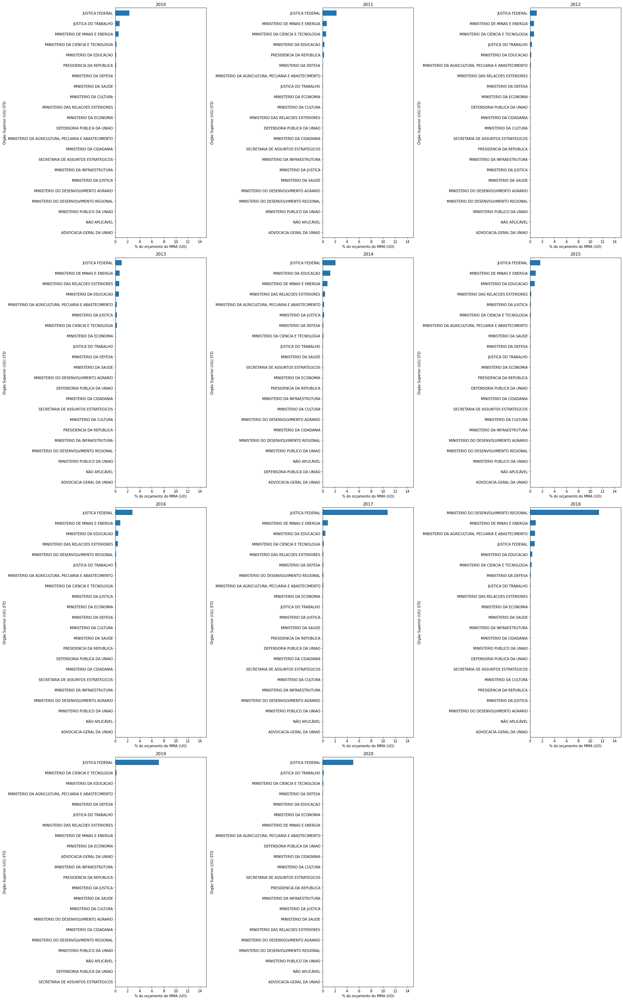

In [437]:
pl.figure(figsize=(25, 40))
for i, ano in enumerate(range(2010, 2021)):
    
    pl.subplot(4, 3, i + 1)
    (sel_by_ano_orgsup.transpose()[ano].sort_values() / total_by_ano[ano] * 100).plot(kind='barh')
    pl.title(ano)
    pl.xlim([0, 15])
    pl.xlabel('% do orçamento do MMA (UO)')

pl.tight_layout()
pl.show()

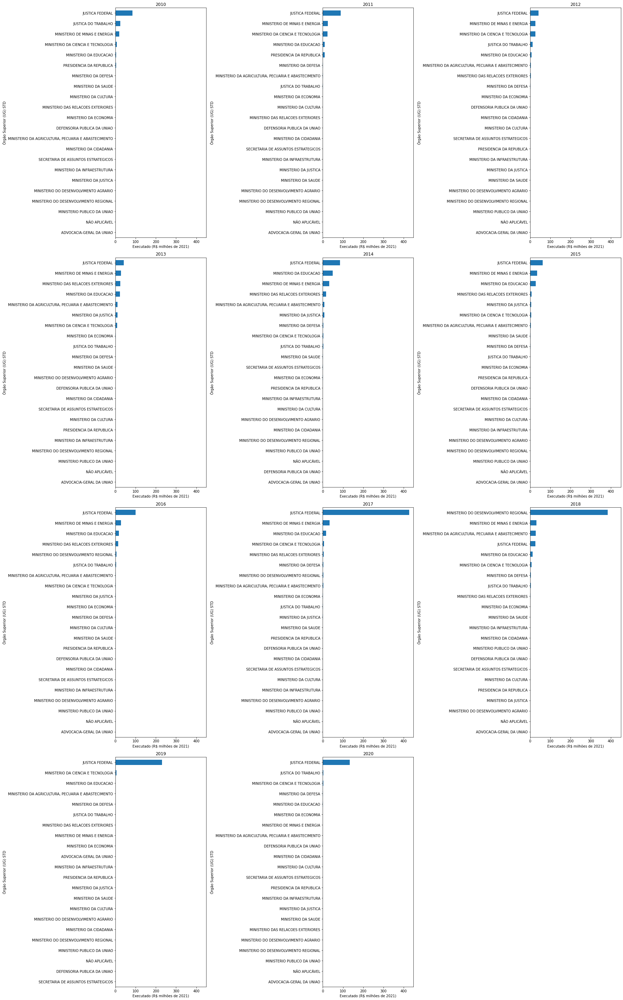

In [438]:
pl.figure(figsize=(25, 40))
for i, ano in enumerate(range(2010, 2021)):
    
    pl.subplot(4, 3, i + 1)
    (sel_by_ano_orgsup.transpose()[ano].sort_values() / 1e6).plot(kind='barh')
    pl.title(ano)
    pl.xlim([0, max_val_orgsup * 1.05 / 1e6])
    pl.xlabel('Executado (R$ milhões de 2021)')
pl.tight_layout()
pl.show()

#### Exemplos

In [77]:
siga.loc[siga['Órgão Superior (UG) DESP'] != 'MINISTERIO DO MEIO AMBIENTE'].sample(5).transpose()

,262980,243215,272217,110645,61778
Mês (Número) DES,6,9,10,12,8
Ano,2018,2017,2018,2012,2011
Ação Ajustada DESP,ADMINISTRAÇÃO DA UNIDADE,IMPLEMENTAÇÃO DA POLÍTICA NACIONAL DE RECURSOS...,CONTROLE E FISCALIZAÇÃO AMBIENTAL,"FOMENTO A PROJETOS DE CONSERVAÇÃO, USO E RECUP...",OPERAÇÃO DA REDE HIDROMETEOROLÓGICA
Subfunção (Ajustada),ADMINISTRAÇÃO - ADMINISTRAÇÃO GERAL,MEIO AMBIENTE - RECURSOS HÍDRICOS,ADMINISTRAÇÃO - NORMATIZAÇÃO E FISCALIZAÇÃO,MEIO AMBIENTE - PRESERVAÇÃO E CONSERVAÇÃO AMBI...,MEIO AMBIENTE - RECURSOS HÍDRICOS
Função DESP,GESTÃO AMBIENTAL,GESTÃO AMBIENTAL,GESTÃO AMBIENTAL,GESTÃO AMBIENTAL,GESTÃO AMBIENTAL
Programa DESP,PROGRAMA DE GESTÃO E MANUTENÇÃO DO MINISTÉRIO ...,RECURSOS HÍDRICOS,QUALIDADE AMBIENTAL,CONSERVAÇÃO E USO SUSTENTÁVEL DA BIODIVERSIDAD...,PROBACIAS - CONSERVAÇÃO DE BACIAS HIDROGRÁFICAS
Categoria Econômica DESP,DESPESAS DE CAPITAL,DESPESAS CORRENTES,DESPESAS CORRENTES,DESPESAS CORRENTES,DESPESAS CORRENTES
GND DESP,INVESTIMENTOS,OUTRAS DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES,OUTRAS DESPESAS CORRENTES
Modalidade Aplicação DESP,APLICAÇÕES DIRETAS,APLICAÇÕES DIRETAS,APLICAÇÕES DIRETAS,APLICAÇÕES DIRETAS,APLICAÇÕES DIRETAS
Elemento Despesa DESP,EQUIPAMENTOS E MATERIAL PERMANENTE,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,MATERIAL DE CONSUMO,OUTROS SERVIÇOS DE TERCEIROS - PESSOA JURÍDICA,MATERIAL DE CONSUMO


# Portal da Transparência

## Captura dos dados

In [9]:
#download_zip_data('http://www.portaltransparencia.gov.br/download-de-dados/orcamento-despesa/2014', '../dados/brutos/orcamento/', True)

In [69]:
# Carrega os dados:
orcamento = pd.concat([pd.read_csv('../dados/brutos/orcamento/{}_OrcamentoDespesa.zip.csv'.format(yr), sep=';', encoding='latin-1') for yr in range(2014, 2022)], 
                      ignore_index=True)

# Parseia valores:
value_cols = ['ORÇAMENTO INICIAL (R$)', 'ORÇAMENTO ATUALIZADO (R$)', 'ORÇAMENTO EMPENHADO (R$)', 'ORÇAMENTO REALIZADO (R$)']
for col in value_cols:
    orcamento[col] = orcamento[col].apply(xu.parse_ptbr_number)
orcamento['NOME CATEGORIA ECONÔMICA'] = orcamento['NOME CATEGORIA ECONÔMICA'].map(xu.translate_dict({'DESPESA CORRENTE':'DESPESAS CORRENTES', 'DESPESA DE CAPITAL':'DESPESAS DE CAPITAL'})) 

In [70]:
# Colunas sem os códigos:
cols_s_codigo = list(filter(lambda s: s.find('CÓDIGO') == -1, orcamento.columns))

In [11]:
xu.unique(orcamento['EXERCÍCIO'])

8: 2014 | 2015 | 2016 | 2017 | 2018 | 2019 | 2020 | 2021


In [27]:
xu.unique(orcamento.loc[orcamento['NOME ÓRGÃO SUPERIOR'] == 'Ministério do Meio Ambiente', 'NOME ÓRGÃO SUBORDINADO'])

6: Fundo Nacional do Meio Ambiente | Fundo Nacional sobre Mudança no Clima | Instituto Brasileiro do Meio Ambiente e dos Recursos Naturais Renováveis | Instituto Chico Mendes de Conservação da Biodiversidade | Instituto de Pesquisas Jardim Botânico do Rio de Janeiro | Ministério do Meio Ambiente - Unidades com vínculo direto


## Exploração dos dados (MMA)

In [12]:
sel_orgaos = ['Instituto Chico Mendes de Conservação da Biodiversidade', 'Instituto Brasileiro do Meio Ambiente e dos Recursos Naturais Renováveis']

In [78]:
orc_icmbio = orcamento.loc[orcamento['NOME ÓRGÃO SUBORDINADO'] == 'Instituto Chico Mendes de Conservação da Biodiversidade']
orc_ibama  = orcamento.loc[orcamento['NOME ÓRGÃO SUBORDINADO'] == 'Instituto Brasileiro do Meio Ambiente e dos Recursos Naturais Renováveis']
orc_fnma   = orcamento.loc[orcamento['NOME ÓRGÃO SUBORDINADO'] == 'Fundo Nacional do Meio Ambiente']
orc_fnmc   = orcamento.loc[orcamento['NOME ÓRGÃO SUBORDINADO'] == 'Fundo Nacional sobre Mudança no Clima']

### IBAMA

In [17]:
xu.unique(orc_ibama['NOME GRUPO DE DESPESA'])

5: Inversões Financeiras | Investimentos | Outras Despesas Correntes | Pessoal e Encargos Sociais | Reserva de Contingência


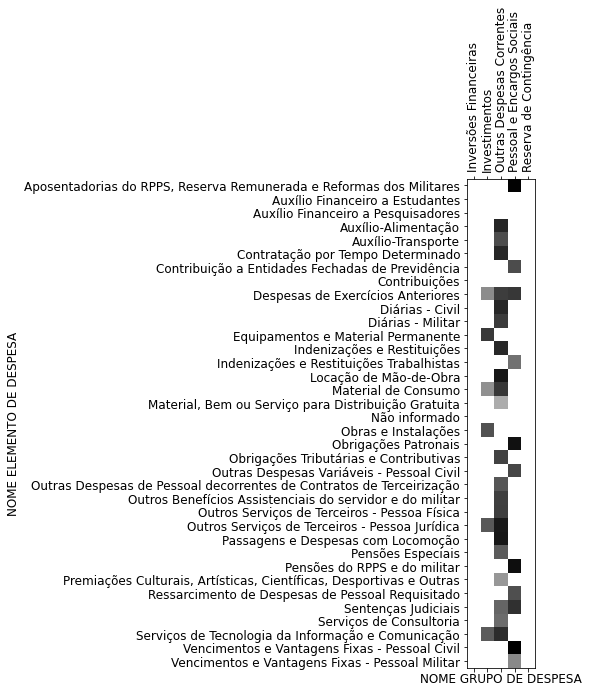

In [22]:
pl.figure(figsize=(9,9))
matrix_plot(orc_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME GRUPO DE DESPESA', 'NOME ELEMENTO DE DESPESA')

* O ponto talvez seja criar várias variáveis de gastos orçamentários e deixar o modelo decidir o que faz mais sentido.

In [14]:
xu.unique(orc_ibama['NOME FUNÇÃO'])
ambiental_ibama = orc_ibama.loc[orc_ibama['NOME FUNÇÃO'] == 'Gestão ambiental']

4: Encargos especiais | Gestão ambiental | Previdência social | Reserva de contingência


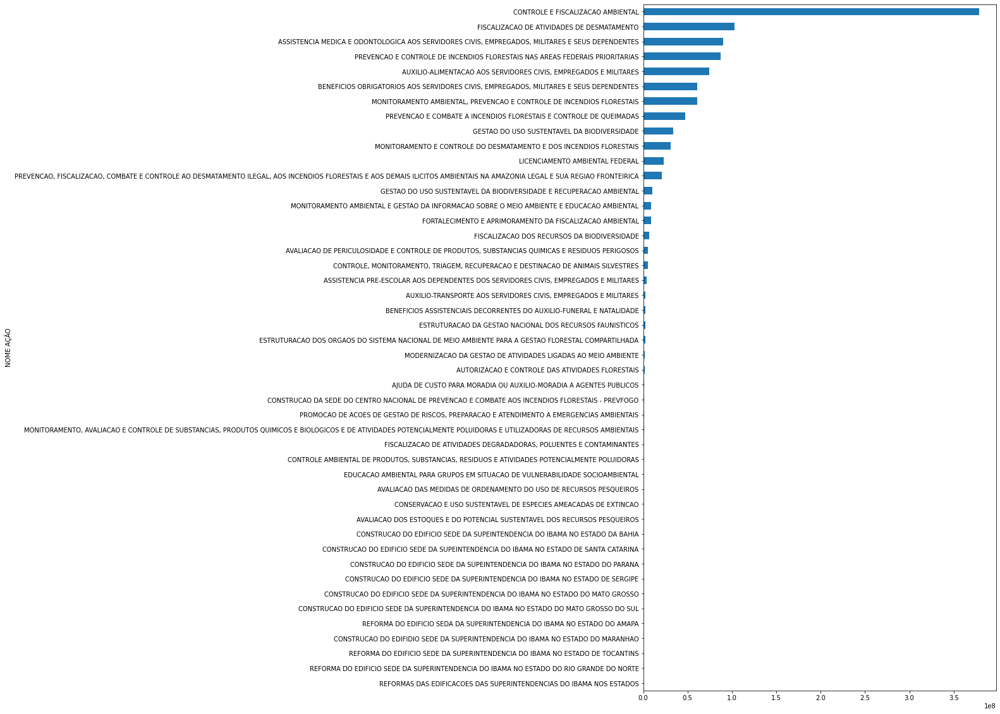

In [15]:
pl.figure(figsize=(10, 20))
ambiental_ibama.groupby('NOME AÇÃO')['ORÇAMENTO REALIZADO (R$)'].sum().sort_values().iloc[:-5].plot(kind='barh')
pl.show()

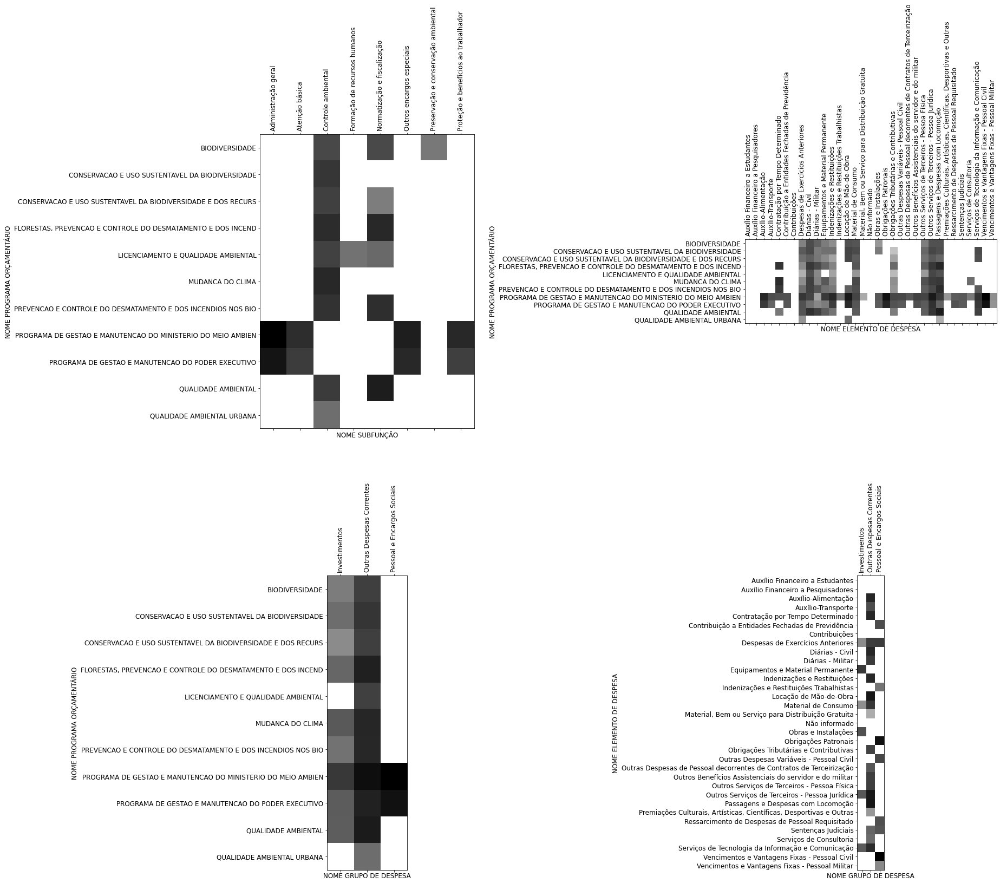

In [126]:
pl.figure(figsize=(25,25))
pl.subplot(2,2,1)
matrix_plot(ambiental_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME SUBFUNÇÃO', 'NOME PROGRAMA ORÇAMENTÁRIO')
pl.subplot(2,2,2)
matrix_plot(ambiental_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME ELEMENTO DE DESPESA', 'NOME PROGRAMA ORÇAMENTÁRIO')
pl.subplot(2,2,3)
matrix_plot(ambiental_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME GRUPO DE DESPESA', 'NOME PROGRAMA ORÇAMENTÁRIO')
pl.subplot(2,2,4)
matrix_plot(ambiental_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME GRUPO DE DESPESA', 'NOME ELEMENTO DE DESPESA')
pl.subplots_adjust(wspace=1, hspace=0.5)
pl.show()

#### Relação entre dimensões

A conclusão é que o melhor é filtrar por função.

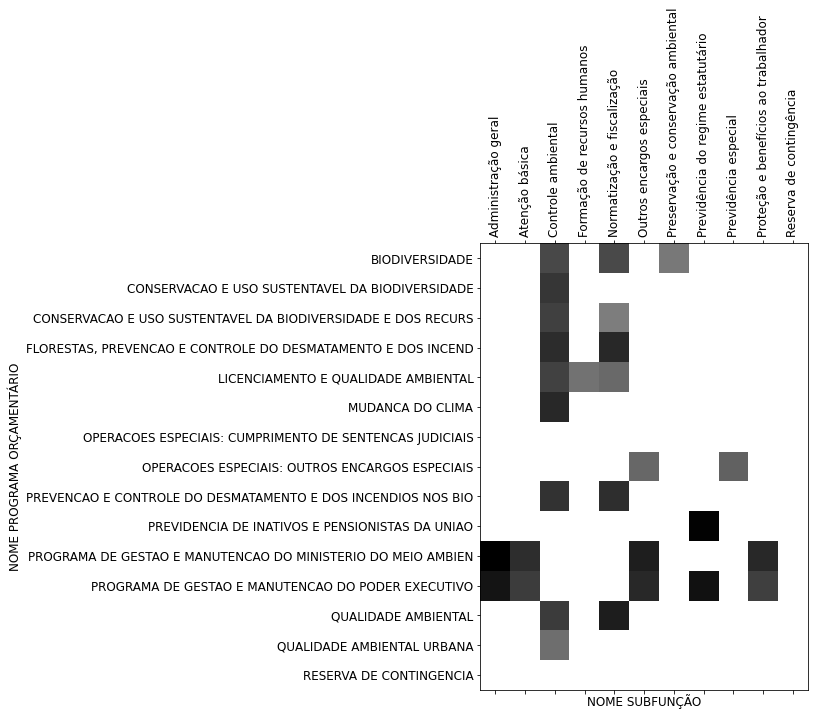

In [76]:
pl.figure(figsize=(8,8))
matrix_plot(orc_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME SUBFUNÇÃO', 'NOME PROGRAMA ORÇAMENTÁRIO')
pl.show()

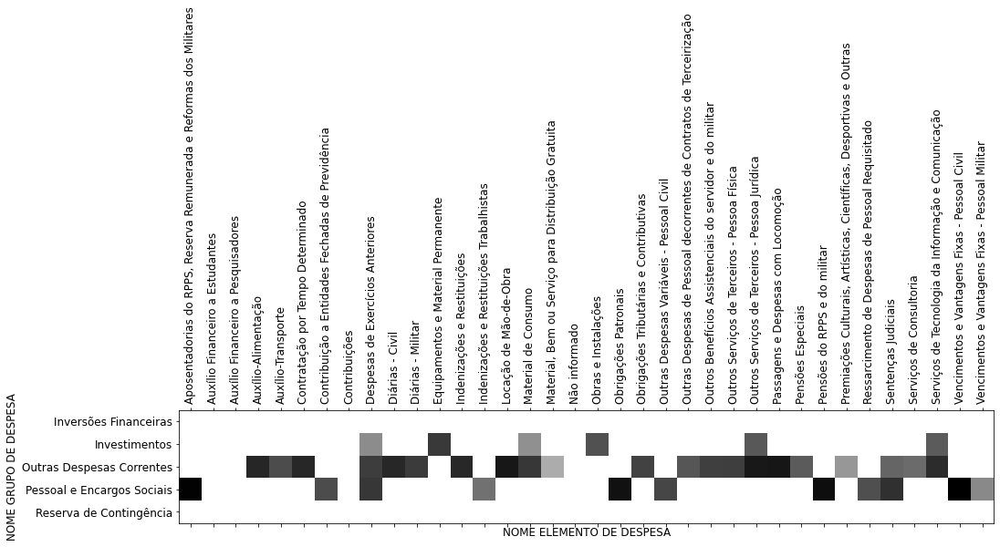

In [89]:
matrix_plot(orc_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME ELEMENTO DE DESPESA', 'NOME GRUPO DE DESPESA')

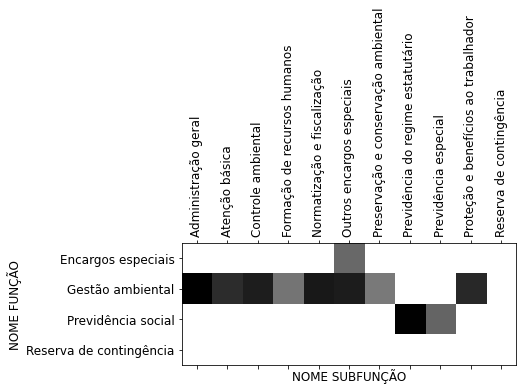

In [104]:
pl.figure(figsize=(6,6))
matrix_plot(orc_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME SUBFUNÇÃO', 'NOME FUNÇÃO')

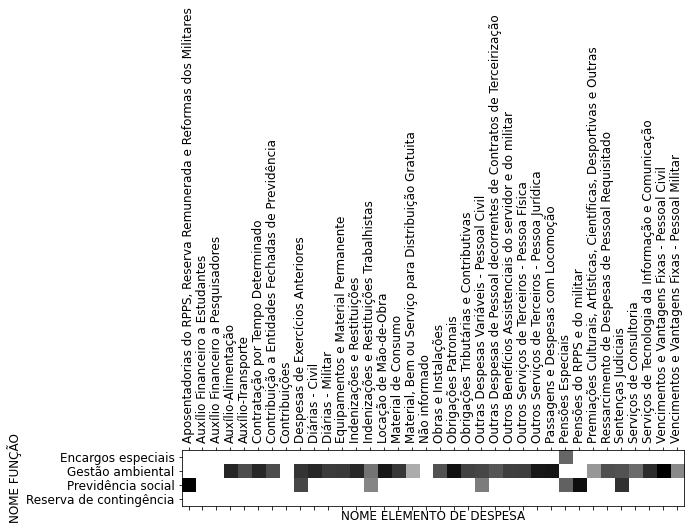

In [107]:
pl.figure(figsize=(9,9))
matrix_plot(orc_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME ELEMENTO DE DESPESA', 'NOME FUNÇÃO')

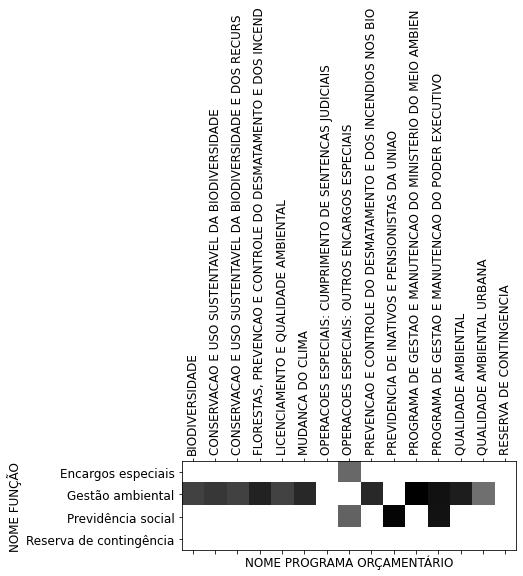

In [108]:
pl.figure(figsize=(6,6))
matrix_plot(orc_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME PROGRAMA ORÇAMENTÁRIO', 'NOME FUNÇÃO')

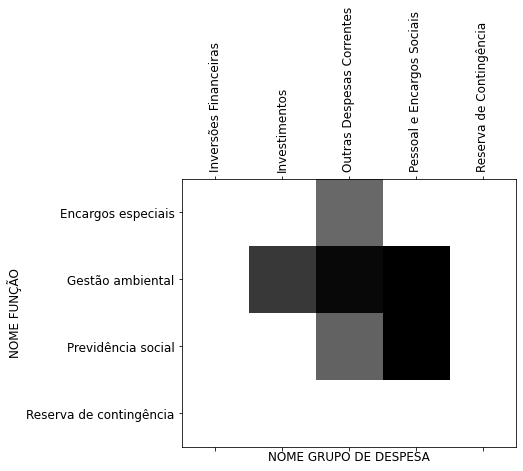

In [105]:
pl.figure(figsize=(6,6))
matrix_plot(orc_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME GRUPO DE DESPESA', 'NOME FUNÇÃO')

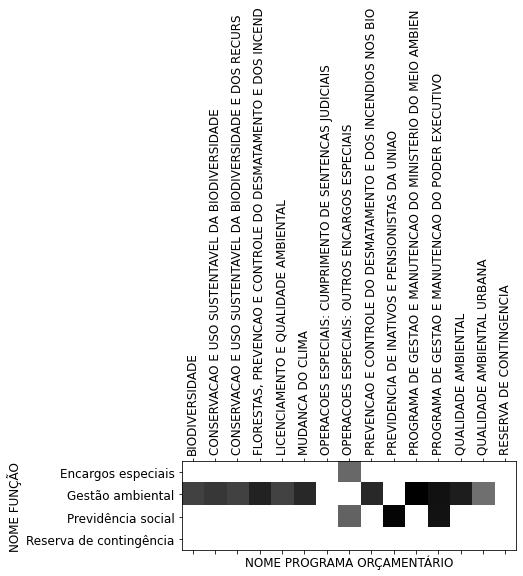

In [103]:
pl.figure(figsize=(6,6))
matrix_plot(orc_ibama, 'ORÇAMENTO REALIZADO (R$)', 'NOME PROGRAMA ORÇAMENTÁRIO', 'NOME FUNÇÃO')

### Fundo Nacional do Meio Ambiente

In [29]:
xu.unique(orc_fnma['NOME FUNÇÃO'])

2: Gestão ambiental | Reserva de contingência


In [30]:
xu.unique(orc_fnma['NOME SUBFUNÇÃO'])

3: Administração geral | Preservação e conservação ambiental | Reserva de contingência


In [31]:
xu.unique(orc_fnma['NOME PROGRAMA ORÇAMENTÁRIO'])

8: BIODIVERSIDADE | CONSERVACAO E USO SUSTENTAVEL DA BIODIVERSIDADE | CONSERVACAO E USO SUSTENTAVEL DA BIODIVERSIDADE E DOS RECURS | LICENCIAMENTO E QUALIDADE AMBIENTAL | PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DO MEIO AMBIEN | PROGRAMA DE GESTAO E MANUTENCAO DO PODER EXECUTIVO | QUALIDADE AMBIENTAL | RESERVA DE CONTINGENCIA


In [32]:
xu.unique(orc_fnma['NOME AÇÃO'])

5: ADMINISTRACAO DA UNIDADE | FOMENTO A PROJETOS DE CONSERVACAO E MANEJO DA BIODIVERSIDADE | FOMENTO A PROJETOS DE DESENVOLVIMENTO SUSTENTAVEL | FOMENTO A PROJETOS DE DESENVOLVIMENTO SUSTENTAVEL E CONSERVACAO DO MEIO AMBIENTE | RESERVA DE CONTINGENCIA - FINANCEIRA


## Exploração básica dos dados

Basicamente, as colunas que existem definem três coisas:

* O órgão responsável pela despesa (três níveis);
* Uma classificação do tipo de despesa (em diversos eixos);
* Um registro contábil da fase da despesa (inicial, atualizado, empenhado, realizado)

### Relação entre colunas com valores em reais

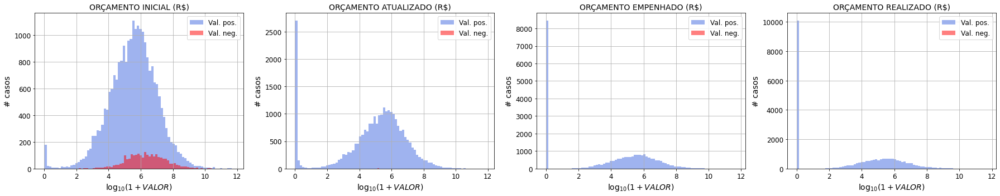

In [36]:
# Com zero:
pl.figure(figsize=(25,5))
for i, col in enumerate(value_cols):
    pl.subplot(1, 4, i + 1)
    plot_loghist(orcamento[col])
pl.tight_layout()
pl.show()

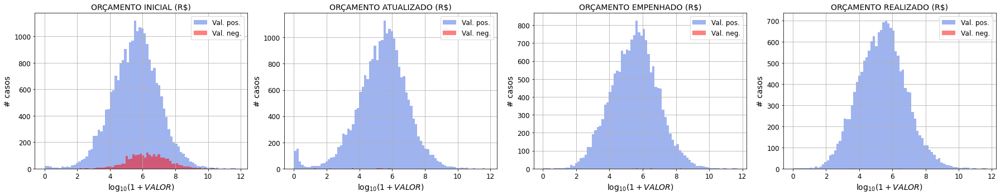

In [37]:
# Ignorando zeros:
pl.figure(figsize=(25,5))
for i, col in enumerate(value_cols):
    pl.subplot(1, 4, i + 1)
    plot_loghist(orcamento.loc[orcamento[col] != 0, col])
pl.tight_layout()
pl.show()

In [42]:
only_pos_values = orcamento.loc[(orcamento[value_cols] >= 0).all(axis=1)]

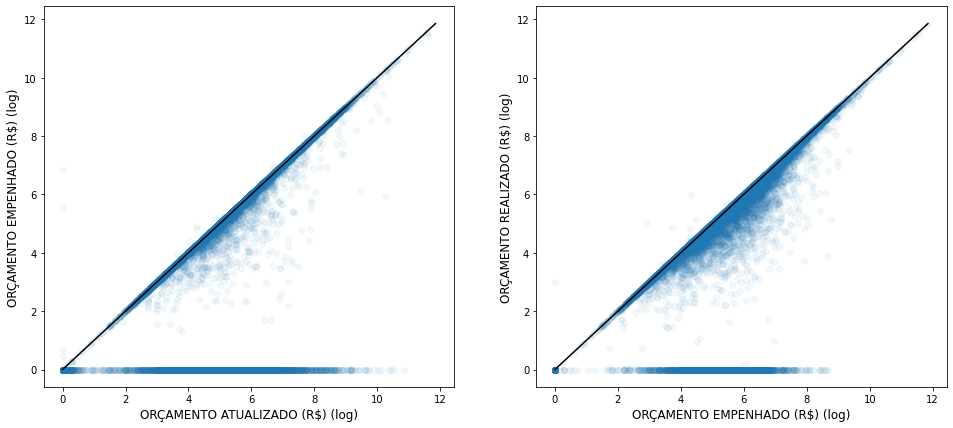

In [43]:
pl.figure(figsize=(25,7))
pl.subplot(1,3,1)
plot_logscatter(only_pos_values, 'ORÇAMENTO ATUALIZADO (R$)', 'ORÇAMENTO EMPENHADO (R$)')
pl.subplot(1,3,2)
plot_logscatter(only_pos_values, 'ORÇAMENTO EMPENHADO (R$)', 'ORÇAMENTO REALIZADO (R$)')
pl.show()

#### Valores negativos

In [76]:
orcamento.loc[orcamento['ORÇAMENTO INICIAL (R$)'] < 0, cols_s_codigo].sample(3)

,EXERCÍCIO,NOME ÓRGÃO SUPERIOR,NOME ÓRGÃO SUBORDINADO,NOME UNIDADE ORÇAMENTÁRIA,NOME FUNÇÃO,NOME SUBFUNÇÃO,NOME PROGRAMA ORÇAMENTÁRIO,NOME AÇÃO,NOME CATEGORIA ECONÔMICA,NOME GRUPO DE DESPESA,NOME ELEMENTO DE DESPESA,ORÇAMENTO INICIAL (R$),ORÇAMENTO ATUALIZADO (R$),ORÇAMENTO EMPENHADO (R$),ORÇAMENTO REALIZADO (R$)
189691,2021,Presidência da República,Presidência da República,PRESIDENCIA DA REPUBLICA,Administração,Administração geral,PROGRAMA DE GESTAO E MANUTENCAO DO PODER EXECU...,ADMINISTRACAO DA UNIDADE,DESPESAS CORRENTES,Outras Despesas Correntes,Não informado,-998429.00,0.00,0.0,0.0
112685,2018,Ministério da Economia,"Instituto Nacional de Metrologia, Qualidade e ...",INSTIT.NAC. DE METROL. QUALID. E TECNOLOGIA,Indústria,Normalização e qualidade,"DESENVOLVIMENTO DA INDUSTRIA, COMERCIO E SERVICOS",PAGAMENTO DE BOLSAS DE PESQUISA EM METROLOGIA ...,DESPESAS CORRENTES,Outras Despesas Correntes,Não informado,-4447800.00,0.00,0.0,0.0
133318,2018,Ministério do Desenvolvimento Regional,Superintendência de Desenvolvimento do Centro-...,SUPERINT. DE DESENV. DO CENTRO-OESTE - SUDECO,Ciência e Tecnologia,Promoção comercial,DESENVOLVIMENTO REGIONAL E TERRITORIAL,PROMOCAO DE INVESTIMENTOS EM INFRAESTRUTURA EC...,DESPESAS DE CAPITAL,Investimentos,Não informado,-709926.38,15288.62,0.0,0.0


In [75]:
orcamento.loc[orcamento['ORÇAMENTO EMPENHADO (R$)'] < 0, cols_s_codigo].sample(3)

,EXERCÍCIO,NOME ÓRGÃO SUPERIOR,NOME ÓRGÃO SUBORDINADO,NOME UNIDADE ORÇAMENTÁRIA,NOME FUNÇÃO,NOME SUBFUNÇÃO,NOME PROGRAMA ORÇAMENTÁRIO,NOME AÇÃO,NOME CATEGORIA ECONÔMICA,NOME GRUPO DE DESPESA,NOME ELEMENTO DE DESPESA,ORÇAMENTO INICIAL (R$),ORÇAMENTO ATUALIZADO (R$),ORÇAMENTO EMPENHADO (R$),ORÇAMENTO REALIZADO (R$)
179696,2020,Ministério de Minas e Energia,Nuclebrás Equipamentos Pesados S.A.,NUCLEBRAS EQUIPAMENTOS PESADOS S/A,Energia,Desenvolvimento tecnológico e engenharia,POLITICA NUCLEAR,FABRICACAO DE EQUIPAMENTOS PESADOS PARA AS IND...,DESPESAS CORRENTES,Outras Despesas Correntes,Indenizações e Restituições,36031.76,36031.76,-13968.24,24632.27
189944,2021,"Ministério da Agricultura, Pecuária e Abasteci...",Companhia Nacional de Abastecimento,REC. SOB. SUP. CIA NAC. ABASTECIMENTO - CONAB,Agricultura,Administração geral,PROGRAMA DE GESTAO E MANUTENCAO DO PODER EXECU...,ATIVOS CIVIS DA UNIAO,DESPESAS CORRENTES,Pessoal e Encargos Sociais,Obrigações Patronais,0.00,0.00,-1743932.26,-62089.81
180253,2020,Ministério de Minas e Energia,Nuclebrás Equipamentos Pesados S.A.,NUCLEBRAS EQUIPAMENTOS PESADOS S/A,Ciência e Tecnologia,Atenção básica,PROGRAMA DE GESTAO E MANUTENCAO DO PODER EXECU...,ASSISTENCIA MEDICA E ODONTOLOGICA AOS SERVIDOR...,DESPESAS CORRENTES,Outras Despesas Correntes,Outros Serviços de Terceiros - Pessoa Física,700000.00,700000.00,-300000.00,139994.65


In [77]:
orcamento.loc[orcamento['ORÇAMENTO REALIZADO (R$)'] < 0, cols_s_codigo].sample(3)

,EXERCÍCIO,NOME ÓRGÃO SUPERIOR,NOME ÓRGÃO SUBORDINADO,NOME UNIDADE ORÇAMENTÁRIA,NOME FUNÇÃO,NOME SUBFUNÇÃO,NOME PROGRAMA ORÇAMENTÁRIO,NOME AÇÃO,NOME CATEGORIA ECONÔMICA,NOME GRUPO DE DESPESA,NOME ELEMENTO DE DESPESA,ORÇAMENTO INICIAL (R$),ORÇAMENTO ATUALIZADO (R$),ORÇAMENTO EMPENHADO (R$),ORÇAMENTO REALIZADO (R$)
182334,2020,Ministério da Infraestrutura,"VALEC Engenharia, Construções e Ferrovias S.A.","VALEC-ENGENHARIA, CONSTRUCOES E FERROVIAS S/A",Transporte,Administração geral,PROGRAMA DE GESTAO E MANUTENCAO DO PODER EXECU...,"APOIO AO PLANEJAMENTO, GERENCIAMENTO E ACOMPAN...",DESPESAS CORRENTES,Outras Despesas Correntes,Diárias - Civil,0.0,0.0,-50000.0,-18192.13
151824,2019,Ministério da Justiça e Segurança Pública,Ministério da Justiça e Segurança Pública - Un...,MINISTERIO DA SEGURANCA PUBLICA,Segurança pública,Administração geral,PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO ...,ATIVOS CIVIS DA UNIAO,DESPESAS CORRENTES,Pessoal e Encargos Sociais,Vencimentos e Vantagens Fixas - Pessoal Civil,0.0,0.0,-201664633.0,-2859718.15
208579,2021,Ministério do Desenvolvimento Regional,Companhia de Desenvolvimento dos Vales do São ...,RECURSOS SOB SUPERVISAO DA CODEVASF,Administração,Administração geral,PROGRAMA DE GESTAO E MANUTENCAO DO PODER EXECU...,ATIVOS CIVIS DA UNIAO,DESPESAS CORRENTES,Pessoal e Encargos Sociais,Obrigações Patronais,0.0,0.0,0.0,-30255.26


### Relação de guarda-chuva entre colunas

In [411]:
orcamento.columns

Index(['EXERCÍCIO', 'CÓDIGO ÓRGÃO SUPERIOR', 'NOME ÓRGÃO SUPERIOR',
       'CÓDIGO ÓRGÃO SUBORDINADO', 'NOME ÓRGÃO SUBORDINADO',
       'CÓDIGO UNIDADE ORÇAMENTÁRIA', 'NOME UNIDADE ORÇAMENTÁRIA',
       'CÓDIGO FUNÇÃO', 'NOME FUNÇÃO', 'CÓDIGO SUBFUNÇÃO', 'NOME SUBFUNÇÃO',
       'CÓDIGO PROGRAMA ORÇAMENTÁRIO', 'NOME PROGRAMA ORÇAMENTÁRIO',
       'CÓDIGO AÇÃO', 'NOME AÇÃO', 'CÓDIGO CATEGORIA ECONÔMICA',
       'NOME CATEGORIA ECONÔMICA', 'CÓDIGO GRUPO DE DESPESA',
       'NOME GRUPO DE DESPESA', 'CÓDIGO ELEMENTO DE DESPESA',
       'NOME ELEMENTO DE DESPESA', 'ORÇAMENTO INICIAL (R$)',
       'ORÇAMENTO ATUALIZADO (R$)', 'ORÇAMENTO EMPENHADO (R$)',
       'ORÇAMENTO REALIZADO (R$)'],
      dtype='object')

#### Colunas de órgãos

As unidades orçamentárias estão totalmente contidas nos órgãos, e estes nos superiores. 

In [412]:
check_guarda_compartilhada(orcamento, 'NOME ÓRGÃO SUBORDINADO', 'NOME ÓRGÃO SUPERIOR')

Series([], Name: NOME ÓRGÃO SUPERIOR, dtype: object)

In [413]:
check_guarda_compartilhada(orcamento, 'NOME ÓRGÃO SUBORDINADO', 'NOME ÓRGÃO SUPERIOR')

Series([], Name: NOME ÓRGÃO SUPERIOR, dtype: object)

#### Classificação das despesas

**Conclusões**

* As sub-funções podem ter o mesmo nome e estarem subordinadas a funções diferentes, por ex.: A sub-função "Administração de concessões" pode aparecer na função "Energia" e na "Transporte".
* A FUNÇÃO é quase que o nome de um ministério: são os grandes temas. Entretanto, ela não fica vinculada ao ministério em questão.
* O PROGRAMA é algo próximo do que o governo costuma chamar de programa, e.g.: Programa espacial brasileiro, Vigilância em saúde, etc.
* A AÇÃO é algo bastante específico daquele gasto.
* GRUPO DE DESPESA é subcaterogia de CATEGORIA ECONÔMICA
* O ELEMENTO DE DESPESA não está circunscrito nem à categoria econômica e nem ao grupo de despesa

**SUBFUNÇÃO**

In [414]:
xu.unique(orcamento['NOME SUBFUNÇÃO'])

97: Abastecimento | Administração de concessões | Administração de receitas | Administração financeira | Administração geral | Alimentação e nutrição | Assistência ao idoso | Assistência ao portador de deficiência | Assistência aos povos indígenas | Assistência comunitária | Assistência hospitalar e ambulatorial | Assistência à criança e ao adolescente | Atenção básica | Ação legislativa | Biocombustíveis | Combustíveis | Comunicação social | Comércio exterior | Controle ambiental | Controle interno | Cooperação internacional | Custódia e reintegração social | Defesa agropecuária | Defesa aérea | Defesa civil | Defesa naval | Defesa terrestre | Desenvolvimento científico | Desenvolvimento tecnológico e engenharia | Desporto comunitário | Desporto de rendimento | Difusão cultural | Difusão do conhecimento científico e tecnológico | Direitos individuais, coletivos e difusos | Educação básica | Educação de jovens e adultos | Educação infantil | Empregabilidade | Energia elétrica | Ensino 

In [415]:
print_array_series(check_guarda_compartilhada(orcamento, 'NOME SUBFUNÇÃO', 'NOME FUNÇÃO'))

Abastecimento: Agricultura / Organização agrária
Administração de concessões: Energia / Indústria / Transporte
Administração financeira: Administração / Trabalho / Educação / Cultura
Administração geral: Direitos da cidadania / Administração / Segurança pública / Comércio e serviços / Transporte / Agricultura / Gestão ambiental / Organização agrária / Ciência e Tecnologia / Indústria / Previdência social / Trabalho / Educação / Energia / Relações exteriores / Saúde / Urbanismo / Comunicações / Cultura / Desporto e lazer / Defesa nacional / Habitação / Assistência social / Essencial à justiça
Alimentação e nutrição: Educação / Saúde / Assistência social
Assistência ao idoso: Direitos da cidadania / Assistência social
Assistência ao portador de deficiência: Direitos da cidadania / Assistência social
Assistência aos povos indígenas: Direitos da cidadania / Saúde
Assistência comunitária: Organização agrária / Defesa nacional / Urbanismo / Assistência social
Assistência hospitalar e ambulat

**FUNÇÃO**

In [416]:
xu.unique(orcamento['NOME FUNÇÃO'])

27: Administração | Agricultura | Assistência social | Ciência e Tecnologia | Comunicações | Comércio e serviços | Cultura | Defesa nacional | Desporto e lazer | Direitos da cidadania | Educação | Encargos especiais | Energia | Essencial à justiça | Gestão ambiental | Habitação | Indústria | Organização agrária | Previdência social | Relações exteriores | Reserva de contingência | Saneamento | Saúde | Segurança pública | Trabalho | Transporte | Urbanismo


In [417]:
print_array_series(check_guarda_compartilhada(orcamento, 'NOME FUNÇÃO', 'NOME ÓRGÃO SUPERIOR'))

Administração: Presidência da República / Ministério do Planejamento, Desenvolvimento e Gestão / Ministério da Economia / Ministério da Justiça e Segurança Pública / Ministério de Minas e Energia / Controladoria-Geral da União / Ministério das Comunicações / Ministério do Desenvolvimento Regional / Ministério das Cidades / Advocacia-Geral da União
Agricultura: Ministério da Agricultura, Pecuária e Abastecimento / Ministério da Economia / Ministério do Desenvolvimento Regional / Ministério da Pesca e Aquicultura
Assistência social: Ministério da Economia / Ministério do Desenvolvimento Regional / Ministério da Cidadania
Ciência e Tecnologia: Ministério da Ciência, Tecnologia, Inovações e Comunicações / Ministério de Minas e Energia / Ministério do Desenvolvimento Regional
Comércio e serviços: Presidência da República / Ministério da Economia / Ministério da Indústria, Comércio Exterior e Serviços / Ministério do Turismo
Cultura: Ministério da Justiça e Segurança Pública / Ministério da 

**PROGRAMA ORÇAMENTÁRIO**

In [418]:
xu.unique(orcamento['NOME PROGRAMA ORÇAMENTÁRIO'])

108: AGRICULTURA FAMILIAR | AGRICULTURA IRRIGADA | AGROPECUARIA SUSTENTAVEL, ABASTECIMENTO E COMERCIALIZACAO | APERFEICOAMENTO DO SISTEMA UNICO DE SAUDE (SUS) | AUTONOMIA E EMANCIPACAO DA JUVENTUDE | AVIACAO CIVIL | BIODIVERSIDADE | BOLSA FAMILIA | CIDADANIA E JUSTICA | CIENCIA, TECNOLOGIA E INOVACAO | COMBUSTIVEIS | COMERCIO E SERVICOS | COMERCIO EXTERIOR | COMUNICACOES PARA O DESENVOLVIMENTO, A INCLUSAO E A DEMOCRAC | CONSERVACAO E GESTAO DE RECURSOS HIDRICOS | COORDENACAO DE POLITICAS DE PREVENCAO, ATENCAO E REINSERCAO | CULTURA: PRESERVACAO, PROMOCAO E ACESSO | DEFESA AGROPECUARIA | DEMOCRACIA E APERFEICOAMENTO DA GESTAO PUBLICA | DESENVOLVIMENTO PRODUTIVO | DESENVOLVIMENTO REGIONAL, TERRITORIAL SUSTENTAVEL E ECONOMIA | EDUCACAO BASICA | EDUCACAO PROFISSIONAL E TECNOLOGICA | EDUCACAO SUPERIOR - GRADUACAO, POS-GRADUACAO, ENSINO, PESQUI | ENERGIA ELETRICA | ENFRENTAMENTO AO RACISMO E PROMOCAO DA IGUALDADE RACIAL | ESPORTE E GRANDES EVENTOS ESPORTIVOS | FLORESTAS, PREVENCAO E CONTROLE

In [419]:
print_array_series(check_guarda_compartilhada(orcamento, 'NOME AÇÃO', 'NOME PROGRAMA ORÇAMENTÁRIO'))

ADMINISTRACAO DA UNIDADE: PROGRAMA DE GESTAO E MANUTENCAO DA SECRETARIA DE DIREITOS HU / PROGRAMA DE GESTAO E MANUTENCAO DA PRESIDENCIA DA REPUBLICA / PROGRAMA DE GESTAO E MANUTENCAO DA SECRETARIA DE POLITICAS D / PROGRAMA DE GESTAO E MANUTENCAO DA SECRETARIA DE POLITICAS P / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DO PLANEJAMENT / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DA AGRICULTURA / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DO MEIO AMBIEN / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DO DESENVOLVIM / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DA CIENCIA, TE / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DA PREVIDENCIA / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DO TRABALHO E / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DA FAZENDA / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DA EDUCACAO / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DA JUSTICA / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DE MINAS E ENE / PROGRAMA DE GESTAO E MANUTENCAO DO MINISTE

In [420]:
xu.unique(orcamento['NOME AÇÃO'])

1990: ABASTECIMENTO PUBLICO DE AGUA EM COMUNIDADES RIBEIRINHAS DO RIO SAO FRANCISCO - AGUA PARA TODOS | ABONO SALARIAL | ACESSO A AGUA PARA CONSUMO HUMANO E PRODUCAO DE ALIMENTOS NA ZONA RURAL | ACESSO A INFORMACAO CIENTIFICA E TECNOLOGICA | ACOES COMPLEMENTARES DE PROTECAO SOCIAL BASICA | ACOES DE CARATER SIGILOSO | ACOES DE COOPERACAO DA MARINHA | ACOES DE COOPERACAO DO EXERCITO | ACOES DE DEFESA CIVIL | ACOES DE INTELIGENCIA | ACOES INTEGRADAS DE CULTURA E EDUCACAO | ACOMPANHAMENTO E CONTROLE DE ATIVIDADES ECONOMICAS | ADEQUACAO DA INFRAESTRUTURA DOS PELOTOES ESPECIAIS DE FRONTEIRA DA REGIAO DO CALHA NORTE | ADEQUACAO DA SEGUNDA PONTE EM VITORIA - NA BR-262/ES | ADEQUACAO DA VIA EXPRESSA DE FLORIANOPOLIS - NA BR-282/SC | ADEQUACAO DE ACESSO RODOVIARIO AO PORTO DE ARATU (BA-522) - NA BR-324/BA | ADEQUACAO DE ACESSO RODOVIARIO AO PORTO DE IMBITUBA - NA BR-101/SC | ADEQUACAO DE ACESSO RODOVIARIO AO PORTO DE ITAGUAI - NA BR-101/RJ | ADEQUACAO DE ACESSO RODOVIARIO AO PORTO DE ITAJAI - NA

**CATEGORIA ECONÔMICA E GRUPO DE DESPESA**

In [421]:
print(xu.Bold('CATEGORIA ECONÔMICA'))
xu.unique(orcamento['NOME CATEGORIA ECONÔMICA'])
print(xu.Bold('GRUPO DE DESPESA'))
xu.unique(orcamento['NOME GRUPO DE DESPESA'])
print('É subcategoria')
check_guarda_compartilhada(orcamento, 'NOME GRUPO DE DESPESA', 'NOME CATEGORIA ECONÔMICA')

CATEGORIA ECONÔMICA
3: DESPESA CORRENTE | DESPESA DE CAPITAL | RESERVA DE CONTINGENCIA
GRUPO DE DESPESA
7: Amortização/Refinanciamento da Dívida | Inversões Financeiras | Investimentos | Juros e Encargos da Dívida | Outras Despesas Correntes | Pessoal e Encargos Sociais | Reserva de Contingência
É subcategoria


Series([], Name: NOME CATEGORIA ECONÔMICA, dtype: object)

In [422]:
print(xu.Bold('Desdobramentos'))
print_array_series(check_guarda_compartilhada(orcamento, 'NOME CATEGORIA ECONÔMICA', 'NOME GRUPO DE DESPESA'))
# Reserva de contingência é só reserva de contingência
orcamento.loc[orcamento['NOME CATEGORIA ECONÔMICA'] == 'RESERVA DE CONTINGENCIA', 'NOME GRUPO DE DESPESA'].unique()

Desdobramentos
DESPESA CORRENTE: Outras Despesas Correntes / Pessoal e Encargos Sociais / Juros e Encargos da Dívida
DESPESA DE CAPITAL: Investimentos / Inversões Financeiras / Amortização/Refinanciamento da Dívida


array(['Reserva de Contingência'], dtype=object)

In [423]:
check_guarda_compartilhada(orcamento, 'NOME ELEMENTO DE DESPESA', 'NOME CATEGORIA ECONÔMICA')

NOME ELEMENTO DE DESPESA
Auxílio Financeiro a Estudantes                              [DESPESA CORRENTE, DESPESA DE CAPITAL]
Auxílio Financeiro a Pesquisadores                           [DESPESA CORRENTE, DESPESA DE CAPITAL]
Contratação por Tempo Determinado                            [DESPESA CORRENTE, DESPESA DE CAPITAL]
Contribuições                                                [DESPESA CORRENTE, DESPESA DE CAPITAL]
Despesas de Exercícios Anteriores                            [DESPESA CORRENTE, DESPESA DE CAPITAL]
Diárias - Civil                                              [DESPESA CORRENTE, DESPESA DE CAPITAL]
Diárias - Militar                                            [DESPESA CORRENTE, DESPESA DE CAPITAL]
Indenizações e Restituições                                  [DESPESA CORRENTE, DESPESA DE CAPITAL]
Locação de Mão-de-Obra                                       [DESPESA CORRENTE, DESPESA DE CAPITAL]
Material de Consumo                                          [DESPESA CORRE

In [424]:
xu.unique(orcamento['NOME ELEMENTO DE DESPESA'])

72: A Classificar | Aposentadorias do RGPS - Área Rural | Aposentadorias do RGPS - Área Urbana | Aposentadorias do RPPS, Reserva Remunerada e Reformas dos Militares | Aquisição de Títulos Representativos de Capital já Integralizado | Aquisição de bens para revenda | Aquisição de imóveis | Arrendamento mercantil | Auxílio Financeiro a Estudantes | Auxílio Financeiro a Pesquisadores | Auxílio-Alimentação | Auxílio-Fardamento | Auxílio-Transporte | Auxílios | Benefício Mensal ao Deficiente e ao Idoso | Compensações ao RGPS | Concessão de Empréstimos e Financiamentos | Constituição ou Aumento de Capital de Empresas | Contratação por Tempo Determinado | Contribuição a Entidades Fechadas de Previdência | Contribuições | Depósitos compulsórios | Despesas de Exercícios Anteriores | Distribuição Constitucional ou Legal de Receitas | Distribuição de Resultado de Empresas Estatais Dependentes | Diárias - Civil | Diárias - Militar | Encargos pela Honra de Avais, Garantias, Seguros e Similares | Eq

### Relação entre nome e código das colunas

**Conclusões**

* Quase existe uma relação biunívoca entre códigos e nomes das colunas
* Uma unidade orçamentária pode ter mais de um código.
* Programas podem ter mais de um nome ou código.
* Ações podem ter mais de um nome ou código.

In [425]:
xu.one2oneQ(orcamento, 'CÓDIGO ÓRGÃO SUPERIOR', 'NOME ÓRGÃO SUPERIOR')

True

In [426]:
xu.one2oneQ(orcamento, 'CÓDIGO ÓRGÃO SUBORDINADO', 'NOME ÓRGÃO SUBORDINADO')

True

In [427]:
xu.one2oneQ(orcamento, 'CÓDIGO UNIDADE ORÇAMENTÁRIA', 'NOME UNIDADE ORÇAMENTÁRIA')

True

In [428]:
xu.one2oneViolations(orcamento, 'CÓDIGO UNIDADE ORÇAMENTÁRIA', 'NOME UNIDADE ORÇAMENTÁRIA')

Series([], Name: NOME UNIDADE ORÇAMENTÁRIA, dtype: object)

In [429]:
xu.one2oneViolations(orcamento, 'NOME UNIDADE ORÇAMENTÁRIA', 'CÓDIGO UNIDADE ORÇAMENTÁRIA')

Series([], Name: CÓDIGO UNIDADE ORÇAMENTÁRIA, dtype: object)

In [430]:
xu.one2oneQ(orcamento, 'CÓDIGO FUNÇÃO', 'NOME FUNÇÃO')

True

In [431]:
xu.one2oneQ(orcamento, 'CÓDIGO SUBFUNÇÃO', 'NOME SUBFUNÇÃO')

True

In [432]:
xu.one2oneQ(orcamento, 'CÓDIGO PROGRAMA ORÇAMENTÁRIO', 'NOME PROGRAMA ORÇAMENTÁRIO')

False

In [433]:
xu.one2oneViolations(orcamento, 'CÓDIGO PROGRAMA ORÇAMENTÁRIO', 'NOME PROGRAMA ORÇAMENTÁRIO')

Series([], Name: NOME PROGRAMA ORÇAMENTÁRIO, dtype: object)

In [434]:
xu.one2oneViolations(orcamento, 'NOME PROGRAMA ORÇAMENTÁRIO', 'CÓDIGO PROGRAMA ORÇAMENTÁRIO')

NOME PROGRAMA ORÇAMENTÁRIO
PROGRAMA DE GESTAO E MANUTENCAO DO MINISTERIO DO DESENVOLVIM    [2120, 2121, 2122]
Name: CÓDIGO PROGRAMA ORÇAMENTÁRIO, dtype: object

In [435]:
xu.one2oneQ(orcamento, 'CÓDIGO AÇÃO', 'NOME AÇÃO')

False

In [436]:
xu.one2oneViolations(orcamento, 'CÓDIGO AÇÃO', 'NOME AÇÃO')

Series([], Name: NOME AÇÃO, dtype: object)

In [437]:
xu.one2oneViolations(orcamento, 'NOME AÇÃO', 'CÓDIGO AÇÃO')

NOME AÇÃO
PARTICIPACAO DA UNIAO NO CAPITAL - COMPANHIA DOCAS DO CEARA - IMPLANTACAO DO SISTEMA DE APOIO AO GERENCIAMENTO DA INFRAESTRUTURA PORTUARIA             [00NM, 00IR]
PARTICIPACAO DA UNIAO NO CAPITAL - COMPANHIA DOCAS DO ESPIRITO SANTO - IMPLANTACAO DO SISTEMA DE APOIO AO GERENCIAMENTO DA INFRAESTRUTURA PORTUARIA    [00NL, 00IU]
Name: CÓDIGO AÇÃO, dtype: object

In [438]:
xu.one2oneQ(orcamento, 'CÓDIGO CATEGORIA ECONÔMICA', 'NOME CATEGORIA ECONÔMICA')

True

In [439]:
xu.one2oneQ(orcamento, 'CÓDIGO GRUPO DE DESPESA', 'NOME GRUPO DE DESPESA')

True

In [440]:
xu.one2oneQ(orcamento, 'CÓDIGO ELEMENTO DE DESPESA', 'NOME ELEMENTO DE DESPESA')

True

### Tipos de conteúdo das colunas

In [12]:
xu.checkMissing(orcamento)

Colunas com valores faltantes:
Empty DataFrame
Columns: [coluna, N, %]
Index: []


In [13]:
xu.mapUnique(orcamento)


EXERCÍCIO: 1 unique values.
2021

CÓDIGO ÓRGÃO SUPERIOR: 19 unique values.
20000,  22000,  24000,  25000,  26000,  30000,  32000,  35000,  36000,  37000,  39000,  41000,  44000,  52000,  53000,  54000,  55000,  63000,  81000

NOME ÓRGÃO SUPERIOR: 19 unique values.
Advocacia-Geral da União,  Controladoria-Geral da União,  Ministério da Agricultura, Pecuária e Abastecimento,  Ministério da Cidadania,  Ministério da Ciência, Tecnologia, Inovações e Comunicações,  Ministério da Defesa,  Ministério da Economia,  Ministério da Educação,  Ministério da Infraestrutura,  Ministério da Justiça e Segurança Pública,  Ministério da Mulher, Família e Direitos Humanos,  Ministério da Saúde,  Ministério das Comunicações,  Ministério das Relações Exteriores,  Ministério de Minas e Energia,  Ministério do Desenvolvimento Regional,  Ministério do Meio Ambiente,  Ministério do Turismo,  Presidência da República

CÓDIGO ÓRGÃO SUBORDINADO: 248 unique values.
(sample) 20302,  20303,  20408,  24208,  26238, 

# Lixo

In [32]:
# Seleção correta, mas remove pouco dos gastos:
sel = executado_s_prev_jud.loc[~executado_s_prev_jud['GND DESP'].isin(['AMORTIZACAO DA DIVIDA', 'JUROS E ENCARGOS DA DIVIDA'])]

## Teste de reshape de dados com lag

In [106]:
from statsmodels.tsa.tsatools import lagmat2ds

In [125]:
X = pd.DataFrame(data=np.array([[1, 10, 100], [2, 20, 200], [3, 30, 300], [4, 40, 400], [5,50,500]]), columns=['y', 'x', 'z'])

In [138]:
lagmat2ds(X, 2, trim='both', dropex=1, use_pandas=True)

,y,y.L.1,y.L.2,x.L.1,x.L.2,z.L.1,z.L.2
2,3.0,2.0,1.0,20.0,10.0,200.0,100.0
3,4.0,3.0,2.0,30.0,20.0,300.0,200.0
4,5.0,4.0,3.0,40.0,30.0,400.0,300.0
